## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib qt

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        cv2.imshow('img',img)
        cv2.waitKey(500)

cv2.destroyAllWindows()

# Save the calibration matrix and distortion coefficients

import pickle
%matplotlib notebook



img = cv2.imread('./camera_cal/calibration1.jpg')
img_size = img.shape[0:2]

print(img_size)

ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)

undist = cv2.undistort(img, mtx, dist, None, mtx)

#save the calibration results
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump(dist_pickle, open("./camera_cal/dist_pickle.p", "wb"))

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(undist)
ax2.set_title('Undistorted Image', fontsize=30)

# Load and test distortion and warp perspective

True


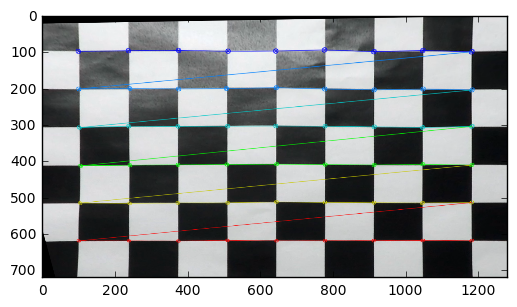

In [1]:
import pickle
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

# Read in the saved camera matrix and distortion coefficients
# These are the arrays you calculated using cv2.calibrateCamera()
dist_pickle = pickle.load(open( "./camera_cal/dist_pickle.p", "rb"))
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]

# Read in an image
img = cv2.imread('./camera_cal/calibration3.jpg')
nx = 9 # the number of inside corners in x
ny = 6 # the number of inside corners in y

def corners_unwarp(img, nx, ny, mtx, dist):
    # Use the OpenCV undistort() function to remove distortion
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    # Convert undistorted image to grayscale
    gray = cv2.cvtColor(undist, cv2.COLOR_BGR2GRAY)
    # Search for corners in the grayscaled image
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    print(ret)
    warped = None
    M = None
    if ret == True:
        # If we found corners, draw them! (just for fun)
        cv2.drawChessboardCorners(undist, (nx, ny), corners, ret)
        # Choose offset from image corners to plot detected corners
        # This should be chosen to present the result at the proper aspect ratio
        # My choice of 100 pixels is not exact, but close enough for our purpose here
        offset = 100 # offset for dst points
        # Grab the image shape
        img_size = (gray.shape[1], gray.shape[0])

        # For source points I'm grabbing the outer four detected corners
        src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
        # For destination points, I'm arbitrarily choosing some points to be
        # a nice fit for displaying our warped result 
        # again, not exact, but close enough for our purposes
        dst = np.float32([[offset, offset], [img_size[0]-offset, offset], 
                                     [img_size[0]-offset, img_size[1]-offset], 
                                     [offset, img_size[1]-offset]])
        # Given src and dst points, calculate the perspective transform matrix
        M = cv2.getPerspectiveTransform(src, dst)
        # Warp the image using OpenCV warpPerspective()
        warped = cv2.warpPerspective(undist, M, img_size)

    # Return the resulting image and matrix
    return warped, M

warped_img, M = corners_unwarp(img, nx, ny, mtx, dist)

plt.imshow(warped_img)




In [2]:
import glob
image_files = glob.glob('./test_images/*.jpg')

images = []
for fname in image_files:
    img = plt.imread(fname)
    images.append(img)
    
print(len(images))

image = images[0]

8


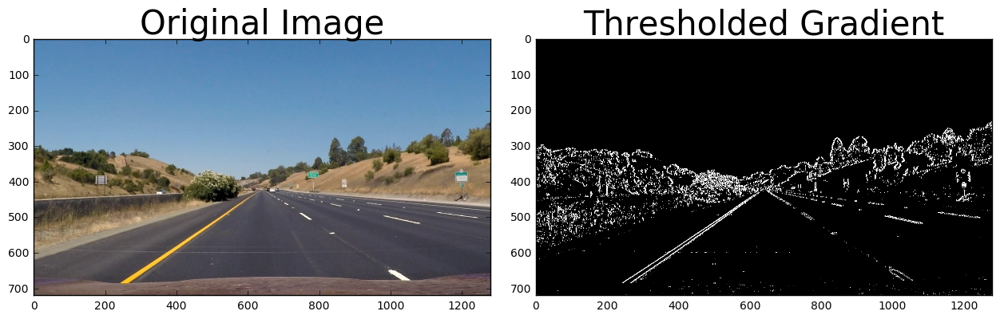

In [3]:
%matplotlib inline

def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    
    # Convert to HLS and use lightness as the gray
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    L = hls[:,:,1]
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient=='x':
        sobel = cv2.Sobel(L, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    else:
        sobel = cv2.Sobel(L, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    binary_output = sxbinary
    return binary_output

# Run the function
grad_binary = abs_sobel_thresh(image, orient='x', thresh=(20, 100))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(grad_binary, cmap='gray')
ax2.set_title('Thresholded Gradient', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

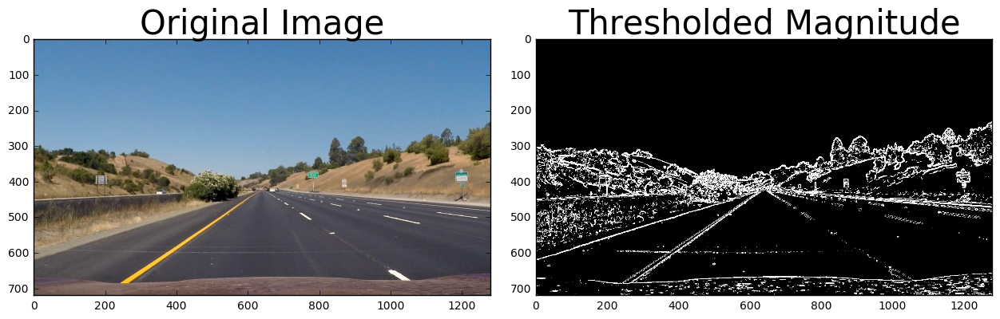

In [4]:
# Define a function that applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    
    # Convert to HLS and use lightness as the gray
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    L = hls[:,:,1]
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(L, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(L, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Calculate the magnitude 
    mag = np.sqrt(np.square(sobelx) + np.square(sobely))
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    
    scaled_mag = np.uint8(255*mag/np.max(mag))
    # 5) Create a binary mask where mag thresholds are met
    sxbinary = np.zeros_like(scaled_mag)
    sxbinary[(scaled_mag >= mag_thresh[0]) & (scaled_mag <= mag_thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    binary_output = sxbinary # Remove this line
    return binary_output
    
# Run the function
mag_binary = mag_thresh(image, sobel_kernel=3, mag_thresh=(20, 100))
# print(mag_binary)
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(mag_binary, cmap='gray')
ax2.set_title('Thresholded Magnitude', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

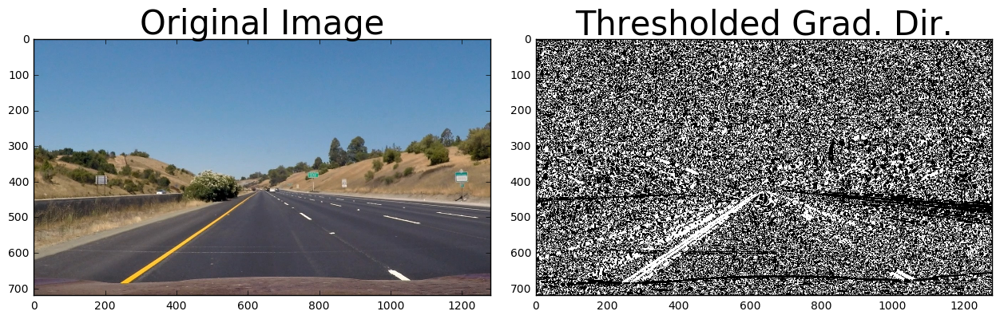

In [5]:
# Define a function that applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    
    # Convert to HLS and use lightness as the gray
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    L = hls[:,:,1]
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(L, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(L, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    G = np.arctan2(abs_sobely, abs_sobelx)
    # 5) Create a binary mask where direction thresholds are met
    mask = np.zeros_like(G)
    mask[(G > thresh[0]) & (G < thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    binary_output = mask
    return binary_output
    
# Run the function
dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.7, 1.3))
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dir_binary, cmap='gray')
ax2.set_title('Thresholded Grad. Dir.', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

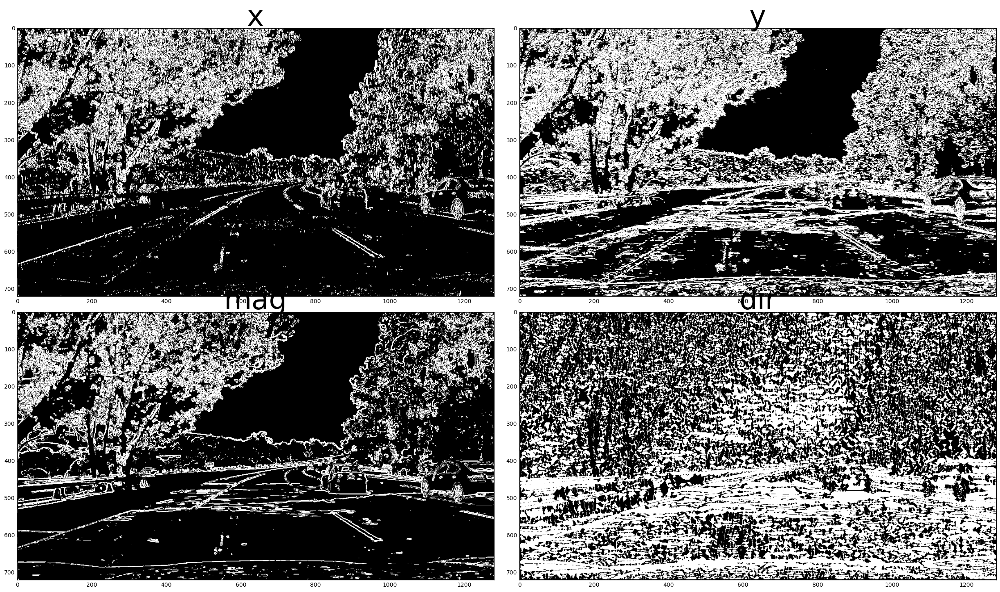

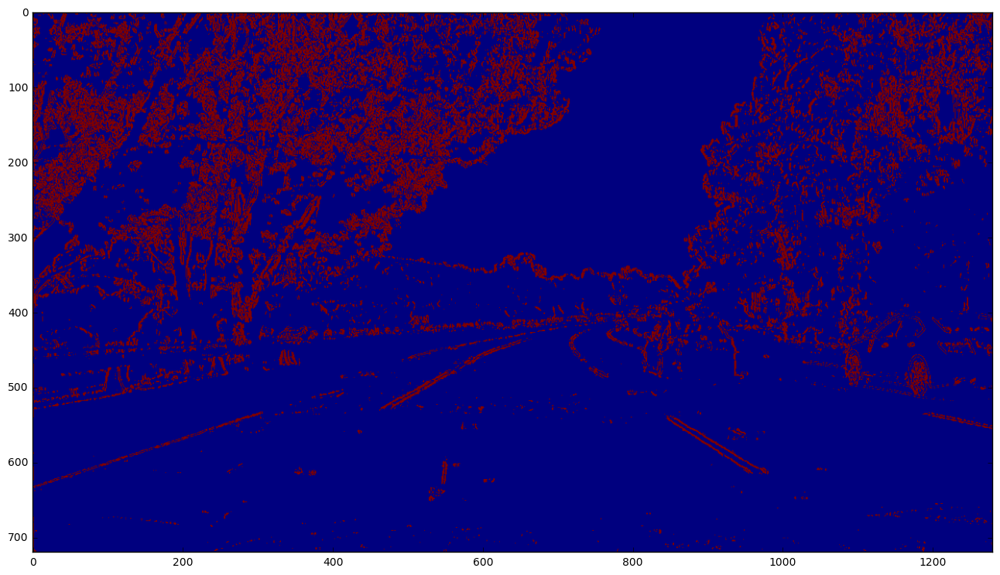

In [6]:
%matplotlib inline

image = images[6]

x_grad_binary = abs_sobel_thresh(image, orient='x', thresh=(10, 100))
y_grad_binary = abs_sobel_thresh(image, orient='y', thresh=(5, 150))
mag_binary = mag_thresh(image, sobel_kernel=3, mag_thresh=(20, 100))
dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(1, 1.6))

f, ax = plt.subplots(2, 2, figsize=(24, 15))
f.tight_layout()
ax[0][0].imshow(x_grad_binary, cmap='gray')
ax[0][0].set_title('x', fontsize=50)
ax[0][1].imshow(y_grad_binary, cmap='gray')
ax[0][1].set_title('y', fontsize=50)

ax[1][0].imshow(mag_binary, cmap='gray')
ax[1][0].set_title('mag', fontsize=50)
ax[1][1].imshow(dir_binary, cmap='gray')
ax[1][1].set_title('dir', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


binary = np.zeros_like(dir_binary)
binary[(x_grad_binary == 1) & (mag_binary == 1)] = 1

plt.figure(2)
f, ax1 = plt.subplots(1, 1, figsize=(24, 9))
ax1.imshow(binary)

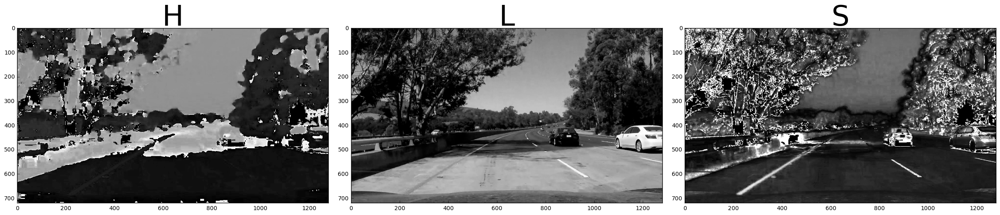

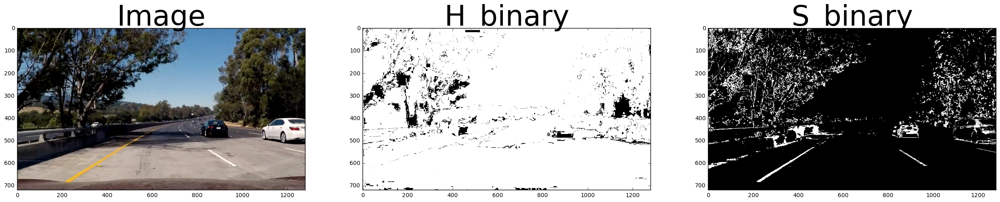

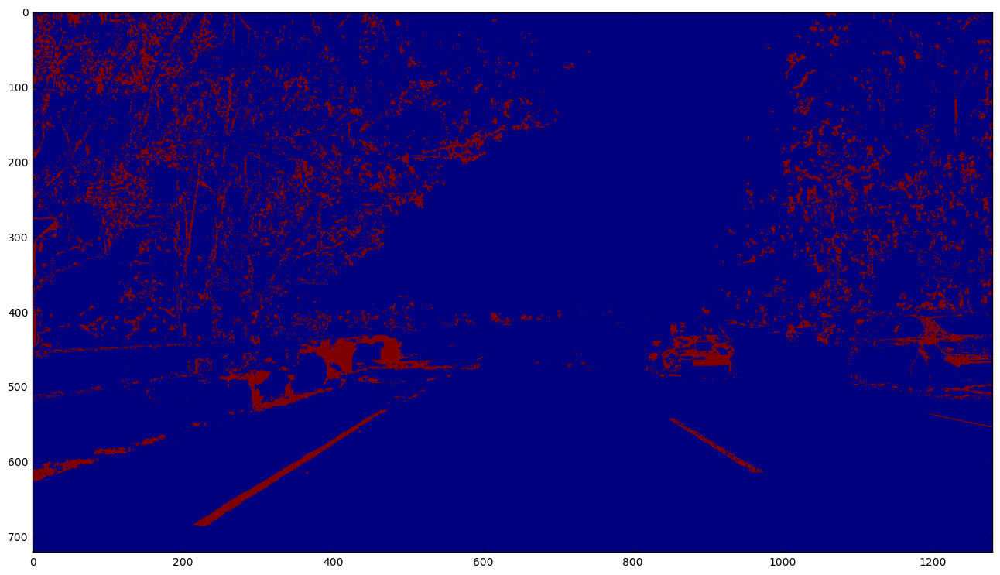

In [7]:
%matplotlib inline

image = images[6]
hls = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
H = hls[:,:,0]
L = hls[:,:,1]
S = hls[:,:,2]

f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
f.tight_layout()
ax1.imshow(H, cmap='gray')
ax1.set_title('H', fontsize=50)
ax2.imshow(L, cmap='gray')
ax2.set_title('L', fontsize=50)
ax3.imshow(S, cmap='gray')
ax3.set_title('S', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

plt.figure(1)

H_thresh = (0, 180)
H_binary = np.zeros_like(H)
H_binary[(H > H_thresh[0]) & (H <= H_thresh[1])] = 1

S_thresh = (170, 255)
S_binary = np.zeros_like(S)
S_binary[(S > S_thresh[0]) & (S <= S_thresh[1])] = 1

f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))

ax1.imshow(image, cmap='gray')
ax1.set_title('Image', fontsize=50)
ax2.imshow(H_binary, cmap='gray')
ax2.set_title('H_binary', fontsize=50)
ax3.imshow(S_binary, cmap='gray')
ax3.set_title('S_binary', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


binary = np.zeros_like(S)
binary[(S_binary == 1) & (H_binary == 1)] = 1
plt.figure(2)
f, ax1 = plt.subplots(1, 1, figsize=(24, 9))
ax1.imshow(binary)

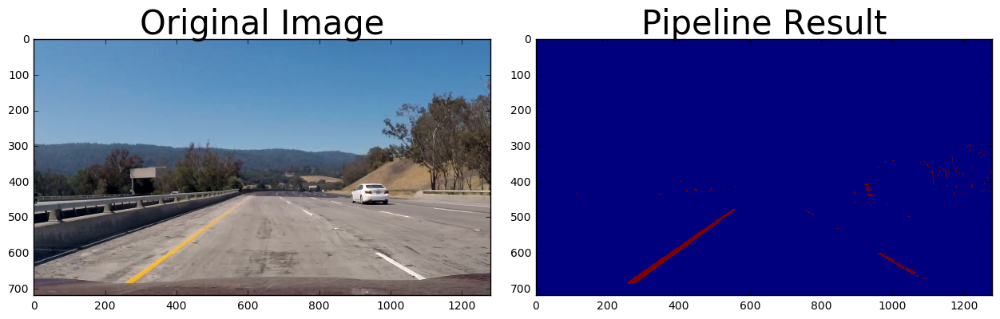

In [101]:
%matplotlib inline

image = images[6]
# image = plt.imread('./output_images/575_before.jpg')
def hsl_channel_threshold(img, s_thresh=(90, 255), h_thresh=(30, 140)):
    img = np.copy(img)

    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    h_channel = hls[:,:,0]
    s_channel = hls[:,:,2]
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel > s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    h_binary = np.zeros_like(h_channel)
    h_binary[(h_channel > h_thresh[0]) & (h_channel <= h_thresh[1])] = 1

    binary = np.zeros_like(h_channel)
#     binary[(s_binary == 1)] = 1
    binary[(s_binary == 1) & (h_binary == 1)] = 1
    return binary
    
result = hsl_channel_threshold(image, s_thresh=(100, 255), h_thresh=(10, 100))

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
f.tight_layout()

ax1.imshow(image)
ax1.set_title('Original Image', fontsize=30)

ax2.imshow(result)
ax2.set_title('Pipeline Result', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

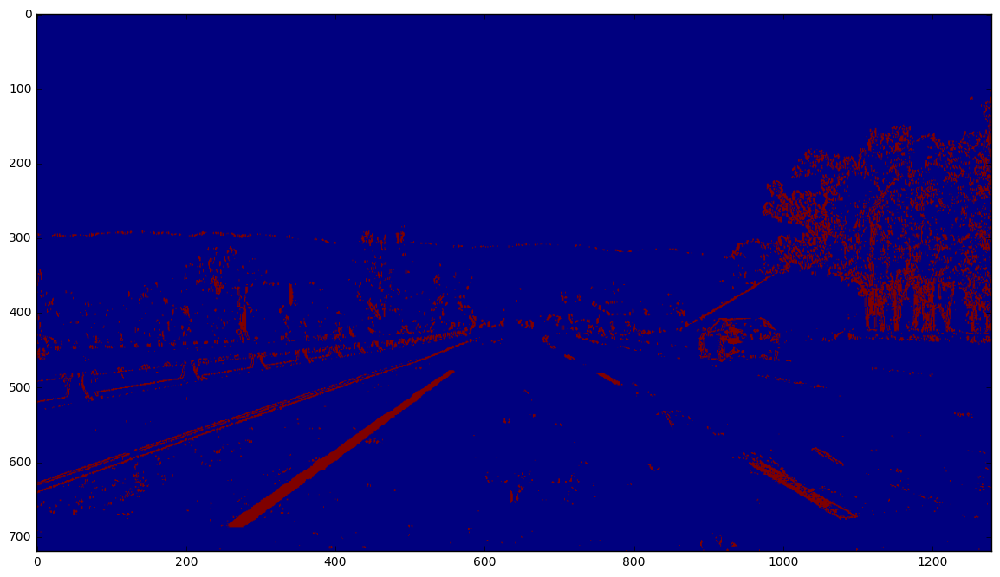

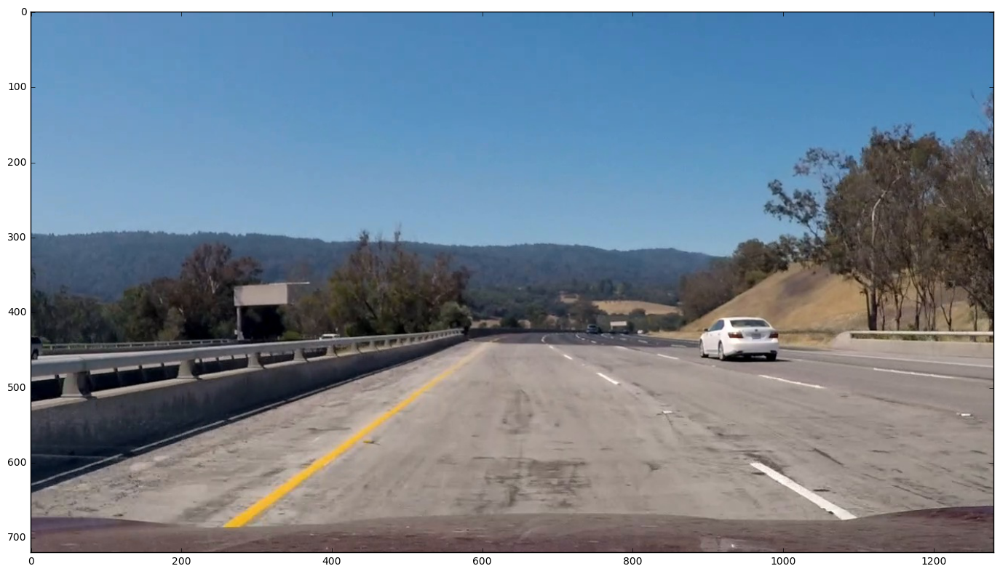

In [106]:
##### %matplotlib notebook
import matplotlib.pyplot as plt
from matplotlib.widgets import Button

# fig_size = plt.rcParams["figure.figsize"]
# print(fig_size)
# plt.rcParams['figure.figsize'] = (20.0, 10.0)

image = images[5]
# image = plt.imread('./output_images/575_before.jpg')
def filter_lanes(image):
    x_grad_binary = abs_sobel_thresh(image, orient='x', thresh=(20, 100))
    y_grad_binary = abs_sobel_thresh(image, orient='y', thresh=(10, 100))
    mag_binary = mag_thresh(image, sobel_kernel=3, mag_thresh=(20, 100))
    dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.7, 1.0))
    hsl_channel_binary = hsl_channel_threshold(image, s_thresh=(100, 255), h_thresh=(0, 100))

    combined = np.zeros_like(dir_binary)
#     combined[(x_grad_binary == 1)] = 1
#     combined[(y_grad_binary == 1)] = 1
#     combined[(y_grad_binary == 1) & (x_grad_binary == 1)] = 1
#     combined[(mag_binary == 1)] = 1
#     combined[(dir_binary == 1)] = 1
    combined[(hsl_channel_binary == 1) | (x_grad_binary == 1)] = 1
#     combined[(dir_binary == 1) & (hsl_channel_binary == 1)] = 1
    return combined

plt.figure(figsize=(16,8))
plt.imshow(filter_lanes(image))
plt.figure(figsize=(16,8))
plt.imshow(image)
plt.tight_layout()

Wall time: 151 ms


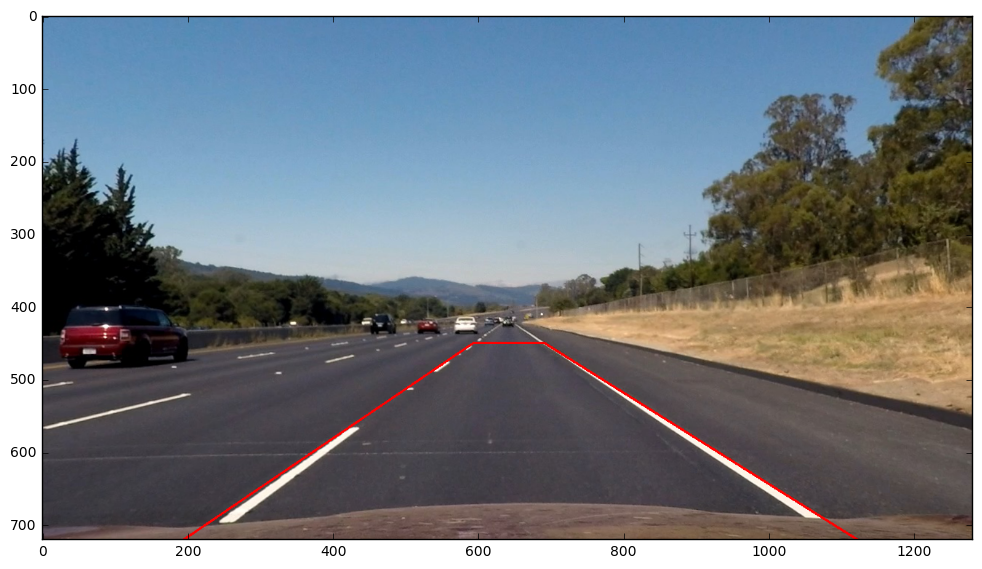

In [10]:
%%time
image = np.copy(images[1])
image = cv2.undistort(image, mtx, dist, None, mtx)    
# modified_image = filter_lanes(undistored)
color=[255, 0, 0]
warp_vertices_src = [(195, image.shape[0]), (593, 450), (690, 450), (1120, image.shape[0])]
cv2.line(image, warp_vertices_src[0], warp_vertices_src[1], color, 2)
cv2.line(image, warp_vertices_src[2], warp_vertices_src[3], color, 2)
cv2.line(image, warp_vertices_src[1], warp_vertices_src[2], color, 2)


f, ax = plt.subplots(1, 1, figsize=(12,12))
ax.imshow(image)

(720, 1280, 3)


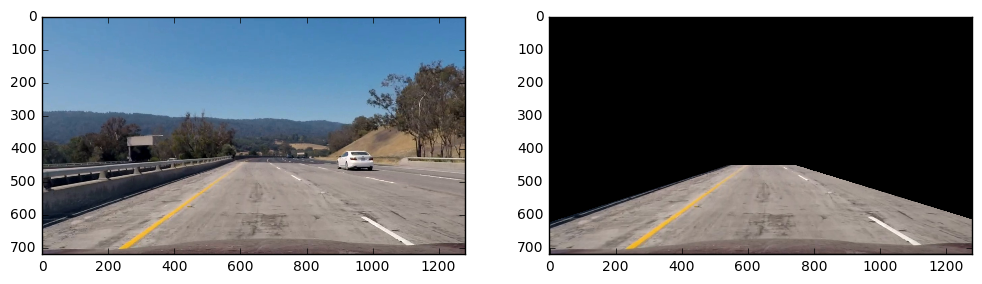

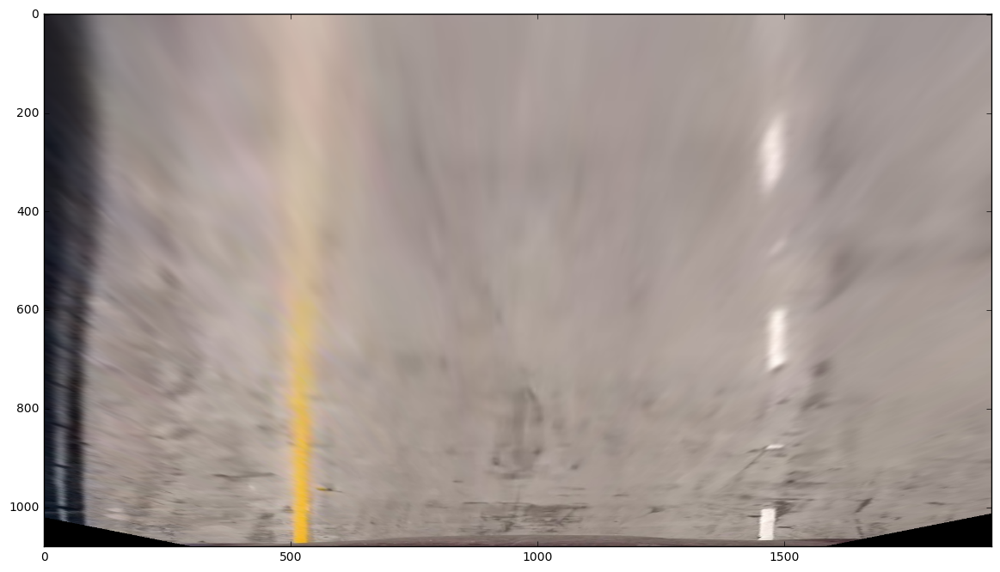

In [107]:

def warp_image(image, mode='normal'):
    image = np.copy(image)
#     warp_vertices_src = [(195, image.shape[0]), (593, 450), (690, 450), (1120, image.shape[0])]
#     src = np.float32(warp_vertices_src)
#     dst = np.float32([[195, 720], [195, 0], [1120, 0], [1120, 720]])
    warp_vertices_src = [(195, 720), (593, 450), (690, 450), (1120, 720)]
    src = np.float32(warp_vertices_src)
#     dst = np.float32([[195, 720], [195, 0], [1120, 0], [1120, 720]])
    dst = np.float32([[495, 1080], [495, 0], [1420, 0], [1420, 1080]])
#     color=[255, 0, 0]
#     cv2.line(image, warp_vertices_src[0], warp_vertices_src[1], color, 1)
#     cv2.line(image, warp_vertices_src[2], warp_vertices_src[3], color, 1)
#     cv2.line(image, warp_vertices_src[1], warp_vertices_src[2], color, 1)
    if mode=='normal':
        M = cv2.getPerspectiveTransform(src, dst)
        warped = cv2.warpPerspective(image, M, (1920, 1080), flags=cv2.INTER_LINEAR)
    elif mode=='inverse':
        M = cv2.getPerspectiveTransform(dst, src)
        warped = cv2.warpPerspective(image, M, (1280, 720), flags=cv2.INTER_LINEAR)
    return warped

# image = np.copy(images[1])
image = images[1]
image = plt.imread('./output_images/575_before.jpg')
image = cv2.undistort(image, mtx, dist, None, mtx)  
print(image.shape)
warped = warp_image(image)
warped_inverse = warp_image(warped, mode='inverse')
f, ax = plt.subplots(1, 2, figsize=(12,12))
ax[0].imshow(image)
ax[1].imshow(warped_inverse)
plt.figure(figsize=(16,8))
plt.imshow(warped)


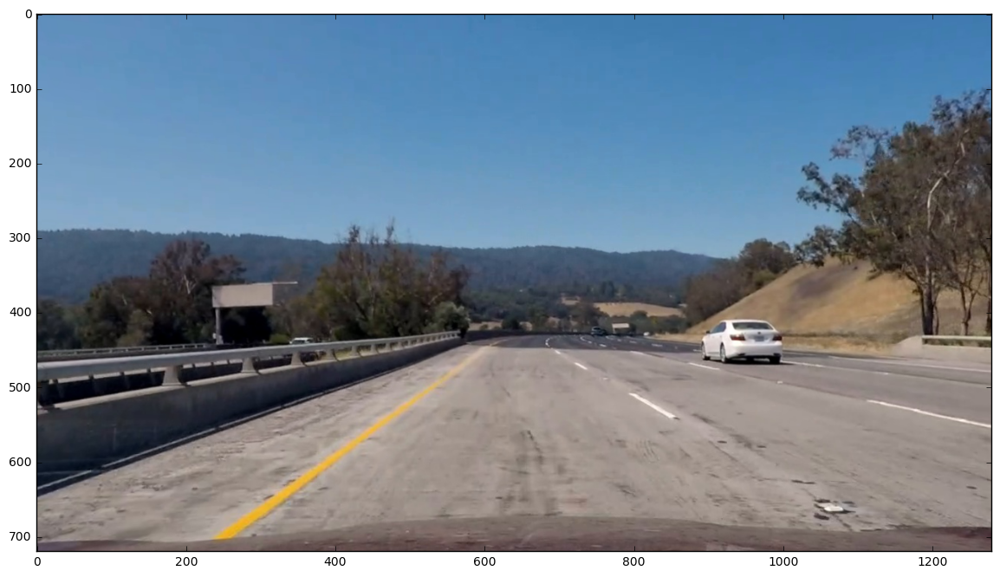

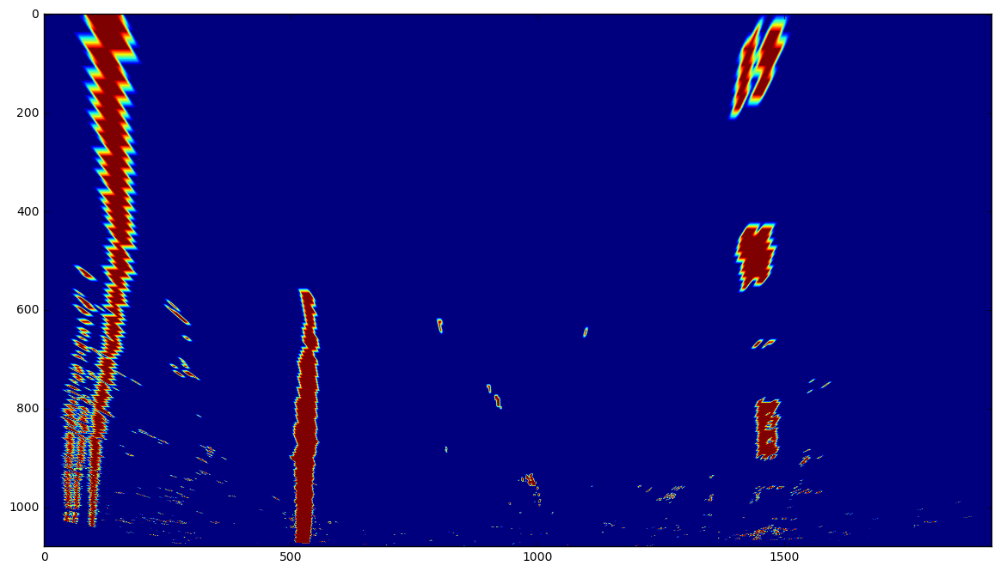

In [132]:
image = images[5]
image = plt.imread('./output_images/580_before.jpg')
image = cv2.undistort(image, mtx, dist, None, mtx)  
filtered = filter_lanes(image)
warped = warp_image(filtered)

plt.figure(figsize=(16,8))
plt.imshow(image)
plt.figure(figsize=(16,8))
plt.imshow(warped)

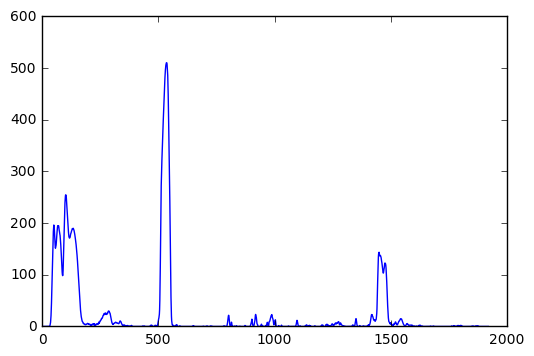

In [133]:
image = images[5]
image = plt.imread('./output_images/580_before.jpg')
image = cv2.undistort(image, mtx, dist, None, mtx)  
filtered = filter_lanes(image)
warped = warp_image(filtered)

histogram = np.sum(warped[warped.shape[0]/2:,:], axis=0)
plt.plot(histogram)

1464.0
1389 1589 101 1464.0
1465.0
1390 1590 98 1465.0
1463.0
1388 1588 101 1463.0
1464.0
1389 1589 199 1464.0
1563.0
1488 1688 0 1563.0
1563.0
1488 1688 0 1563.0
1563.0
1488 1688 0 1563.0
1563.0
1488 1688 0 1563.0
1563.0
1488 1688 0 1563.0
1563.0
1488 1688 0 1563.0
1563.0
1488 1688 0 1563.0
1563.0
1488 1688 0 1563.0
1563.0


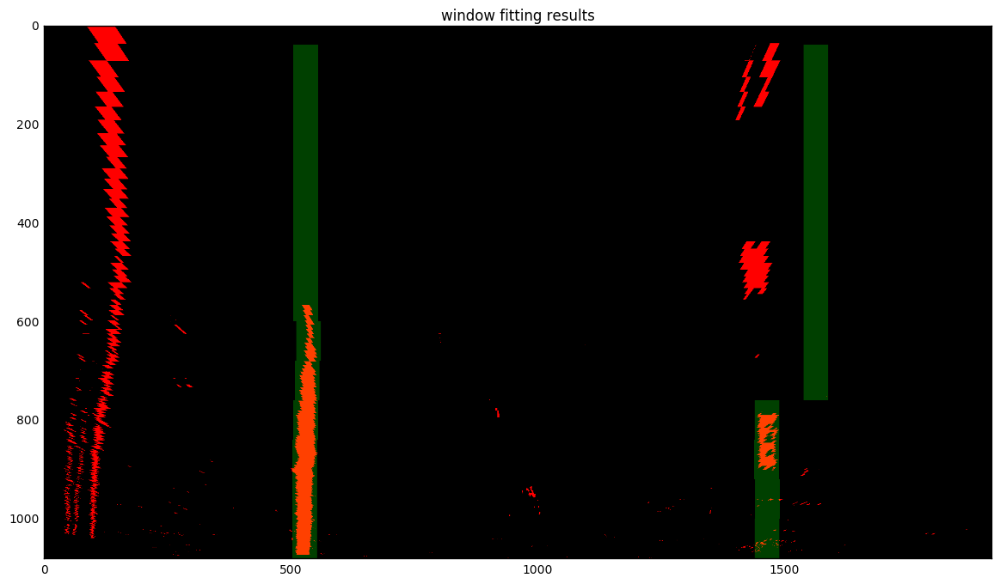

In [173]:



def find_lane_pixels(warped):
    # window settings
    window_width = 50 
    window_height = 80 # Break image into 9 vertical layers since image height is 720
    margin = 100 # How much to slide left and right for searching

    def window_mask(width, height, img_ref, center,level):
        output = np.zeros_like(img_ref)
        output[int(img_ref.shape[0]-(level+1)*height):int(img_ref.shape[0]-level*height),max(0,int(center-width/2)):min(int(center+width/2),img_ref.shape[1])] = 1
        return output

    def find_window_centroids(image, window_width, window_height, margin):

        window_centroids = [] # Store the (left,right) window centroid positions per level
        window = np.ones(window_width) # Create our window template that we will use for convolutions

        # First find the two starting positions for the left and right lane by using np.sum to get the vertical image slice
        # and then np.convolve the vertical image slice with the window template 

        # Sum quarter bottom of image to get slice, could use a different ratio
        l_sum = np.sum(warped[int(3*warped.shape[0]/4):,:int(warped.shape[1]/2)], axis=0)
        l_center = np.argmax(np.convolve(window,l_sum))-window_width/2
        r_sum = np.sum(warped[int(3*warped.shape[0]/4):,int(warped.shape[1]/2):], axis=0)
        r_center = np.argmax(np.convolve(window,r_sum))-window_width/2+int(warped.shape[1]/2)
        print(r_center)
        
        # Add what we found for the first layer
        window_centroids.append((l_center,r_center))

        # Go through each layer looking for max pixel locations
        for level in range(1,(int)(warped.shape[0]/window_height)):
            # convolve the window into the vertical slice of the image
            image_layer = np.sum(warped[int(warped.shape[0]-(level+1)*window_height):int(warped.shape[0]-level*window_height),:], axis=0)
            conv_signal = np.convolve(window, image_layer)
            # Find the best left centroid by using past left center as a reference
            # Use window_width/2 as offset because convolution signal reference is at right side of window, not center of window
            offset = window_width/2
            l_min_index = int(max(l_center+offset-margin,0))
            l_max_index = int(min(l_center+offset+margin,warped.shape[1]))
            l_signal_center = np.argmax(conv_signal[l_min_index:l_max_index]) 
            if l_signal_center > 0:
                l_center = l_signal_center+l_min_index-offset
            # Find the best right centroid by using past right center as a reference
            r_min_index = int(max(r_center+offset-margin,0))
            r_max_index = int(min(r_center+offset+margin,warped.shape[1]))
            r_signal_center = np.argmax(conv_signal[r_min_index:r_max_index])
            
            
            print(r_min_index, r_max_index, r_signal_center, r_center)
            if r_signal_center > 0:
                r_center = r_signal_center+r_min_index-offset
            print(r_center)
            # Add what we found for that layer
            window_centroids.append((l_center,r_center))

        return window_centroids

    window_centroids = find_window_centroids(warped, window_width, window_height, margin)

    # If we found any window centers
    if len(window_centroids) > 0:

        # Points used to draw all the left and right windows
        l_points = np.zeros_like(warped)
        r_points = np.zeros_like(warped)

        # Go through each level and draw the windows 
        for level in range(0,len(window_centroids)):
            # Window_mask is a function to draw window areas
            l_mask = window_mask(window_width,window_height,warped,window_centroids[level][0],level)
            r_mask = window_mask(window_width,window_height,warped,window_centroids[level][1],level)
            # Add graphic points from window mask here to total pixels found 
            l_points[(l_points == 255) | ((l_mask == 1) ) ] = 255
            r_points[(r_points == 255) | ((r_mask == 1) ) ] = 255

        # Draw the results
        template = np.array(r_points+l_points,np.uint8) # add both left and right window pixels together
        zero_channel = np.zeros_like(template) # create a zero color channle 
        template = np.array(cv2.merge((zero_channel,template,zero_channel)),np.uint8) # make window pixels green
        warpage = np.array(cv2.merge((warped,warped,warped)),np.uint8) # making the original road pixels 3 color channels
        output = cv2.addWeighted(warpage, 1, template, 0.5, 0.0) # overlay the orignal road image with window results

    # If no window centers found, just display orginal road image
    else:
        output = np.array(cv2.merge((warped,warped,warped)),np.uint8)
        
    return l_points, r_points, output

image = images[5]
image = plt.imread('./output_images/580_before.jpg')
image = cv2.undistort(image, mtx, dist, None, mtx)    
filtered = filter_lanes(image)
warped = warp_image(filtered)
l_points, r_points, output = find_lane_pixels(warped)

# Display the final results
plt.figure(figsize=(16,8))
warped[warped==1] = 255
warped = np.array(warped, np.uint8)
warped = np.array(cv2.merge((warped,np.zeros_like(warped),np.zeros_like(warped)))) # making the original road pixels 3 color channels
output = cv2.addWeighted(warped, 1, output, 0.5, 0)
plt.imshow(output)
plt.title('window fitting results')



In [15]:
np.convolve([1, 2, 3, 4], [0, 1], mode='full')

array([0, 1, 2, 3, 4])

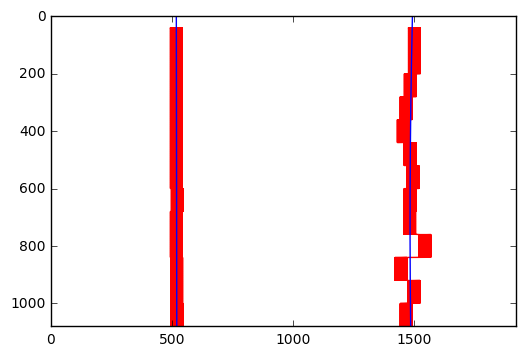

In [111]:

def get_line_fit(points):
    y, x = np.nonzero(points)
    image_height = points.shape[0]
    y_axis = np.linspace(0, image_height-1, num=image_height)
    fit = np.polyfit(y, x, 2)
    line_fitx = fit[0]*y_axis**2 + fit[1]*y_axis + fit[2]
    return line_fitx

y, x = np.nonzero(l_points)
left_fitx = get_line_fit(l_points)

image_height = l_points.shape[0]
y_axis = np.linspace(0, image_height-1, num=image_height)
# print(left_fit)
plt.plot(x, y, color='red')
plt.plot(left_fitx, y_axis, color='blue')
plt.xlim(0, l_points.shape[1])
plt.ylim(0, image_height)

y, x = np.nonzero(r_points)
right_fitx = get_line_fit(r_points)

plt.plot(x, y, color='red')
plt.plot(right_fitx, y_axis, color='blue')
plt.gca().invert_yaxis() # to visualize as we do the images

# y_eval = 720
# left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
# right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
# print(left_curverad, right_curverad)


In [17]:
# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

image_height = l_points.shape[0]

y_left, x_left = np.nonzero(l_points)
y_right, x_right = np.nonzero(r_points)


# Fit new polynomials to x,y in world space
left_fit_cr = np.polyfit(y_left*ym_per_pix, x_left*xm_per_pix, 2)
right_fit_cr = np.polyfit(y_right*ym_per_pix, x_right*xm_per_pix, 2)
# Calculate the new radii of curvature
left_curverad = ((1 + (2*left_fit_cr[0]*image_height*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
right_curverad = ((1 + (2*right_fit_cr[0]*image_height*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
# Now our radius of curvature is in meters
print(left_curverad, 'm', right_curverad, 'm')
# Example values: 632.1 m    626.2 m

16807.8047171 m 1102.76454564 m


In [18]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None

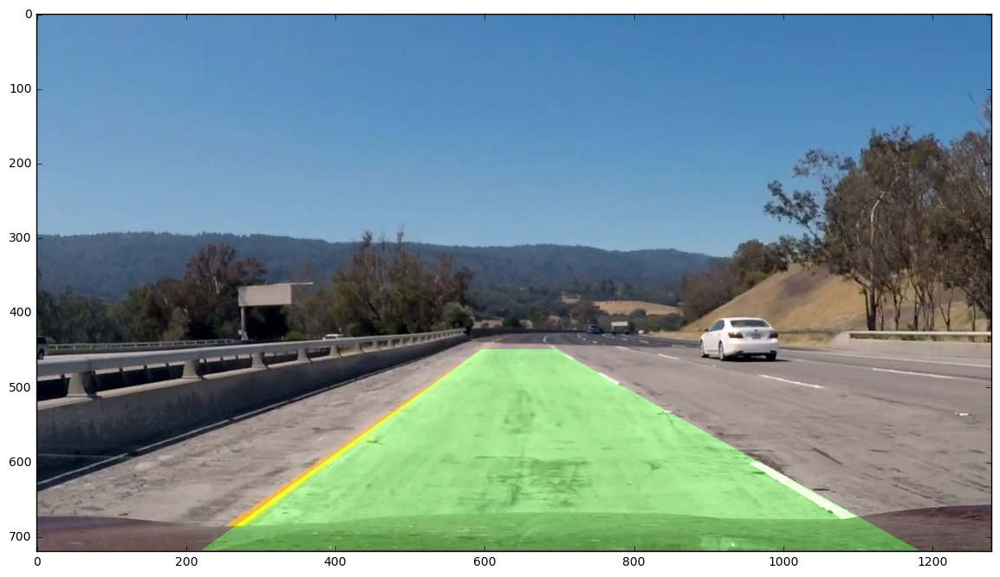

In [112]:
def overlay_lanes(original, warped, left_fitx, right_fitx):
    image_height = warped.shape[0]
    y_axis = np.linspace(0, image_height-1, num=image_height)

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, y_axis]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, y_axis])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    # newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    newwarp = warp_image(color_warp, mode='inverse')
    # Combine the result with the original image
    result = cv2.addWeighted(original, 1, newwarp, 0.3, 0)
    return result

image = images[5]
image = plt.imread('./output_images/575_before.jpg')
filtered = filter_lanes(image)
warped = warp_image(filtered)
result = overlay_lanes(image, warped, left_fitx, right_fitx)
plt.figure(figsize=(16,8))
plt.imshow(result)

In [128]:
def IdGenerator(path):
    count = 0
    while True:
        before = path + str(count) + '_before.jpg'
        after = path + str(count) + '_after.jpg'
        yield before, after
        count += 1
        
id_gen = IdGenerator('./output_images/')

12180.0339887 m 734.426165473 m


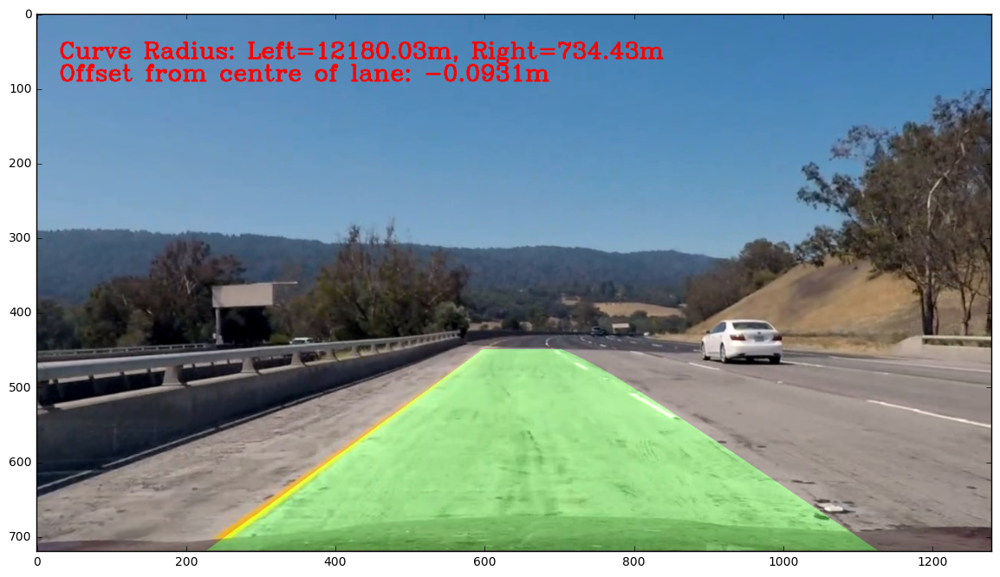

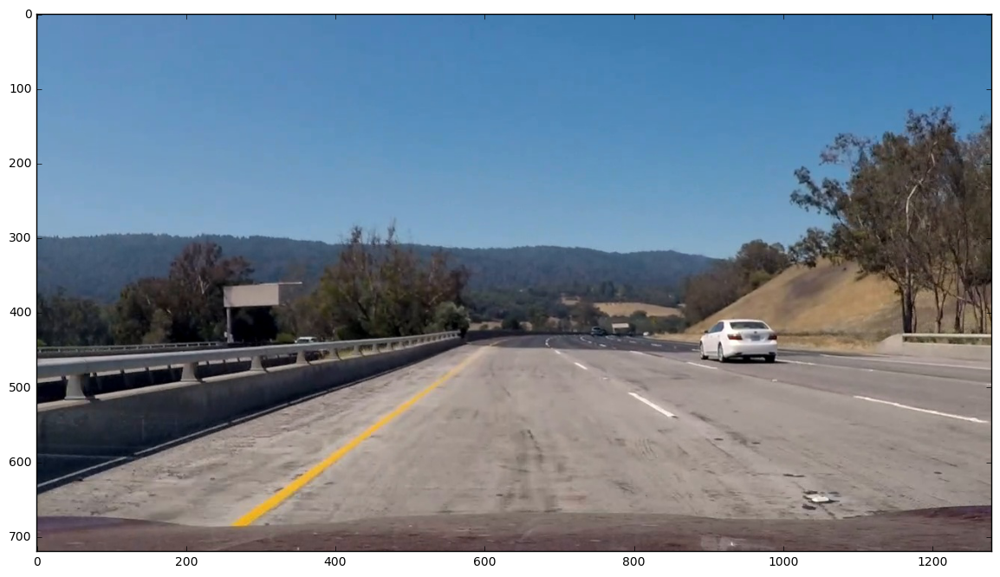

In [130]:
import pickle
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline

# Read in the saved camera matrix and distortion coefficients
# These are the arrays you calculated using cv2.calibrateCamera()
dist_pickle = pickle.load(open( "./camera_cal/dist_pickle.p", "rb"))
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]

def pipeline(image, debug=True):
    if debug == True:
        before, after = next(id_gen)
        cv2.imwrite(before, cv2.cvtColor(image, cv2.COLOR_RGB2BGR))
    
    # Use the OpenCV undistort() function to remove distortion
    undistored = cv2.undistort(image, mtx, dist, None, mtx)    
    filtered_image = filter_lanes(undistored)
    warped_image = warp_image(filtered_image)
    modified_image = warped_image
    l_points, r_points, lane_drawing = find_lane_pixels(modified_image)
    
    left_fitx = get_line_fit(l_points)
    right_fitx = get_line_fit(r_points)
    
    modified_image = overlay_lanes(undistored, modified_image, left_fitx, right_fitx)
    #debug
    if debug == True:
        filtered_image[filtered_image > 0] = 255
        filtered_image = np.array(cv2.merge((filtered_image,np.zeros_like(filtered_image),np.zeros_like(filtered_image))),np.uint8)
        combined = cv2.addWeighted(modified_image, 1, filtered_image, 0.9, 0.0)
        modified_image = combined
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    image_height = l_points.shape[0]

    y_left, x_left = np.nonzero(l_points)
    y_right, x_right = np.nonzero(r_points)


    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(y_left*ym_per_pix, x_left*xm_per_pix, 2)
    right_fit_cr = np.polyfit(y_right*ym_per_pix, x_right*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*image_height*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*image_height*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    print(left_curverad, 'm', right_curverad, 'm')
    # Example values: 632.1 m    626.2 m
    
    text = "Curve Radius: Left=" + str(np.round(left_curverad, 2)) + "m, Right=" + str(np.round(right_curverad, 2)) + "m"
    font = cv2.FONT_HERSHEY_COMPLEX    
    cv2.putText(modified_image, text, (30, 60), font, 1, (255,0,0), 2)
    center_offset = (warped_image.shape[1]/2 - (left_fitx[-1] + right_fitx[-1])/2)*xm_per_pix
    center_offset_text = "Offset from centre of lane: {:2.4f}m".format(center_offset)
    cv2.putText(modified_image, center_offset_text, (30, 90), font, 1, (255,0,0), 2)
    
    if debug == True:
        cv2.imwrite(after, cv2.cvtColor(modified_image, cv2.COLOR_RGB2BGR))
    return modified_image



image = images[6]
image = plt.imread('./output_images/580_before.jpg')
result = pipeline(image, debug=False)
plt.figure(figsize=(16,8))
plt.imshow(result)
plt.figure(figsize=(16,8))
plt.imshow(image)


In [56]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [129]:
video_output = "output_images/project_video.mp4"
clip1 = VideoFileClip("project_video.mp4")
clip1_output = clip1.fl_image(pipeline) #NOTE: this function expects color images!!
%time clip1_output.write_videofile(video_output, audio=False)

642.783710393 m 824.102142797 m
[MoviePy] >>>> Building video output_images/project_video.mp4
[MoviePy] Writing video output_images/project_video.mp4


  0%|                                                                                                                                 | 0/1261 [00:00<?, ?it/s]

642.783710393 m 824.102142797 m


  0%|                                                                                                                         | 1/1261 [00:01<23:23,  1.11s/it]

601.429383284 m 1167.8358393 m


  0%|▏                                                                                                                        | 2/1261 [00:02<23:26,  1.12s/it]

613.158433025 m 674.807186843 m


  0%|▎                                                                                                                        | 3/1261 [00:03<23:36,  1.13s/it]

628.431271055 m 1146.41978344 m


  0%|▍                                                                                                                        | 4/1261 [00:04<23:17,  1.11s/it]

622.475049578 m 1133.35195035 m


  0%|▍                                                                                                                        | 5/1261 [00:05<23:09,  1.11s/it]

634.304868563 m 740.883383433 m


  0%|▌                                                                                                                        | 6/1261 [00:06<23:36,  1.13s/it]

664.633713055 m 1301.98656648 m


  1%|▋                                                                                                                        | 7/1261 [00:07<23:58,  1.15s/it]

677.510786794 m 664.094096513 m


  1%|▊                                                                                                                        | 8/1261 [00:08<23:13,  1.11s/it]

716.710910649 m 4657.71408721 m


  1%|▊                                                                                                                        | 9/1261 [00:10<22:50,  1.09s/it]

730.9764504 m 477.770911344 m


  1%|▉                                                                                                                       | 10/1261 [00:11<22:13,  1.07s/it]

741.733206741 m 771.102424535 m


  1%|█                                                                                                                       | 11/1261 [00:12<22:11,  1.07s/it]

780.749714964 m 1055.28205579 m


  1%|█▏                                                                                                                      | 12/1261 [00:13<21:54,  1.05s/it]

801.845842019 m 758.41572061 m


  1%|█▏                                                                                                                      | 13/1261 [00:14<22:32,  1.08s/it]

795.370726823 m 1407.01633482 m


  1%|█▎                                                                                                                      | 14/1261 [00:15<22:06,  1.06s/it]

744.800387589 m 701.776223398 m


  1%|█▍                                                                                                                      | 15/1261 [00:16<22:18,  1.07s/it]

727.062476887 m 834.601621401 m


  1%|█▌                                                                                                                      | 16/1261 [00:17<22:17,  1.07s/it]

722.938398012 m 589.759458055 m


  1%|█▌                                                                                                                      | 17/1261 [00:18<22:29,  1.09s/it]

714.833211683 m 775.25524627 m


  1%|█▋                                                                                                                      | 18/1261 [00:19<22:07,  1.07s/it]

755.979027205 m 605.014398996 m


  2%|█▊                                                                                                                      | 19/1261 [00:20<22:18,  1.08s/it]

735.704411394 m 2349.61201704 m


  2%|█▉                                                                                                                      | 20/1261 [00:21<21:56,  1.06s/it]

789.294101586 m 624.117351387 m


  2%|█▉                                                                                                                      | 21/1261 [00:22<22:06,  1.07s/it]

860.426450022 m 1829.02854904 m


  2%|██                                                                                                                      | 22/1261 [00:23<21:49,  1.06s/it]

848.294329869 m 1575.043894 m


  2%|██▏                                                                                                                     | 23/1261 [00:24<22:08,  1.07s/it]

779.060959522 m 616.451871983 m


  2%|██▎                                                                                                                     | 24/1261 [00:25<21:45,  1.06s/it]

739.4525223 m 757.315146489 m


  2%|██▍                                                                                                                     | 25/1261 [00:27<22:01,  1.07s/it]

745.555829705 m 591.713165367 m


  2%|██▍                                                                                                                     | 26/1261 [00:28<22:04,  1.07s/it]

686.957213862 m 966.876165963 m


  2%|██▌                                                                                                                     | 27/1261 [00:29<22:59,  1.12s/it]

688.7026455 m 884.997225079 m


  2%|██▋                                                                                                                     | 28/1261 [00:30<23:22,  1.14s/it]

638.411632613 m 1151.1631323 m


  2%|██▊                                                                                                                     | 29/1261 [00:31<23:30,  1.14s/it]

621.219214252 m 780.540607295 m


  2%|██▊                                                                                                                     | 30/1261 [00:32<23:53,  1.16s/it]

599.082033136 m 715.43125135 m


  2%|██▉                                                                                                                     | 31/1261 [00:34<24:44,  1.21s/it]

561.549719102 m 521.916292888 m


  3%|███                                                                                                                     | 32/1261 [00:35<24:26,  1.19s/it]

548.486265044 m 564.915862561 m


  3%|███▏                                                                                                                    | 33/1261 [00:37<28:16,  1.38s/it]

512.105355388 m 1496.45289258 m


  3%|███▏                                                                                                                    | 34/1261 [00:38<30:46,  1.50s/it]

513.798709489 m 470.808512224 m


  3%|███▎                                                                                                                    | 35/1261 [00:40<29:47,  1.46s/it]

523.087579261 m 591.253931209 m


  3%|███▍                                                                                                                    | 36/1261 [00:41<27:55,  1.37s/it]

509.567143011 m 637.546066672 m


  3%|███▌                                                                                                                    | 37/1261 [00:42<26:30,  1.30s/it]

494.2423421 m 708.232390784 m


  3%|███▌                                                                                                                    | 38/1261 [00:43<26:30,  1.30s/it]

497.293243885 m 554.440357369 m


  3%|███▋                                                                                                                    | 39/1261 [00:45<26:41,  1.31s/it]

514.750343728 m 575.144988782 m


  3%|███▊                                                                                                                    | 40/1261 [00:47<33:26,  1.64s/it]

519.806041657 m 687.253487594 m


  3%|███▉                                                                                                                    | 41/1261 [00:49<33:39,  1.66s/it]

535.986295909 m 459.853803004 m


  3%|███▉                                                                                                                    | 42/1261 [00:51<33:39,  1.66s/it]

567.103009439 m 461.886869315 m


  3%|████                                                                                                                    | 43/1261 [00:53<38:25,  1.89s/it]

573.250635178 m 514.024394123 m


  3%|████▏                                                                                                                   | 44/1261 [00:54<35:16,  1.74s/it]

599.901720137 m 475.657008505 m


  4%|████▎                                                                                                                   | 45/1261 [00:56<33:08,  1.64s/it]

624.624421713 m 566.12431352 m


  4%|████▍                                                                                                                   | 46/1261 [00:57<29:54,  1.48s/it]

615.229799339 m 561.240786834 m


  4%|████▍                                                                                                                   | 47/1261 [00:58<28:29,  1.41s/it]

681.810023686 m 481.786782725 m


  4%|████▌                                                                                                                   | 48/1261 [00:59<26:39,  1.32s/it]

697.172091265 m 561.817665946 m


  4%|████▋                                                                                                                   | 49/1261 [01:00<25:55,  1.28s/it]

731.293077133 m 590.160264331 m


  4%|████▊                                                                                                                   | 50/1261 [01:02<24:50,  1.23s/it]

750.027716304 m 548.882393781 m


  4%|████▊                                                                                                                   | 51/1261 [01:03<27:12,  1.35s/it]

745.121080152 m 516.099523076 m


  4%|████▉                                                                                                                   | 52/1261 [01:04<26:09,  1.30s/it]

743.324247898 m 608.790964241 m


  4%|█████                                                                                                                   | 53/1261 [01:06<26:59,  1.34s/it]

776.618597237 m 745.212753726 m


  4%|█████▏                                                                                                                  | 54/1261 [01:07<25:21,  1.26s/it]

786.769241099 m 1014.25757877 m


  4%|█████▏                                                                                                                  | 55/1261 [01:08<25:16,  1.26s/it]

797.179502886 m 515.633679305 m


  4%|█████▎                                                                                                                  | 56/1261 [01:09<24:13,  1.21s/it]

792.506482965 m 577.557119036 m


  5%|█████▍                                                                                                                  | 57/1261 [01:10<24:01,  1.20s/it]

813.93396863 m 718.191683513 m


  5%|█████▌                                                                                                                  | 58/1261 [01:11<23:19,  1.16s/it]

764.526272418 m 522.711305451 m


  5%|█████▌                                                                                                                  | 59/1261 [01:13<23:53,  1.19s/it]

725.363010684 m 736.868987669 m


  5%|█████▋                                                                                                                  | 60/1261 [01:14<23:10,  1.16s/it]

744.03261143 m 435.086133663 m


  5%|█████▊                                                                                                                  | 61/1261 [01:15<23:20,  1.17s/it]

751.504268483 m 550.62065501 m


  5%|█████▉                                                                                                                  | 62/1261 [01:16<22:34,  1.13s/it]

764.488126726 m 854.583302181 m


  5%|█████▉                                                                                                                  | 63/1261 [01:17<23:12,  1.16s/it]

770.73279801 m 431.11784531 m


  5%|██████                                                                                                                  | 64/1261 [01:18<22:49,  1.14s/it]

757.266750031 m 522.371676706 m


  5%|██████▏                                                                                                                 | 65/1261 [01:20<23:23,  1.17s/it]

745.030937265 m 819.408495022 m


  5%|██████▎                                                                                                                 | 66/1261 [01:21<23:04,  1.16s/it]

774.025063562 m 766.811822874 m


  5%|██████▍                                                                                                                 | 67/1261 [01:22<23:19,  1.17s/it]

789.52992013 m 658.803433102 m


  5%|██████▍                                                                                                                 | 68/1261 [01:23<23:16,  1.17s/it]

765.010376056 m 602.3982743 m


  5%|██████▌                                                                                                                 | 69/1261 [01:24<23:25,  1.18s/it]

828.457837496 m 863.321888308 m


  6%|██████▋                                                                                                                 | 70/1261 [01:25<22:36,  1.14s/it]

808.977453843 m 874.358691201 m


  6%|██████▊                                                                                                                 | 71/1261 [01:27<23:04,  1.16s/it]

891.128963479 m 614.030313815 m


  6%|██████▊                                                                                                                 | 72/1261 [01:28<22:38,  1.14s/it]

950.533502087 m 699.745683821 m


  6%|██████▉                                                                                                                 | 73/1261 [01:29<23:06,  1.17s/it]

977.98104595 m 581.717418811 m


  6%|███████                                                                                                                 | 74/1261 [01:30<22:44,  1.15s/it]

1019.39203418 m 684.178848061 m


  6%|███████▏                                                                                                                | 75/1261 [01:31<23:14,  1.18s/it]

1030.53290146 m 633.611452805 m


  6%|███████▏                                                                                                                | 76/1261 [01:32<23:08,  1.17s/it]

1088.51149663 m 578.608378501 m


  6%|███████▎                                                                                                                | 77/1261 [01:34<25:17,  1.28s/it]

1117.69355872 m 655.230992439 m


  6%|███████▍                                                                                                                | 78/1261 [01:35<25:52,  1.31s/it]

1144.84067908 m 622.472297683 m


  6%|███████▌                                                                                                                | 79/1261 [01:37<26:41,  1.35s/it]

1054.06897831 m 971.593911198 m


  6%|███████▌                                                                                                                | 80/1261 [01:38<26:10,  1.33s/it]

1011.73369643 m 563.276055939 m


  6%|███████▋                                                                                                                | 81/1261 [01:39<26:38,  1.35s/it]

996.375106138 m 541.46979896 m


  7%|███████▊                                                                                                                | 82/1261 [01:41<25:40,  1.31s/it]

956.78959428 m 566.661201399 m


  7%|███████▉                                                                                                                | 83/1261 [01:42<25:32,  1.30s/it]

955.949100781 m 532.325766606 m


  7%|███████▉                                                                                                                | 84/1261 [01:43<26:36,  1.36s/it]

899.234170731 m 618.029153636 m


  7%|████████                                                                                                                | 85/1261 [01:45<27:14,  1.39s/it]

859.30951913 m 458.461374056 m


  7%|████████▏                                                                                                               | 86/1261 [01:46<26:18,  1.34s/it]

791.258300021 m 694.454478013 m


  7%|████████▎                                                                                                               | 87/1261 [01:47<25:49,  1.32s/it]

714.371007504 m 737.979346132 m


  7%|████████▎                                                                                                               | 88/1261 [01:49<25:16,  1.29s/it]

664.891596544 m 725.495409069 m


  7%|████████▍                                                                                                               | 89/1261 [01:50<25:25,  1.30s/it]

621.834782211 m 492.073889377 m


  7%|████████▌                                                                                                               | 90/1261 [01:51<24:35,  1.26s/it]

622.725105387 m 973.591751625 m


  7%|████████▋                                                                                                               | 91/1261 [01:52<24:28,  1.26s/it]

651.513145167 m 591.617688077 m


  7%|████████▊                                                                                                               | 92/1261 [01:53<23:45,  1.22s/it]

620.581816755 m 1100.0131432 m


  7%|████████▊                                                                                                               | 93/1261 [01:55<23:58,  1.23s/it]

612.521506749 m 818.432062744 m


  7%|████████▉                                                                                                               | 94/1261 [01:56<22:53,  1.18s/it]

638.839432749 m 947.169734514 m


  8%|█████████                                                                                                               | 95/1261 [01:57<23:17,  1.20s/it]

637.898781851 m 493.858591851 m


  8%|█████████▏                                                                                                              | 96/1261 [01:58<22:32,  1.16s/it]

660.620457616 m 568.59131797 m


  8%|█████████▏                                                                                                              | 97/1261 [01:59<23:17,  1.20s/it]

688.943743204 m 494.214172344 m


  8%|█████████▎                                                                                                              | 98/1261 [02:01<23:33,  1.22s/it]

700.739520645 m 599.402752141 m


  8%|█████████▍                                                                                                              | 99/1261 [02:02<25:10,  1.30s/it]

699.833633556 m 668.946109126 m


  8%|█████████▍                                                                                                             | 100/1261 [02:03<24:27,  1.26s/it]

638.441521334 m 478.504750625 m


  8%|█████████▌                                                                                                             | 101/1261 [02:05<24:07,  1.25s/it]

622.147217945 m 599.248943329 m


  8%|█████████▋                                                                                                             | 102/1261 [02:07<30:14,  1.57s/it]

638.258463941 m 598.245113371 m


  8%|█████████▋                                                                                                             | 103/1261 [02:08<28:39,  1.49s/it]

649.145465467 m 715.631902718 m


  8%|█████████▊                                                                                                             | 104/1261 [02:09<27:15,  1.41s/it]

658.002020432 m 635.800753108 m


  8%|█████████▉                                                                                                             | 105/1261 [02:11<26:08,  1.36s/it]

628.087643319 m 568.597657609 m


  8%|██████████                                                                                                             | 106/1261 [02:12<26:43,  1.39s/it]

664.856988562 m 659.580306697 m


  8%|██████████                                                                                                             | 107/1261 [02:13<25:27,  1.32s/it]

623.571814579 m 556.484696794 m


  9%|██████████▏                                                                                                            | 108/1261 [02:14<24:47,  1.29s/it]

620.006812254 m 685.031436949 m


  9%|██████████▎                                                                                                            | 109/1261 [02:16<23:20,  1.22s/it]

614.21143575 m 394.829326799 m


  9%|██████████▍                                                                                                            | 110/1261 [02:17<23:31,  1.23s/it]

603.955102064 m 554.64229889 m


  9%|██████████▍                                                                                                            | 111/1261 [02:18<22:28,  1.17s/it]

644.69690037 m 785.844209797 m


  9%|██████████▌                                                                                                            | 112/1261 [02:19<22:50,  1.19s/it]

617.180441978 m 621.21473675 m


  9%|██████████▋                                                                                                            | 113/1261 [02:20<22:15,  1.16s/it]

620.180181757 m 781.926745206 m


  9%|██████████▊                                                                                                            | 114/1261 [02:21<22:50,  1.19s/it]

599.937474702 m 554.916302933 m


  9%|██████████▊                                                                                                            | 115/1261 [02:23<22:48,  1.19s/it]

583.951840339 m 568.741403636 m


  9%|██████████▉                                                                                                            | 116/1261 [02:24<23:48,  1.25s/it]

565.677569511 m 657.247081025 m


  9%|███████████                                                                                                            | 117/1261 [02:25<23:45,  1.25s/it]

568.785087076 m 457.973348647 m


  9%|███████████▏                                                                                                           | 118/1261 [02:27<24:01,  1.26s/it]

577.258941022 m 471.421555649 m


  9%|███████████▏                                                                                                           | 119/1261 [02:28<23:08,  1.22s/it]

556.666009196 m 367.145176833 m


 10%|███████████▎                                                                                                           | 120/1261 [02:29<22:57,  1.21s/it]

561.127278642 m 562.280664095 m


 10%|███████████▍                                                                                                           | 121/1261 [02:30<22:02,  1.16s/it]

562.867500795 m 546.136350461 m


 10%|███████████▌                                                                                                           | 122/1261 [02:31<22:23,  1.18s/it]

556.796557626 m 555.392823238 m


 10%|███████████▌                                                                                                           | 123/1261 [02:32<22:26,  1.18s/it]

559.812054224 m 355.720741591 m


 10%|███████████▋                                                                                                           | 124/1261 [02:34<23:42,  1.25s/it]

560.822844069 m 471.518167981 m


 10%|███████████▊                                                                                                           | 125/1261 [02:35<22:53,  1.21s/it]

598.914057612 m 445.828018599 m


 10%|███████████▉                                                                                                           | 126/1261 [02:36<23:33,  1.25s/it]

584.074343623 m 599.844664615 m


 10%|███████████▉                                                                                                           | 127/1261 [02:37<23:37,  1.25s/it]

593.016036518 m 627.589860422 m


 10%|████████████                                                                                                           | 128/1261 [02:39<23:43,  1.26s/it]

593.338583541 m 492.870721769 m


 10%|████████████▏                                                                                                          | 129/1261 [02:40<23:07,  1.23s/it]

615.047951928 m 594.94830426 m


 10%|████████████▎                                                                                                          | 130/1261 [02:41<25:00,  1.33s/it]

626.600331393 m 746.779639334 m


 10%|████████████▎                                                                                                          | 131/1261 [02:43<25:05,  1.33s/it]

626.60061153 m 423.776419218 m


 10%|████████████▍                                                                                                          | 132/1261 [02:44<25:41,  1.37s/it]

636.160540822 m 622.766658785 m


 11%|████████████▌                                                                                                          | 133/1261 [02:45<24:48,  1.32s/it]

638.220527977 m 605.178222342 m


 11%|████████████▋                                                                                                          | 134/1261 [02:47<24:17,  1.29s/it]

651.452481423 m 577.11475394 m


 11%|████████████▋                                                                                                          | 135/1261 [02:48<24:30,  1.31s/it]

676.032802252 m 731.968718135 m


 11%|████████████▊                                                                                                          | 136/1261 [02:49<24:27,  1.30s/it]

717.422423568 m 657.644407039 m


 11%|████████████▉                                                                                                          | 137/1261 [02:51<25:00,  1.33s/it]

788.110984365 m 753.940353845 m


 11%|█████████████                                                                                                          | 138/1261 [02:52<24:18,  1.30s/it]

791.270422685 m 938.866994098 m


 11%|█████████████                                                                                                          | 139/1261 [02:53<23:09,  1.24s/it]

817.225799868 m 2018.39783966 m


 11%|█████████████▏                                                                                                         | 140/1261 [02:54<23:30,  1.26s/it]

790.977091499 m 752.125471603 m


 11%|█████████████▎                                                                                                         | 141/1261 [02:55<22:23,  1.20s/it]

805.673651696 m 1029.95488261 m


 11%|█████████████▍                                                                                                         | 142/1261 [02:57<22:43,  1.22s/it]

765.550805033 m 593.042384892 m


 11%|█████████████▍                                                                                                         | 143/1261 [02:58<22:16,  1.20s/it]

753.313416116 m 593.363602048 m


 11%|█████████████▌                                                                                                         | 144/1261 [02:59<22:44,  1.22s/it]

768.535282624 m 593.825536495 m


 11%|█████████████▋                                                                                                         | 145/1261 [03:00<22:24,  1.20s/it]

749.406858633 m 542.838777969 m


 12%|█████████████▊                                                                                                         | 146/1261 [03:01<22:55,  1.23s/it]

759.115839106 m 899.570215859 m


 12%|█████████████▊                                                                                                         | 147/1261 [03:03<23:11,  1.25s/it]

666.074404699 m 742.435206751 m


 12%|█████████████▉                                                                                                         | 148/1261 [03:04<23:01,  1.24s/it]

674.780989828 m 419.649794173 m


 12%|██████████████                                                                                                         | 149/1261 [03:05<22:11,  1.20s/it]

700.047604749 m 575.548843219 m


 12%|██████████████▏                                                                                                        | 150/1261 [03:07<24:23,  1.32s/it]

745.029237902 m 533.735578943 m


 12%|██████████████▏                                                                                                        | 151/1261 [03:08<24:12,  1.31s/it]

729.487135702 m 733.070375875 m


 12%|██████████████▎                                                                                                        | 152/1261 [03:09<24:38,  1.33s/it]

722.438993604 m 825.937503342 m


 12%|██████████████▍                                                                                                        | 153/1261 [03:10<23:06,  1.25s/it]

744.51734046 m 753.206332722 m


 12%|██████████████▌                                                                                                        | 154/1261 [03:12<23:02,  1.25s/it]

754.361353846 m 870.223078964 m


 12%|██████████████▋                                                                                                        | 155/1261 [03:13<22:18,  1.21s/it]

726.797018107 m 577.388522617 m


 12%|██████████████▋                                                                                                        | 156/1261 [03:14<22:12,  1.21s/it]

704.823528855 m 645.072168064 m


 12%|██████████████▊                                                                                                        | 157/1261 [03:15<21:28,  1.17s/it]

654.01693012 m 559.688685131 m


 13%|██████████████▉                                                                                                        | 158/1261 [03:16<21:42,  1.18s/it]

685.439209995 m 517.433350711 m


 13%|███████████████                                                                                                        | 159/1261 [03:17<21:08,  1.15s/it]

634.309250367 m 605.107741752 m


 13%|███████████████                                                                                                        | 160/1261 [03:19<21:40,  1.18s/it]

699.140257528 m 791.432619065 m


 13%|███████████████▏                                                                                                       | 161/1261 [03:20<20:51,  1.14s/it]

647.562726165 m 594.309384482 m


 13%|███████████████▎                                                                                                       | 162/1261 [03:21<21:21,  1.17s/it]

651.649074464 m 816.101987332 m


 13%|███████████████▍                                                                                                       | 163/1261 [03:22<21:07,  1.15s/it]

629.330177715 m 626.110538694 m


 13%|███████████████▍                                                                                                       | 164/1261 [03:23<22:48,  1.25s/it]

633.00523131 m 380.374417038 m


 13%|███████████████▌                                                                                                       | 165/1261 [03:25<22:29,  1.23s/it]

655.391217353 m 665.014244237 m


 13%|███████████████▋                                                                                                       | 166/1261 [03:26<22:14,  1.22s/it]

588.829730479 m 591.201066751 m


 13%|███████████████▊                                                                                                       | 167/1261 [03:27<21:26,  1.18s/it]

654.599646645 m 543.532881917 m


 13%|███████████████▊                                                                                                       | 168/1261 [03:28<22:15,  1.22s/it]

640.672106364 m 512.423174136 m


 13%|███████████████▉                                                                                                       | 169/1261 [03:30<22:30,  1.24s/it]

679.638263438 m 491.624798527 m


 13%|████████████████                                                                                                       | 170/1261 [03:31<22:42,  1.25s/it]

700.277414096 m 597.769004351 m


 14%|████████████████▏                                                                                                      | 171/1261 [03:32<22:01,  1.21s/it]

688.708785312 m 332.543884322 m


 14%|████████████████▏                                                                                                      | 172/1261 [03:33<22:17,  1.23s/it]

638.972965553 m 406.62929618 m


 14%|████████████████▎                                                                                                      | 173/1261 [03:34<21:49,  1.20s/it]

626.418472677 m 527.378391603 m


 14%|████████████████▍                                                                                                      | 174/1261 [03:36<21:47,  1.20s/it]

580.003815977 m 8164.49405316 m


 14%|████████████████▌                                                                                                      | 175/1261 [03:37<22:01,  1.22s/it]

567.409015094 m 413.909918255 m


 14%|████████████████▌                                                                                                      | 176/1261 [03:38<22:32,  1.25s/it]

610.199002869 m 473.996995581 m


 14%|████████████████▋                                                                                                      | 177/1261 [03:39<21:55,  1.21s/it]

610.887266881 m 390.296761209 m


 14%|████████████████▊                                                                                                      | 178/1261 [03:41<22:51,  1.27s/it]

596.437624441 m 334.535120817 m


 14%|████████████████▉                                                                                                      | 179/1261 [03:42<22:20,  1.24s/it]

566.821595142 m 411.548539803 m


 14%|████████████████▉                                                                                                      | 180/1261 [03:43<23:01,  1.28s/it]

533.640878488 m 567.675469692 m


 14%|█████████████████                                                                                                      | 181/1261 [03:44<22:02,  1.22s/it]

530.1275861 m 467.461258755 m


 14%|█████████████████▏                                                                                                     | 182/1261 [03:46<24:57,  1.39s/it]

528.326324397 m 417.497067413 m


 15%|█████████████████▎                                                                                                     | 183/1261 [03:47<23:30,  1.31s/it]

489.047247895 m 499.839260148 m


 15%|█████████████████▎                                                                                                     | 184/1261 [03:49<24:38,  1.37s/it]

465.063697693 m 367.96232308 m


 15%|█████████████████▍                                                                                                     | 185/1261 [03:50<23:48,  1.33s/it]

425.360437363 m 309.344719464 m


 15%|█████████████████▌                                                                                                     | 186/1261 [03:51<24:02,  1.34s/it]

441.422186233 m 293.083121346 m


 15%|█████████████████▋                                                                                                     | 187/1261 [03:53<23:41,  1.32s/it]

431.32792708 m 382.859272099 m


 15%|█████████████████▋                                                                                                     | 188/1261 [03:54<23:05,  1.29s/it]

443.836486665 m 481.922479044 m


 15%|█████████████████▊                                                                                                     | 189/1261 [03:55<22:33,  1.26s/it]

456.036932893 m 371.421248454 m


 15%|█████████████████▉                                                                                                     | 190/1261 [03:56<22:23,  1.25s/it]

449.14230133 m 438.144019415 m


 15%|██████████████████                                                                                                     | 191/1261 [03:57<22:31,  1.26s/it]

466.308314337 m 478.46085334 m


 15%|██████████████████                                                                                                     | 192/1261 [03:59<22:09,  1.24s/it]

455.537741361 m 631.845814513 m


 15%|██████████████████▏                                                                                                    | 193/1261 [04:00<21:18,  1.20s/it]

481.620343006 m 754.432370236 m


 15%|██████████████████▎                                                                                                    | 194/1261 [04:01<21:18,  1.20s/it]

486.912628437 m 351.844420665 m


 15%|██████████████████▍                                                                                                    | 195/1261 [04:02<20:33,  1.16s/it]

549.295511609 m 527.856792947 m


 16%|██████████████████▍                                                                                                    | 196/1261 [04:03<21:36,  1.22s/it]

636.162434079 m 580.342050228 m


 16%|██████████████████▌                                                                                                    | 197/1261 [04:04<20:49,  1.17s/it]

669.985595494 m 495.780076696 m


 16%|██████████████████▋                                                                                                    | 198/1261 [04:06<21:11,  1.20s/it]

735.721108588 m 524.350733882 m


 16%|██████████████████▊                                                                                                    | 199/1261 [04:07<20:16,  1.15s/it]

721.513291287 m 612.976472522 m


 16%|██████████████████▊                                                                                                    | 200/1261 [04:08<20:48,  1.18s/it]

722.231758799 m 502.223430305 m


 16%|██████████████████▉                                                                                                    | 201/1261 [04:09<20:10,  1.14s/it]

679.860031181 m 798.505715024 m


 16%|███████████████████                                                                                                    | 202/1261 [04:10<21:30,  1.22s/it]

657.581774337 m 1215.74975997 m


 16%|███████████████████▏                                                                                                   | 203/1261 [04:12<21:13,  1.20s/it]

645.442554349 m 706.448997857 m


 16%|███████████████████▎                                                                                                   | 204/1261 [04:13<20:20,  1.15s/it]

601.397274138 m 808.329516496 m


 16%|███████████████████▎                                                                                                   | 205/1261 [04:14<21:16,  1.21s/it]

591.391596159 m 550.903022547 m


 16%|███████████████████▍                                                                                                   | 206/1261 [04:15<20:31,  1.17s/it]

539.597967097 m 577.843410066 m


 16%|███████████████████▌                                                                                                   | 207/1261 [04:16<20:39,  1.18s/it]

510.639018071 m 530.866432426 m


 16%|███████████████████▋                                                                                                   | 208/1261 [04:17<19:51,  1.13s/it]

564.012404367 m 540.894014337 m


 17%|███████████████████▋                                                                                                   | 209/1261 [04:19<20:16,  1.16s/it]

569.49178342 m 554.961216882 m


 17%|███████████████████▊                                                                                                   | 210/1261 [04:20<19:32,  1.12s/it]

602.064529651 m 620.001725191 m


 17%|███████████████████▉                                                                                                   | 211/1261 [04:21<20:04,  1.15s/it]

569.04133542 m 611.968601548 m


 17%|████████████████████                                                                                                   | 212/1261 [04:22<19:19,  1.11s/it]

586.590176927 m 868.025716126 m


 17%|████████████████████                                                                                                   | 213/1261 [04:23<19:53,  1.14s/it]

592.521242692 m 1110.40468448 m


 17%|████████████████████▏                                                                                                  | 214/1261 [04:24<19:24,  1.11s/it]

585.007152656 m 681.145173635 m


 17%|████████████████████▎                                                                                                  | 215/1261 [04:25<19:49,  1.14s/it]

579.224060845 m 864.453067029 m


 17%|████████████████████▍                                                                                                  | 216/1261 [04:26<19:25,  1.11s/it]

600.397657008 m 569.591832979 m


 17%|████████████████████▍                                                                                                  | 217/1261 [04:27<19:43,  1.13s/it]

622.46637413 m 559.865680166 m


 17%|████████████████████▌                                                                                                  | 218/1261 [04:29<19:23,  1.12s/it]

623.720625299 m 641.566842792 m


 17%|████████████████████▋                                                                                                  | 219/1261 [04:30<19:58,  1.15s/it]

663.84356671 m 813.270700993 m


 17%|████████████████████▊                                                                                                  | 220/1261 [04:31<19:26,  1.12s/it]

673.126483809 m 526.87664461 m


 18%|████████████████████▊                                                                                                  | 221/1261 [04:32<19:58,  1.15s/it]

682.238059933 m 627.012775199 m


 18%|████████████████████▉                                                                                                  | 222/1261 [04:33<19:29,  1.13s/it]

709.953043791 m 654.692781848 m


 18%|█████████████████████                                                                                                  | 223/1261 [04:34<20:01,  1.16s/it]

675.847042148 m 640.56541462 m


 18%|█████████████████████▏                                                                                                 | 224/1261 [04:35<19:29,  1.13s/it]

693.581223796 m 495.786178406 m


 18%|█████████████████████▏                                                                                                 | 225/1261 [04:37<20:15,  1.17s/it]

666.487723124 m 663.641051217 m


 18%|█████████████████████▎                                                                                                 | 226/1261 [04:38<19:40,  1.14s/it]

715.086664629 m 742.47876291 m


 18%|█████████████████████▍                                                                                                 | 227/1261 [04:39<20:40,  1.20s/it]

727.57203077 m 701.618280271 m


 18%|█████████████████████▌                                                                                                 | 228/1261 [04:40<21:05,  1.23s/it]

727.081422728 m 448.589674437 m


 18%|█████████████████████▌                                                                                                 | 229/1261 [04:42<20:44,  1.21s/it]

763.997086915 m 490.289225657 m


 18%|█████████████████████▋                                                                                                 | 230/1261 [04:43<20:14,  1.18s/it]

751.540481079 m 563.165766092 m


 18%|█████████████████████▊                                                                                                 | 231/1261 [04:44<20:40,  1.20s/it]

785.599002146 m 501.167450643 m


 18%|█████████████████████▉                                                                                                 | 232/1261 [04:45<21:16,  1.24s/it]

794.524150004 m 637.389725726 m


 18%|█████████████████████▉                                                                                                 | 233/1261 [04:47<21:54,  1.28s/it]

759.168460043 m 391.552693659 m


 19%|██████████████████████                                                                                                 | 234/1261 [04:48<20:29,  1.20s/it]

733.968669112 m 423.501703652 m


 19%|██████████████████████▏                                                                                                | 235/1261 [04:49<21:33,  1.26s/it]

715.779457855 m 367.977238534 m


 19%|██████████████████████▎                                                                                                | 236/1261 [04:50<20:19,  1.19s/it]

684.797294319 m 425.524933174 m


 19%|██████████████████████▎                                                                                                | 237/1261 [04:51<20:47,  1.22s/it]

656.187962567 m 521.112825935 m


 19%|██████████████████████▍                                                                                                | 238/1261 [04:53<20:41,  1.21s/it]

641.810243057 m 627.931899311 m


 19%|██████████████████████▌                                                                                                | 239/1261 [04:54<19:48,  1.16s/it]

630.976105841 m 425.858659713 m


 19%|██████████████████████▋                                                                                                | 240/1261 [04:55<20:22,  1.20s/it]

668.941522523 m 572.979808151 m


 19%|██████████████████████▋                                                                                                | 241/1261 [04:56<19:34,  1.15s/it]

667.089675166 m 522.226874966 m


 19%|██████████████████████▊                                                                                                | 242/1261 [04:57<19:51,  1.17s/it]

627.688345345 m 423.621640725 m


 19%|██████████████████████▉                                                                                                | 243/1261 [04:58<19:15,  1.13s/it]

637.469758293 m 511.524043507 m


 19%|███████████████████████                                                                                                | 244/1261 [04:59<19:35,  1.16s/it]

629.512262507 m 607.804013552 m


 19%|███████████████████████                                                                                                | 245/1261 [05:00<18:54,  1.12s/it]

611.065051952 m 348.146051181 m


 20%|███████████████████████▏                                                                                               | 246/1261 [05:02<19:27,  1.15s/it]

616.624730247 m 389.949089445 m


 20%|███████████████████████▎                                                                                               | 247/1261 [05:03<19:01,  1.13s/it]

605.09767941 m 323.203485111 m


 20%|███████████████████████▍                                                                                               | 248/1261 [05:04<20:18,  1.20s/it]

623.002589648 m 512.229893064 m


 20%|███████████████████████▍                                                                                               | 249/1261 [05:05<19:45,  1.17s/it]

639.918627064 m 389.374037778 m


 20%|███████████████████████▌                                                                                               | 250/1261 [05:06<20:23,  1.21s/it]

681.129106223 m 411.626410265 m


 20%|███████████████████████▋                                                                                               | 251/1261 [05:08<19:51,  1.18s/it]

688.046341889 m 454.233680274 m


 20%|███████████████████████▊                                                                                               | 252/1261 [05:09<19:55,  1.19s/it]

700.043265838 m 606.206757438 m


 20%|███████████████████████▉                                                                                               | 253/1261 [05:10<19:38,  1.17s/it]

707.813870812 m 586.345421162 m


 20%|███████████████████████▉                                                                                               | 254/1261 [05:11<19:40,  1.17s/it]

691.11898815 m 392.854298412 m


 20%|████████████████████████                                                                                               | 255/1261 [05:12<18:46,  1.12s/it]

705.741789223 m 494.308923351 m


 20%|████████████████████████▏                                                                                              | 256/1261 [05:13<19:33,  1.17s/it]

704.597611737 m 520.787218049 m


 20%|████████████████████████▎                                                                                              | 257/1261 [05:14<19:19,  1.15s/it]

694.892862534 m 372.820558478 m


 20%|████████████████████████▎                                                                                              | 258/1261 [05:16<19:40,  1.18s/it]

707.360815355 m 373.847193531 m


 21%|████████████████████████▍                                                                                              | 259/1261 [05:17<19:09,  1.15s/it]

699.15549782 m 466.866391296 m


 21%|████████████████████████▌                                                                                              | 260/1261 [05:18<19:34,  1.17s/it]

751.748993582 m 504.549033554 m


 21%|████████████████████████▋                                                                                              | 261/1261 [05:19<19:16,  1.16s/it]

723.657053682 m 692.984759606 m


 21%|████████████████████████▋                                                                                              | 262/1261 [05:20<19:44,  1.19s/it]

718.625705823 m 407.108217777 m


 21%|████████████████████████▊                                                                                              | 263/1261 [05:22<19:32,  1.17s/it]

728.528435831 m 449.345466482 m


 21%|████████████████████████▉                                                                                              | 264/1261 [05:23<20:26,  1.23s/it]

750.98210409 m 586.296463353 m


 21%|█████████████████████████                                                                                              | 265/1261 [05:24<20:07,  1.21s/it]

765.290050568 m 546.242347344 m


 21%|█████████████████████████                                                                                              | 266/1261 [05:25<20:52,  1.26s/it]

747.61902827 m 718.712882521 m


 21%|█████████████████████████▏                                                                                             | 267/1261 [05:27<20:41,  1.25s/it]

770.187924277 m 630.621744281 m


 21%|█████████████████████████▎                                                                                             | 268/1261 [05:28<20:53,  1.26s/it]

792.42133321 m 650.105755677 m


 21%|█████████████████████████▍                                                                                             | 269/1261 [05:30<23:11,  1.40s/it]

793.003393254 m 709.44967901 m


 21%|█████████████████████████▍                                                                                             | 270/1261 [05:31<23:29,  1.42s/it]

820.306091698 m 893.457402557 m


 21%|█████████████████████████▌                                                                                             | 271/1261 [05:33<23:50,  1.44s/it]

847.231977772 m 513.051200435 m


 22%|█████████████████████████▋                                                                                             | 272/1261 [05:34<22:38,  1.37s/it]

860.686441397 m 633.200110873 m


 22%|█████████████████████████▊                                                                                             | 273/1261 [05:35<22:40,  1.38s/it]

838.726009482 m 491.28344773 m


 22%|█████████████████████████▊                                                                                             | 274/1261 [05:37<22:11,  1.35s/it]

867.58044404 m 622.861528867 m


 22%|█████████████████████████▉                                                                                             | 275/1261 [05:38<21:59,  1.34s/it]

904.489763503 m 577.069761044 m


 22%|██████████████████████████                                                                                             | 276/1261 [05:39<21:42,  1.32s/it]

967.444263108 m 739.781876531 m


 22%|██████████████████████████▏                                                                                            | 277/1261 [05:40<21:53,  1.33s/it]

998.175440707 m 703.466798894 m


 22%|██████████████████████████▏                                                                                            | 278/1261 [05:42<21:22,  1.30s/it]

1036.34673905 m 576.300146921 m


 22%|██████████████████████████▎                                                                                            | 279/1261 [05:43<21:38,  1.32s/it]

1029.94901629 m 659.378956487 m


 22%|██████████████████████████▍                                                                                            | 280/1261 [05:44<21:25,  1.31s/it]

1138.07559566 m 711.07706592 m


 22%|██████████████████████████▌                                                                                            | 281/1261 [05:46<21:44,  1.33s/it]

1059.65424232 m 735.696858487 m


 22%|██████████████████████████▌                                                                                            | 282/1261 [05:47<21:19,  1.31s/it]

1135.69294943 m 1015.1585918 m


 22%|██████████████████████████▋                                                                                            | 283/1261 [05:48<21:42,  1.33s/it]

1120.43680658 m 469.615617682 m


 23%|██████████████████████████▊                                                                                            | 284/1261 [05:50<21:22,  1.31s/it]

1203.79586202 m 611.942503697 m


 23%|██████████████████████████▉                                                                                            | 285/1261 [05:51<21:28,  1.32s/it]

1213.2272391 m 863.090884691 m


 23%|██████████████████████████▉                                                                                            | 286/1261 [05:52<21:08,  1.30s/it]

1254.65222145 m 894.430449508 m


 23%|███████████████████████████                                                                                            | 287/1261 [05:54<21:34,  1.33s/it]

1416.09042113 m 925.724738214 m


 23%|███████████████████████████▏                                                                                           | 288/1261 [05:55<21:12,  1.31s/it]

1283.63078845 m 653.035112978 m


 23%|███████████████████████████▎                                                                                           | 289/1261 [05:56<21:26,  1.32s/it]

1420.73247492 m 780.992072541 m


 23%|███████████████████████████▎                                                                                           | 290/1261 [05:58<21:11,  1.31s/it]

1362.70302252 m 946.379055601 m


 23%|███████████████████████████▍                                                                                           | 291/1261 [05:59<21:27,  1.33s/it]

1475.8693815 m 779.307644301 m


 23%|███████████████████████████▌                                                                                           | 292/1261 [06:00<21:03,  1.30s/it]

1458.98606486 m 833.226608272 m


 23%|███████████████████████████▋                                                                                           | 293/1261 [06:01<21:10,  1.31s/it]

1549.71350853 m 910.200893975 m


 23%|███████████████████████████▋                                                                                           | 294/1261 [06:03<21:02,  1.31s/it]

1509.78270746 m 1136.40997482 m


 23%|███████████████████████████▊                                                                                           | 295/1261 [06:04<21:27,  1.33s/it]

1678.04859781 m 930.50717544 m


 23%|███████████████████████████▉                                                                                           | 296/1261 [06:05<20:53,  1.30s/it]

1516.1175481 m 892.943365272 m


 24%|████████████████████████████                                                                                           | 297/1261 [06:07<20:50,  1.30s/it]

1584.82522215 m 1504.9014433 m


 24%|████████████████████████████                                                                                           | 298/1261 [06:08<20:28,  1.28s/it]

1700.41948298 m 1280.75067949 m


 24%|████████████████████████████▏                                                                                          | 299/1261 [06:09<20:42,  1.29s/it]

1788.80685143 m 1292.94927325 m


 24%|████████████████████████████▎                                                                                          | 300/1261 [06:10<20:25,  1.28s/it]

1873.84142839 m 1241.90643556 m


 24%|████████████████████████████▍                                                                                          | 301/1261 [06:12<20:36,  1.29s/it]

1942.68983223 m 1034.89029878 m


 24%|████████████████████████████▍                                                                                          | 302/1261 [06:13<20:35,  1.29s/it]

1811.2242575 m 1050.42924542 m


 24%|████████████████████████████▌                                                                                          | 303/1261 [06:14<20:41,  1.30s/it]

1774.16885511 m 1167.57889638 m


 24%|████████████████████████████▋                                                                                          | 304/1261 [06:16<20:30,  1.29s/it]

2113.10987371 m 2140.83773097 m


 24%|████████████████████████████▊                                                                                          | 305/1261 [06:17<22:52,  1.44s/it]

2235.08969896 m 2055.48161072 m


 24%|████████████████████████████▉                                                                                          | 306/1261 [06:19<22:48,  1.43s/it]

2852.72652051 m 1825.20095729 m


 24%|████████████████████████████▉                                                                                          | 307/1261 [06:20<22:10,  1.40s/it]

3142.09206268 m 1839.17680129 m


 24%|█████████████████████████████                                                                                          | 308/1261 [06:21<21:17,  1.34s/it]

3978.07925295 m 2081.07246838 m


 25%|█████████████████████████████▏                                                                                         | 309/1261 [06:23<21:04,  1.33s/it]

4554.72455465 m 1786.20570167 m


 25%|█████████████████████████████▎                                                                                         | 310/1261 [06:24<20:32,  1.30s/it]

6530.25260178 m 1461.11030364 m


 25%|█████████████████████████████▎                                                                                         | 311/1261 [06:25<20:53,  1.32s/it]

5137.52246352 m 1814.54280006 m


 25%|█████████████████████████████▍                                                                                         | 312/1261 [06:27<20:25,  1.29s/it]

9635.70604708 m 2224.47986221 m


 25%|█████████████████████████████▌                                                                                         | 313/1261 [06:28<20:32,  1.30s/it]

24919.9742504 m 3415.58969139 m


 25%|█████████████████████████████▋                                                                                         | 314/1261 [06:29<20:23,  1.29s/it]

309720.071942 m 2801.75111138 m


 25%|█████████████████████████████▋                                                                                         | 315/1261 [06:30<20:24,  1.29s/it]

22122.9515009 m 1742.84294252 m


 25%|█████████████████████████████▊                                                                                         | 316/1261 [06:32<19:51,  1.26s/it]

61944.2173328 m 1235.3805681 m


 25%|█████████████████████████████▉                                                                                         | 317/1261 [06:33<20:20,  1.29s/it]

20262.0165332 m 1340.78573167 m


 25%|██████████████████████████████                                                                                         | 318/1261 [06:34<20:01,  1.27s/it]

11118.1724834 m 1502.46786807 m


 25%|██████████████████████████████                                                                                         | 319/1261 [06:36<20:25,  1.30s/it]

26120.8916748 m 1138.08271944 m


 25%|██████████████████████████████▏                                                                                        | 320/1261 [06:37<19:58,  1.27s/it]

7131.7234167 m 1384.44944358 m


 25%|██████████████████████████████▎                                                                                        | 321/1261 [06:38<20:18,  1.30s/it]

27443.4713984 m 1026.05254739 m


 26%|██████████████████████████████▍                                                                                        | 322/1261 [06:39<20:18,  1.30s/it]

31420.9374534 m 1400.54589132 m


 26%|██████████████████████████████▍                                                                                        | 323/1261 [06:41<20:21,  1.30s/it]

69936.6408471 m 1084.03989423 m


 26%|██████████████████████████████▌                                                                                        | 324/1261 [06:42<19:56,  1.28s/it]

29297.9164899 m 2535.84541298 m


 26%|██████████████████████████████▋                                                                                        | 325/1261 [06:43<20:13,  1.30s/it]

12532.14379 m 1482.92451167 m


 26%|██████████████████████████████▊                                                                                        | 326/1261 [06:45<20:01,  1.29s/it]

114107.203354 m 2512.27514946 m


 26%|██████████████████████████████▊                                                                                        | 327/1261 [06:46<20:02,  1.29s/it]

197094.474541 m 3202.64232666 m


 26%|██████████████████████████████▉                                                                                        | 328/1261 [06:47<19:36,  1.26s/it]

27795.3124745 m 2823.03423784 m


 26%|███████████████████████████████                                                                                        | 329/1261 [06:48<20:06,  1.29s/it]

45167.4233731 m 4060.26023989 m


 26%|███████████████████████████████▏                                                                                       | 330/1261 [06:50<20:17,  1.31s/it]

8885.38851782 m 3885.73500369 m


 26%|███████████████████████████████▏                                                                                       | 331/1261 [06:51<20:55,  1.35s/it]

4276.20090026 m 1601.21461919 m


 26%|███████████████████████████████▎                                                                                       | 332/1261 [06:53<20:45,  1.34s/it]

7688.16586593 m 1821.96105389 m


 26%|███████████████████████████████▍                                                                                       | 333/1261 [06:54<20:41,  1.34s/it]

8637.67319882 m 1611.94917821 m


 26%|███████████████████████████████▌                                                                                       | 334/1261 [06:55<20:08,  1.30s/it]

9304.97081116 m 2653.88418267 m


 27%|███████████████████████████████▌                                                                                       | 335/1261 [06:56<20:10,  1.31s/it]

11532.1185756 m 1856.20631948 m


 27%|███████████████████████████████▋                                                                                       | 336/1261 [06:58<19:39,  1.27s/it]

10473.6110208 m 3142.27644037 m


 27%|███████████████████████████████▊                                                                                       | 337/1261 [06:59<19:58,  1.30s/it]

11847.2055299 m 3015.39947695 m


 27%|███████████████████████████████▉                                                                                       | 338/1261 [07:00<19:39,  1.28s/it]

10275.0625113 m 2949.81916676 m


 27%|███████████████████████████████▉                                                                                       | 339/1261 [07:02<19:59,  1.30s/it]

9550.87971883 m 8404.52645542 m


 27%|████████████████████████████████                                                                                       | 340/1261 [07:03<19:34,  1.27s/it]

9722.18250117 m 5617.25557711 m


 27%|████████████████████████████████▏                                                                                      | 341/1261 [07:04<20:28,  1.34s/it]

51622.1481763 m 3351.13047984 m


 27%|████████████████████████████████▎                                                                                      | 342/1261 [07:05<20:08,  1.31s/it]

47132.164498 m 2754.89438123 m


 27%|████████████████████████████████▎                                                                                      | 343/1261 [07:07<20:01,  1.31s/it]

51620.9004159 m 2341.29562979 m


 27%|████████████████████████████████▍                                                                                      | 344/1261 [07:08<20:01,  1.31s/it]

17344.5728365 m 2593.35769961 m


 27%|████████████████████████████████▌                                                                                      | 345/1261 [07:09<20:03,  1.31s/it]

309720.188428 m 11532.9439821 m


 27%|████████████████████████████████▋                                                                                      | 346/1261 [07:11<19:52,  1.30s/it]

6971.39045672 m 4593.45464945 m


 28%|████████████████████████████████▋                                                                                      | 347/1261 [07:12<19:57,  1.31s/it]

4632.72183577 m 3371.7612913 m


 28%|████████████████████████████████▊                                                                                      | 348/1261 [07:13<19:36,  1.29s/it]

4226.42894233 m 2444.24773106 m


 28%|████████████████████████████████▉                                                                                      | 349/1261 [07:15<19:50,  1.31s/it]

3115.24195241 m 1576.82943087 m


 28%|█████████████████████████████████                                                                                      | 350/1261 [07:16<19:19,  1.27s/it]

2696.84418976 m 3207.1888489 m


 28%|█████████████████████████████████                                                                                      | 351/1261 [07:17<19:39,  1.30s/it]

3566.09066345 m 1470.92370951 m


 28%|█████████████████████████████████▏                                                                                     | 352/1261 [07:18<19:33,  1.29s/it]

3212.09917096 m 5488.82330367 m


 28%|█████████████████████████████████▎                                                                                     | 353/1261 [07:20<19:37,  1.30s/it]

3436.07685357 m 2306.43316418 m


 28%|█████████████████████████████████▍                                                                                     | 354/1261 [07:21<19:29,  1.29s/it]

5972.6776905 m 3414.22702993 m


 28%|█████████████████████████████████▌                                                                                     | 355/1261 [07:22<19:44,  1.31s/it]

4754.59431028 m 2744.3616547 m


 28%|█████████████████████████████████▌                                                                                     | 356/1261 [07:24<19:35,  1.30s/it]

10275.1874257 m 3289.9017061 m


 28%|█████████████████████████████████▋                                                                                     | 357/1261 [07:25<19:51,  1.32s/it]

21899.4278312 m 7912.85663876 m


 28%|█████████████████████████████████▊                                                                                     | 358/1261 [07:26<19:23,  1.29s/it]

36746.4073265 m 1823.41186995 m


 28%|█████████████████████████████████▉                                                                                     | 359/1261 [07:28<19:24,  1.29s/it]

2403.68380002 m 1911.84773243 m


 29%|█████████████████████████████████▉                                                                                     | 360/1261 [07:29<19:08,  1.27s/it]

1981.9013811 m 2994.57050646 m


 29%|██████████████████████████████████                                                                                     | 361/1261 [07:30<19:16,  1.29s/it]

1734.56404046 m 1992.68072319 m


 29%|██████████████████████████████████▏                                                                                    | 362/1261 [07:31<18:59,  1.27s/it]

1601.3761516 m 2016.77569903 m


 29%|██████████████████████████████████▎                                                                                    | 363/1261 [07:33<19:19,  1.29s/it]

1602.48666086 m 6107.5963101 m


 29%|██████████████████████████████████▎                                                                                    | 364/1261 [07:34<19:04,  1.28s/it]

1633.89084386 m 22353.3844093 m


 29%|██████████████████████████████████▍                                                                                    | 365/1261 [07:35<19:10,  1.28s/it]

1534.45285406 m 2793.90197553 m


 29%|██████████████████████████████████▌                                                                                    | 366/1261 [07:36<18:56,  1.27s/it]

1911.90499026 m 10227.3582964 m


 29%|██████████████████████████████████▋                                                                                    | 367/1261 [07:38<19:13,  1.29s/it]

1672.95288245 m 4137.51020055 m


 29%|██████████████████████████████████▋                                                                                    | 368/1261 [07:39<19:11,  1.29s/it]

1890.20315275 m 2390.33951813 m


 29%|██████████████████████████████████▊                                                                                    | 369/1261 [07:40<19:14,  1.29s/it]

2189.94462097 m 43366.0333749 m


 29%|██████████████████████████████████▉                                                                                    | 370/1261 [07:42<18:52,  1.27s/it]

2786.677418 m 2608.95877194 m


 29%|███████████████████████████████████                                                                                    | 371/1261 [07:43<19:11,  1.29s/it]

3174.28477554 m 3097.21022718 m


 30%|███████████████████████████████████                                                                                    | 372/1261 [07:44<18:53,  1.28s/it]

3796.92714072 m 22823.1495464 m


 30%|███████████████████████████████████▏                                                                                   | 373/1261 [07:46<19:18,  1.30s/it]

5379.89010761 m 3674.65879148 m


 30%|███████████████████████████████████▎                                                                                   | 374/1261 [07:47<18:58,  1.28s/it]

7476.36672293 m 2242.02163645 m


 30%|███████████████████████████████████▍                                                                                   | 375/1261 [07:48<19:05,  1.29s/it]

9855.62958874 m 4318.87835012 m


 30%|███████████████████████████████████▍                                                                                   | 376/1261 [07:49<19:21,  1.31s/it]

19359.5827796 m 5328.28807973 m


 30%|███████████████████████████████████▌                                                                                   | 377/1261 [07:51<19:17,  1.31s/it]

42515.6824603 m 13468.0351898 m


 30%|███████████████████████████████████▋                                                                                   | 378/1261 [07:52<19:35,  1.33s/it]

12830.5323994 m 9227.11270859 m


 30%|███████████████████████████████████▊                                                                                   | 379/1261 [07:53<19:41,  1.34s/it]

8743.28934171 m 26440.0869002 m


 30%|███████████████████████████████████▊                                                                                   | 380/1261 [07:55<19:16,  1.31s/it]

16180.860666 m 3816.96530551 m


 30%|███████████████████████████████████▉                                                                                   | 381/1261 [07:56<19:14,  1.31s/it]

23825.7437524 m 18854.318195 m


 30%|████████████████████████████████████                                                                                   | 382/1261 [07:57<18:51,  1.29s/it]

47134.0660691 m 45169.8869018 m


 30%|████████████████████████████████████▏                                                                                  | 383/1261 [07:59<19:01,  1.30s/it]

22823.2327273 m 542052.464239 m


 30%|████████████████████████████████████▏                                                                                  | 384/1261 [08:00<18:33,  1.27s/it]

6395.99522431 m 6610.01749882 m


 31%|████████████████████████████████████▎                                                                                  | 385/1261 [08:01<18:50,  1.29s/it]

6590.27078315 m 4185.40327139 m


 31%|████████████████████████████████████▍                                                                                  | 386/1261 [08:02<18:30,  1.27s/it]

6882.96320378 m 2631.13187652 m


 31%|████████████████████████████████████▌                                                                                  | 387/1261 [08:04<18:53,  1.30s/it]

9225.99048212 m 2608.96213138 m


 31%|████████████████████████████████████▌                                                                                  | 388/1261 [08:05<18:39,  1.28s/it]

8958.99161789 m 6107.2724751 m


 31%|████████████████████████████████████▋                                                                                  | 389/1261 [08:06<18:50,  1.30s/it]

12248.8539413 m 3151.22988744 m


 31%|████████████████████████████████████▊                                                                                  | 390/1261 [08:08<18:30,  1.28s/it]

8212.29957814 m 2212.32374575 m


 31%|████████████████████████████████████▉                                                                                  | 391/1261 [08:10<24:24,  1.68s/it]

8706.97799501 m 16301.3541376 m


 31%|████████████████████████████████████▉                                                                                  | 392/1261 [08:13<28:44,  1.98s/it]

8706.99382291 m 3706.06257981 m


 31%|█████████████████████████████████████                                                                                  | 393/1261 [08:16<35:13,  2.43s/it]

9385.44021455 m 38037.0877129 m


 31%|█████████████████████████████████████▏                                                                                 | 394/1261 [08:20<39:18,  2.72s/it]

7299.80103384 m 2584.71453033 m


 31%|█████████████████████████████████████▎                                                                                 | 395/1261 [08:24<44:24,  3.08s/it]

6733.05057568 m 3285.4094819 m


 31%|█████████████████████████████████████▎                                                                                 | 396/1261 [08:29<52:22,  3.63s/it]

7633.92780113 m 4713.79821927 m


 31%|█████████████████████████████████████▍                                                                                 | 397/1261 [08:31<46:25,  3.22s/it]

8370.79049036 m 6712.6246646 m


 32%|█████████████████████████████████████▌                                                                                 | 398/1261 [08:34<46:01,  3.20s/it]

6124.39328192 m 4829.08767619 m


 32%|█████████████████████████████████████▋                                                                                 | 399/1261 [08:37<46:35,  3.24s/it]

8777.46532913 m 3899.82536329 m


 32%|█████████████████████████████████████▋                                                                                 | 400/1261 [08:40<45:00,  3.14s/it]

9186.58855591 m 18690.0583 m


 32%|█████████████████████████████████████▊                                                                                 | 401/1261 [08:43<44:32,  3.11s/it]

15597.4168589 m 3744.45530152 m


 32%|█████████████████████████████████████▉                                                                                 | 402/1261 [08:45<39:21,  2.75s/it]

63766.1174234 m 3583.5363185 m


 32%|██████████████████████████████████████                                                                                 | 403/1261 [08:46<32:18,  2.26s/it]

114108.850054 m 3049.34297666 m


 32%|██████████████████████████████████████▏                                                                                | 404/1261 [08:47<27:46,  1.94s/it]

17344.5852452 m 135504.63518 m


 32%|██████████████████████████████████████▏                                                                                | 405/1261 [08:49<24:03,  1.69s/it]

23064.6710768 m 12111.9493402 m


 32%|██████████████████████████████████████▎                                                                                | 406/1261 [08:50<22:48,  1.60s/it]

30112.2588025 m 3878.96087186 m


 32%|██████████████████████████████████████▍                                                                                | 407/1261 [08:51<20:27,  1.44s/it]

240895.884261 m 4310.54054774 m


 32%|██████████████████████████████████████▌                                                                                | 408/1261 [08:52<19:37,  1.38s/it]

60224.0291021 m 4129.98447664 m


 32%|██████████████████████████████████████▌                                                                                | 409/1261 [08:53<18:12,  1.28s/it]

19531.8838925 m 10131.5220605 m


 33%|██████████████████████████████████████▋                                                                                | 410/1261 [08:55<17:58,  1.27s/it]

19531.8813466 m 39419.1052765 m


 33%|██████████████████████████████████████▊                                                                                | 411/1261 [08:56<17:08,  1.21s/it]

8742.07226078 m 5314.25402439 m


 33%|██████████████████████████████████████▉                                                                                | 412/1261 [08:57<17:11,  1.22s/it]

5859.56605938 m 3452.29626239 m


 33%|██████████████████████████████████████▉                                                                                | 413/1261 [08:58<16:35,  1.17s/it]

4938.60844053 m 2998.66808751 m


 33%|███████████████████████████████████████                                                                                | 414/1261 [08:59<16:50,  1.19s/it]

4839.44903085 m 2090.70701777 m


 33%|███████████████████████████████████████▏                                                                               | 415/1261 [09:00<16:10,  1.15s/it]

4226.23299329 m 1318.21169249 m


 33%|███████████████████████████████████████▎                                                                               | 416/1261 [09:01<16:41,  1.19s/it]

4442.75273452 m 21681.3867723 m


 33%|███████████████████████████████████████▎                                                                               | 417/1261 [09:03<16:12,  1.15s/it]

4828.61980536 m 7131.76296585 m


 33%|███████████████████████████████████████▍                                                                               | 418/1261 [09:04<16:39,  1.19s/it]

5211.63648618 m 2367.47914914 m


 33%|███████████████████████████████████████▌                                                                               | 419/1261 [09:05<16:29,  1.18s/it]

4000.1144911 m 9509.54060935 m


 33%|███████████████████████████████████████▋                                                                               | 420/1261 [09:06<16:48,  1.20s/it]

4284.69481953 m 4194.02944872 m


 33%|███████████████████████████████████████▋                                                                               | 421/1261 [09:07<16:19,  1.17s/it]

5077.42122276 m 14650.2875862 m


 33%|███████████████████████████████████████▊                                                                               | 422/1261 [09:09<16:37,  1.19s/it]

6230.000271 m 7251.04348126 m


 34%|███████████████████████████████████████▉                                                                               | 423/1261 [09:10<16:08,  1.16s/it]

4775.43347926 m 10786.4782704 m


 34%|████████████████████████████████████████                                                                               | 424/1261 [09:11<16:29,  1.18s/it]

7250.9506745 m 5236.84625554 m


 34%|████████████████████████████████████████                                                                               | 425/1261 [09:12<16:11,  1.16s/it]

5287.88751597 m 4098.36640776 m


 34%|████████████████████████████████████████▏                                                                              | 426/1261 [09:13<16:29,  1.19s/it]

19890.6539098 m 2523.93588453 m


 34%|████████████████████████████████████████▎                                                                              | 427/1261 [09:14<16:13,  1.17s/it]

4193.49291273 m 23312.9958913 m


 34%|████████████████████████████████████████▍                                                                              | 428/1261 [09:16<16:23,  1.18s/it]

3169.66424749 m 60224.9500459 m


 34%|████████████████████████████████████████▍                                                                              | 429/1261 [09:17<15:50,  1.14s/it]

5923.58979733 m 6284.1700673 m


 34%|████████████████████████████████████████▌                                                                              | 430/1261 [09:18<16:15,  1.17s/it]

6926.64269074 m 3865.0341635 m


 34%|████████████████████████████████████████▋                                                                              | 431/1261 [09:19<15:50,  1.14s/it]

3458.13682684 m 45168.2491462 m


 34%|████████████████████████████████████████▊                                                                              | 432/1261 [09:20<16:04,  1.16s/it]

16938.0820125 m 15376.3684465 m


 34%|████████████████████████████████████████▊                                                                              | 433/1261 [09:21<15:49,  1.15s/it]

144538.034631 m 8089.72361552 m


 34%|████████████████████████████████████████▉                                                                              | 434/1261 [09:22<16:04,  1.17s/it]

166774.186445 m 3531.03822888 m


 34%|█████████████████████████████████████████                                                                              | 435/1261 [09:24<15:40,  1.14s/it]

34413.569958 m 2615.29289248 m


 35%|█████████████████████████████████████████▏                                                                             | 436/1261 [09:25<16:00,  1.16s/it]

15825.1257295 m 3738.0233593 m


 35%|█████████████████████████████████████████▏                                                                             | 437/1261 [09:26<15:28,  1.13s/it]

24919.9396355 m 4029.80338085 m


 35%|█████████████████████████████████████████▎                                                                             | 438/1261 [09:27<15:31,  1.13s/it]

2011.35344932 m 3474.42315055 m


 35%|█████████████████████████████████████████▍                                                                             | 439/1261 [09:28<15:39,  1.14s/it]

48178.7579951 m 2520.97510036 m


 35%|█████████████████████████████████████████▌                                                                             | 440/1261 [09:29<15:56,  1.16s/it]

2500.70792547 m 4961.23242211 m


 35%|█████████████████████████████████████████▌                                                                             | 441/1261 [09:30<15:31,  1.14s/it]

2228.29236751 m 41697.576059 m


 35%|█████████████████████████████████████████▋                                                                             | 442/1261 [09:32<15:51,  1.16s/it]

2521.13055669 m 30112.8802389 m


 35%|█████████████████████████████████████████▊                                                                             | 443/1261 [09:33<15:38,  1.15s/it]

3284.97673183 m 3583.52950173 m


 35%|█████████████████████████████████████████▉                                                                             | 444/1261 [09:34<16:00,  1.18s/it]

3079.69128532 m 309731.463843 m


 35%|█████████████████████████████████████████▉                                                                             | 445/1261 [09:35<15:35,  1.15s/it]

8535.56718552 m 2689.92091228 m


 35%|██████████████████████████████████████████                                                                             | 446/1261 [09:36<15:52,  1.17s/it]

12318.4742722 m 1456.14117303 m


 35%|██████████████████████████████████████████▏                                                                            | 447/1261 [09:37<15:33,  1.15s/it]

4059.98892413 m 2016.86251483 m


 36%|██████████████████████████████████████████▎                                                                            | 448/1261 [09:39<15:51,  1.17s/it]

3892.34538134 m 2260.74160058 m


 36%|██████████████████████████████████████████▎                                                                            | 449/1261 [09:40<15:19,  1.13s/it]

7202.86694957 m 2779.55089962 m


 36%|██████████████████████████████████████████▍                                                                            | 450/1261 [09:41<15:42,  1.16s/it]

8535.75454041 m 2863.98132127 m


 36%|██████████████████████████████████████████▌                                                                            | 451/1261 [09:42<15:18,  1.13s/it]

11233.6129964 m 3188.31429704 m


 36%|██████████████████████████████████████████▋                                                                            | 452/1261 [09:43<15:51,  1.18s/it]

15161.5124278 m 5616.72123769 m


 36%|██████████████████████████████████████████▋                                                                            | 453/1261 [09:44<15:54,  1.18s/it]

28157.801303 m 22124.3433905 m


 36%|██████████████████████████████████████████▊                                                                            | 454/1261 [09:45<15:29,  1.15s/it]

52882.8593728 m 15376.6890658 m


 36%|██████████████████████████████████████████▉                                                                            | 455/1261 [09:47<15:35,  1.16s/it]

69941.6024068 m 9148.02809855 m


 36%|███████████████████████████████████████████                                                                            | 456/1261 [09:48<15:14,  1.14s/it]

16302.6224071 m 46131.7458985 m


 36%|███████████████████████████████████████████▏                                                                           | 457/1261 [09:49<15:32,  1.16s/it]

17919.4423506 m 3864.58920113 m


 36%|███████████████████████████████████████████▏                                                                           | 458/1261 [09:50<15:26,  1.15s/it]

6340.46550315 m 10227.0302823 m


 36%|███████████████████████████████████████████▎                                                                           | 459/1261 [09:51<15:30,  1.16s/it]

5876.45888436 m 4807.17261758 m


 36%|███████████████████████████████████████████▍                                                                           | 460/1261 [09:52<15:09,  1.14s/it]

6358.86138101 m 4796.55978459 m


 37%|███████████████████████████████████████████▌                                                                           | 461/1261 [09:54<15:33,  1.17s/it]

4673.22619279 m 7275.30727799 m


 37%|███████████████████████████████████████████▌                                                                           | 462/1261 [09:55<15:10,  1.14s/it]

4362.76496925 m 4267.80874203 m


 37%|███████████████████████████████████████████▋                                                                           | 463/1261 [09:56<15:24,  1.16s/it]

4022.97317952 m 5211.92087292 m


 37%|███████████████████████████████████████████▊                                                                           | 464/1261 [09:57<15:11,  1.14s/it]

5393.77327672 m 3508.41850079 m


 37%|███████████████████████████████████████████▉                                                                           | 465/1261 [09:58<15:24,  1.16s/it]

5973.3380548 m 2509.74380131 m


 37%|███████████████████████████████████████████▉                                                                           | 466/1261 [09:59<15:01,  1.13s/it]

8060.40621762 m 3491.51057067 m


 37%|████████████████████████████████████████████                                                                           | 467/1261 [10:00<15:21,  1.16s/it]

10787.056476 m 1807.2062424 m


 37%|████████████████████████████████████████████▏                                                                          | 468/1261 [10:02<15:01,  1.14s/it]

8502.72981513 m 2425.44011284 m


 37%|████████████████████████████████████████████▎                                                                          | 469/1261 [10:03<15:16,  1.16s/it]

6818.04593471 m 5447.36648347 m


 37%|████████████████████████████████████████████▎                                                                          | 470/1261 [10:04<15:01,  1.14s/it]

22584.4184574 m 17344.4552232 m


 37%|████████████████████████████████████████████▍                                                                          | 471/1261 [10:05<15:12,  1.16s/it]

33355.0419576 m 154859.683493 m


 37%|████████████████████████████████████████████▌                                                                          | 472/1261 [10:06<15:04,  1.15s/it]

542015.37444 m 180670.638125 m


 38%|████████████████████████████████████████████▋                                                                          | 473/1261 [10:07<15:18,  1.17s/it]

25506.506992 m 13060.4833456 m


 38%|████████████████████████████████████████████▋                                                                          | 474/1261 [10:08<14:54,  1.14s/it]

48178.5899077 m 43360.7548691 m


 38%|████████████████████████████████████████████▊                                                                          | 475/1261 [10:10<15:05,  1.15s/it]

12111.9219167 m 5573.40835931 m


 38%|████████████████████████████████████████████▉                                                                          | 476/1261 [10:11<14:50,  1.13s/it]

6882.68770524 m 8306.64458446 m


 38%|█████████████████████████████████████████████                                                                          | 477/1261 [10:12<15:13,  1.16s/it]

8370.85379782 m 22123.2071717 m


 38%|█████████████████████████████████████████████                                                                          | 478/1261 [10:13<14:53,  1.14s/it]

7607.21656949 m 3674.68413822 m


 38%|█████████████████████████████████████████████▏                                                                         | 479/1261 [10:14<15:19,  1.18s/it]

9810.21146896 m 3062.20659402 m


 38%|█████████████████████████████████████████████▎                                                                         | 480/1261 [10:15<14:55,  1.15s/it]

11350.9919443 m 5675.49290082 m


 38%|█████████████████████████████████████████████▍                                                                         | 481/1261 [10:17<15:12,  1.17s/it]

11719.1550179 m 108404.446013 m


 38%|█████████████████████████████████████████████▍                                                                         | 482/1261 [10:18<14:54,  1.15s/it]

16301.0537427 m 154866.694795 m


 38%|█████████████████████████████████████████████▌                                                                         | 483/1261 [10:19<15:11,  1.17s/it]

58595.5385443 m 36134.8607186 m


 38%|█████████████████████████████████████████████▋                                                                         | 484/1261 [10:20<14:47,  1.14s/it]

50419.6249913 m 5781.42498289 m


 38%|█████████████████████████████████████████████▊                                                                         | 485/1261 [10:21<15:08,  1.17s/it]

23312.313909 m 3197.9175028 m


 39%|█████████████████████████████████████████████▊                                                                         | 486/1261 [10:22<14:38,  1.13s/it]

108403.464304 m 1808.48396987 m


 39%|█████████████████████████████████████████████▉                                                                         | 487/1261 [10:24<15:10,  1.18s/it]

24089.8092174 m 3447.06670356 m


 39%|██████████████████████████████████████████████                                                                         | 488/1261 [10:25<14:50,  1.15s/it]

57055.609144 m 7527.90765507 m


 39%|██████████████████████████████████████████████▏                                                                        | 489/1261 [10:26<15:01,  1.17s/it]

18219.227757 m 5065.71758244 m


 39%|██████████████████████████████████████████████▏                                                                        | 490/1261 [10:27<14:34,  1.13s/it]

17918.1256887 m 6339.28059169 m


 39%|██████████████████████████████████████████████▎                                                                        | 491/1261 [10:28<14:57,  1.17s/it]

40149.5184218 m 3699.80033152 m


 39%|██████████████████████████████████████████████▍                                                                        | 492/1261 [10:29<14:32,  1.14s/it]

36134.6103871 m 16059.518128 m


 39%|██████████████████████████████████████████████▌                                                                        | 493/1261 [10:31<15:07,  1.18s/it]

23824.7261621 m 4498.22594622 m


 39%|██████████████████████████████████████████████▌                                                                        | 494/1261 [10:32<14:55,  1.17s/it]

63766.327168 m 3817.14248633 m


 39%|██████████████████████████████████████████████▋                                                                        | 495/1261 [10:33<15:03,  1.18s/it]

240894.858318 m 9033.57795682 m


 39%|██████████████████████████████████████████████▊                                                                        | 496/1261 [10:34<14:37,  1.15s/it]

18067.3152958 m 5101.32479122 m


 39%|██████████████████████████████████████████████▉                                                                        | 497/1261 [10:35<15:00,  1.18s/it]

22821.9399788 m 3211.94643202 m


 39%|██████████████████████████████████████████████▉                                                                        | 498/1261 [10:36<14:40,  1.15s/it]

14550.8476122 m 1360.54185071 m


 40%|███████████████████████████████████████████████                                                                        | 499/1261 [10:37<14:47,  1.16s/it]

12828.6859687 m 4185.66863422 m


 40%|███████████████████████████████████████████████▏                                                                       | 500/1261 [10:39<15:16,  1.20s/it]

13139.6089573 m 3128.64719095 m


 40%|███████████████████████████████████████████████▎                                                                       | 501/1261 [10:40<15:32,  1.23s/it]

7607.13964049 m 2356.87391762 m


 40%|███████████████████████████████████████████████▎                                                                       | 502/1261 [10:41<14:55,  1.18s/it]

7855.23665939 m 9508.94491964 m


 40%|███████████████████████████████████████████████▍                                                                       | 503/1261 [10:42<15:09,  1.20s/it]

8569.33009095 m 4744.10110377 m


 40%|███████████████████████████████████████████████▌                                                                       | 504/1261 [10:44<14:53,  1.18s/it]

8672.15586241 m 4995.48030077 m


 40%|███████████████████████████████████████████████▋                                                                       | 505/1261 [10:45<15:26,  1.23s/it]

7016.33251425 m 2657.0171075 m


 40%|███████████████████████████████████████████████▊                                                                       | 506/1261 [10:46<14:59,  1.19s/it]

7450.29542621 m 21049.1088272 m


 40%|███████████████████████████████████████████████▊                                                                       | 507/1261 [10:47<15:04,  1.20s/it]

3387.63896546 m 3513.88999991 m


 40%|███████████████████████████████████████████████▉                                                                       | 508/1261 [10:48<14:53,  1.19s/it]

5433.8430476 m 17206.7824429 m


 40%|████████████████████████████████████████████████                                                                       | 509/1261 [10:49<14:39,  1.17s/it]

3542.58804292 m 7349.42143206 m


 40%|████████████████████████████████████████████████▏                                                                      | 510/1261 [10:51<14:35,  1.17s/it]

2978.13538218 m 8089.68013266 m


 41%|████████████████████████████████████████████████▏                                                                      | 511/1261 [10:52<14:45,  1.18s/it]

3560.02368468 m 1955.20233236 m


 41%|████████████████████████████████████████████████▎                                                                      | 512/1261 [10:53<14:30,  1.16s/it]

3197.76854474 m 6072.93305082 m


 41%|████████████████████████████████████████████████▍                                                                      | 513/1261 [10:54<14:51,  1.19s/it]

2957.81508486 m 2957.85696899 m


 41%|████████████████████████████████████████████████▌                                                                      | 514/1261 [10:55<14:39,  1.18s/it]

4371.24435433 m 14358.488272 m


 41%|████████████████████████████████████████████████▌                                                                      | 515/1261 [10:57<14:46,  1.19s/it]

2961.83604404 m 11351.1665407 m


 41%|████████████████████████████████████████████████▋                                                                      | 516/1261 [10:58<14:23,  1.16s/it]

9508.94601252 m 16549.8835254 m


 41%|████████████████████████████████████████████████▊                                                                      | 517/1261 [10:59<14:38,  1.18s/it]

216803.763303 m 5781.58762611 m


 41%|████████████████████████████████████████████████▉                                                                      | 518/1261 [11:00<14:19,  1.16s/it]

4516.74506032 m 5475.09114269 m


 41%|████████████████████████████████████████████████▉                                                                      | 519/1261 [11:01<14:31,  1.17s/it]

44245.6402604 m 12828.8798617 m


 41%|█████████████████████████████████████████████████                                                                      | 520/1261 [11:02<14:22,  1.16s/it]

7660.92306854 m 6266.01131607 m


 41%|█████████████████████████████████████████████████▏                                                                     | 521/1261 [11:04<14:31,  1.18s/it]

10275.278909 m 5660.88554888 m


 41%|█████████████████████████████████████████████████▎                                                                     | 522/1261 [11:05<14:24,  1.17s/it]

6005.77940217 m 8535.57071542 m


 41%|█████████████████████████████████████████████████▎                                                                     | 523/1261 [11:06<14:32,  1.18s/it]

2864.21050079 m 36134.0613606 m


 42%|█████████████████████████████████████████████████▍                                                                     | 524/1261 [11:07<14:20,  1.17s/it]

8181.46934702 m 14952.0598237 m


 42%|█████████████████████████████████████████████████▌                                                                     | 525/1261 [11:08<14:28,  1.18s/it]

2153.16907721 m 20074.4045378 m


 42%|█████████████████████████████████████████████████▋                                                                     | 526/1261 [11:09<14:19,  1.17s/it]

61943.8801622 m 2246.87268072 m


 42%|█████████████████████████████████████████████████▋                                                                     | 527/1261 [11:11<14:26,  1.18s/it]

722683.261399 m 197097.930753 m


 42%|█████████████████████████████████████████████████▊                                                                     | 528/1261 [11:12<14:03,  1.15s/it]

23565.6069795 m 21465.6930152 m


 42%|█████████████████████████████████████████████████▉                                                                     | 529/1261 [11:13<14:20,  1.18s/it]

98547.6567942 m 2666.90034595 m


 42%|██████████████████████████████████████████████████                                                                     | 530/1261 [11:14<14:01,  1.15s/it]

11471.4456878 m 6265.99397198 m


 42%|██████████████████████████████████████████████████                                                                     | 531/1261 [11:15<14:23,  1.18s/it]

3764.43009552 m 26766.2771074 m


 42%|██████████████████████████████████████████████████▏                                                                    | 532/1261 [11:16<14:06,  1.16s/it]

2958.20176663 m 3020.05585905 m


 42%|██████████████████████████████████████████████████▎                                                                    | 533/1261 [11:18<14:31,  1.20s/it]

5065.85209125 m 3088.77475559 m


 42%|██████████████████████████████████████████████████▍                                                                    | 534/1261 [11:19<14:12,  1.17s/it]

12388.9214403 m 3613.60110934 m


 42%|██████████████████████████████████████████████████▍                                                                    | 535/1261 [11:20<14:32,  1.20s/it]

27443.4939431 m 2529.98160151 m


 43%|██████████████████████████████████████████████████▌                                                                    | 536/1261 [11:21<14:21,  1.19s/it]

10373.4264968 m 6320.85070319 m


 43%|██████████████████████████████████████████████████▋                                                                    | 537/1261 [11:23<14:46,  1.22s/it]

17484.1480125 m 4938.59092017 m


 43%|██████████████████████████████████████████████████▊                                                                    | 538/1261 [11:24<14:36,  1.21s/it]

5249.55577218 m 1503.72863632 m


 43%|██████████████████████████████████████████████████▊                                                                    | 539/1261 [11:25<15:11,  1.26s/it]

4098.4447904 m 3480.03501518 m


 43%|██████████████████████████████████████████████████▉                                                                    | 540/1261 [11:26<14:43,  1.23s/it]

6073.1026246 m 18852.5634831 m


 43%|███████████████████████████████████████████████████                                                                    | 541/1261 [11:27<14:43,  1.23s/it]

4153.54593427 m 6433.3966974 m


 43%|███████████████████████████████████████████████████▏                                                                   | 542/1261 [11:29<14:19,  1.20s/it]

5502.78193703 m 8813.21493098 m


 43%|███████████████████████████████████████████████████▏                                                                   | 543/1261 [11:30<14:22,  1.20s/it]

4775.5947877 m 6733.22137371 m


 43%|███████████████████████████████████████████████████▎                                                                   | 544/1261 [11:31<14:00,  1.17s/it]

7970.77815749 m 19017.8415 m


 43%|███████████████████████████████████████████████████▍                                                                   | 545/1261 [11:32<14:05,  1.18s/it]

21899.3635223 m 722686.254985 m


 43%|███████████████████████████████████████████████████▌                                                                   | 546/1261 [11:33<13:43,  1.15s/it]

29699.254638 m 3457.82313891 m


 43%|███████████████████████████████████████████████████▌                                                                   | 547/1261 [11:35<16:51,  1.42s/it]

6530.39704797 m 2503.56988762 m


 43%|███████████████████████████████████████████████████▋                                                                   | 548/1261 [11:37<18:01,  1.52s/it]

722679.993783 m 1768.48952881 m


 44%|███████████████████████████████████████████████████▊                                                                   | 549/1261 [11:38<16:51,  1.42s/it]

39419.6618617 m 3002.8431092 m


 44%|███████████████████████████████████████████████████▉                                                                   | 550/1261 [11:40<19:03,  1.61s/it]

5939.82147025 m 1597.68174572 m


 44%|███████████████████████████████████████████████████▉                                                                   | 551/1261 [11:42<19:34,  1.65s/it]

6107.14169247 m 1470.85958755 m


 44%|████████████████████████████████████████████████████                                                                   | 552/1261 [11:44<19:45,  1.67s/it]

3315.04742666 m 1520.36523156 m


 44%|████████████████████████████████████████████████████▏                                                                  | 553/1261 [11:45<19:07,  1.62s/it]

8243.5260663 m 1589.46785005 m


 44%|████████████████████████████████████████████████████▎                                                                  | 554/1261 [11:47<18:36,  1.58s/it]

5544.84369971 m 1007.99150271 m


 44%|████████████████████████████████████████████████████▍                                                                  | 555/1261 [11:48<17:39,  1.50s/it]

6395.38653349 m 9552.8601416 m


 44%|████████████████████████████████████████████████████▍                                                                  | 556/1261 [11:49<16:20,  1.39s/it]

216803.991044 m 3555.05196538 m


 44%|████████████████████████████████████████████████████▌                                                                  | 557/1261 [11:50<15:58,  1.36s/it]

5186.69324292 m 6797.56128812 m


 44%|████████████████████████████████████████████████████▋                                                                  | 558/1261 [11:52<15:03,  1.29s/it]

4137.47620934 m 13063.7971394 m


 44%|████████████████████████████████████████████████████▊                                                                  | 559/1261 [11:53<14:49,  1.27s/it]

2974.15925547 m 1146.57993056 m


 44%|████████████████████████████████████████████████████▊                                                                  | 560/1261 [11:54<15:00,  1.28s/it]

4545.73658448 m 1537.02813813 m


 44%|████████████████████████████████████████████████████▉                                                                  | 561/1261 [11:55<14:50,  1.27s/it]

5276.07202908 m 1738.01906691 m


 45%|█████████████████████████████████████████████████████                                                                  | 562/1261 [11:57<15:08,  1.30s/it]

2192.14811225 m 5190.70523082 m


 45%|█████████████████████████████████████████████████████▏                                                                 | 563/1261 [11:58<14:53,  1.28s/it]

3725.14863046 m 3300.93967233 m


 45%|█████████████████████████████████████████████████████▏                                                                 | 564/1261 [11:59<14:17,  1.23s/it]

3508.17718252 m 1552.52825177 m


 45%|█████████████████████████████████████████████████████▎                                                                 | 565/1261 [12:00<14:15,  1.23s/it]

4850.35952186 m 1648.94276874 m


 45%|█████████████████████████████████████████████████████▍                                                                 | 566/1261 [12:02<14:27,  1.25s/it]

2354.09863745 m 1357.78273142 m


 45%|█████████████████████████████████████████████████████▌                                                                 | 567/1261 [12:03<14:43,  1.27s/it]

8996.09824666 m 2057.03795893 m


 45%|█████████████████████████████████████████████████████▌                                                                 | 568/1261 [12:04<14:45,  1.28s/it]

8885.40892329 m 1424.77251003 m


 45%|█████████████████████████████████████████████████████▋                                                                 | 569/1261 [12:06<15:48,  1.37s/it]

6230.00164158 m 1264.58729107 m


 45%|█████████████████████████████████████████████████████▊                                                                 | 570/1261 [12:07<16:54,  1.47s/it]

83385.9774981 m 1252.3909677 m


 45%|█████████████████████████████████████████████████████▉                                                                 | 571/1261 [12:09<17:51,  1.55s/it]

30535.7417857 m 2061.38701237 m


 45%|█████████████████████████████████████████████████████▉                                                                 | 572/1261 [12:11<20:20,  1.77s/it]

9899.73489163 m 1939.89665293 m


 45%|██████████████████████████████████████████████████████                                                                 | 573/1261 [12:13<20:31,  1.79s/it]

22583.7864969 m 1559.14114897 m


 46%|██████████████████████████████████████████████████████▏                                                                | 574/1261 [12:15<18:38,  1.63s/it]

63765.8215137 m 13809.1460795 m


 46%|██████████████████████████████████████████████████████▎                                                                | 575/1261 [12:16<17:08,  1.50s/it]

28156.3441053 m 1199.54804375 m


 46%|██████████████████████████████████████████████████████▎                                                                | 576/1261 [12:17<15:43,  1.38s/it]

13219.8961055 m 3226.33385317 m


 46%|██████████████████████████████████████████████████████▍                                                                | 577/1261 [12:18<15:12,  1.33s/it]

6452.54972559 m 9551.83195039 m


 46%|██████████████████████████████████████████████████████▌                                                                | 578/1261 [12:19<15:22,  1.35s/it]

8120.13768 m 9636.37734903 m


 46%|██████████████████████████████████████████████████████▋                                                                | 579/1261 [12:21<14:22,  1.27s/it]

9509.04801487 m 729.036506941 m


 46%|██████████████████████████████████████████████████████▋                                                                | 580/1261 [12:22<14:03,  1.24s/it]

1683.54620627 m 5174.77983209 m


 46%|██████████████████████████████████████████████████████▊                                                                | 581/1261 [12:23<13:24,  1.18s/it]

12388.867353 m 4371.63424318 m


 46%|██████████████████████████████████████████████████████▉                                                                | 582/1261 [12:24<14:08,  1.25s/it]

1249.97418223 m 5705.81487566 m


 46%|███████████████████████████████████████████████████████                                                                | 583/1261 [12:25<13:37,  1.21s/it]

1001.6939547 m 665.382272836 m


 46%|███████████████████████████████████████████████████████                                                                | 584/1261 [12:26<13:31,  1.20s/it]

886.34650953 m 1512.71119504 m


 46%|███████████████████████████████████████████████████████▏                                                               | 585/1261 [12:28<13:06,  1.16s/it]

794.627260523 m 1969.92843864 m


 46%|███████████████████████████████████████████████████████▎                                                               | 586/1261 [12:29<13:36,  1.21s/it]

711.315901297 m 851.412010237 m


 47%|███████████████████████████████████████████████████████▍                                                               | 587/1261 [12:30<13:30,  1.20s/it]

591.904620818 m 1297.43291211 m


 47%|███████████████████████████████████████████████████████▍                                                               | 588/1261 [12:31<13:48,  1.23s/it]

541.726273416 m 1427.6390988 m


 47%|███████████████████████████████████████████████████████▌                                                               | 589/1261 [12:33<13:40,  1.22s/it]

1996.70360692 m 1915.38121375 m


 47%|███████████████████████████████████████████████████████▋                                                               | 590/1261 [12:34<13:56,  1.25s/it]

1681.11250409 m 1660.19936464 m


 47%|███████████████████████████████████████████████████████▊                                                               | 591/1261 [12:35<13:13,  1.19s/it]

894.286568212 m 1738.68629923 m


 47%|███████████████████████████████████████████████████████▊                                                               | 592/1261 [12:36<13:16,  1.19s/it]

916.695754177 m 2754.80809709 m


 47%|███████████████████████████████████████████████████████▉                                                               | 593/1261 [12:37<12:44,  1.14s/it]

1114.08519744 m 1777.12475584 m


 47%|████████████████████████████████████████████████████████                                                               | 594/1261 [12:38<12:50,  1.15s/it]

966.757557843 m 2751.33663716 m


 47%|████████████████████████████████████████████████████████▏                                                              | 595/1261 [12:39<12:29,  1.13s/it]

1598.00634985 m 14170.8765857 m


 47%|████████████████████████████████████████████████████████▏                                                              | 596/1261 [12:41<12:42,  1.15s/it]

1681.08558817 m 2408.92655451 m


 47%|████████████████████████████████████████████████████████▎                                                              | 597/1261 [12:42<12:29,  1.13s/it]

1582.88412759 m 19892.1426206 m


 47%|████████████████████████████████████████████████████████▍                                                              | 598/1261 [12:43<12:41,  1.15s/it]

154859.873151 m 7085.73321161 m


 48%|████████████████████████████████████████████████████████▌                                                              | 599/1261 [12:44<12:26,  1.13s/it]

1084.52654229 m 2382.46859794 m


 48%|████████████████████████████████████████████████████████▌                                                              | 600/1261 [12:45<12:33,  1.14s/it]

1454.49667885 m 23069.635928 m


 48%|████████████████████████████████████████████████████████▋                                                              | 601/1261 [12:46<12:26,  1.13s/it]

1688.85909514 m 1327.64158501 m


 48%|████████████████████████████████████████████████████████▊                                                              | 602/1261 [12:47<12:31,  1.14s/it]

867.499930575 m 2512.3618388 m


 48%|████████████████████████████████████████████████████████▉                                                              | 603/1261 [12:48<12:20,  1.13s/it]

784.120497559 m 1173.82738619 m


 48%|████████████████████████████████████████████████████████▉                                                              | 604/1261 [12:50<12:36,  1.15s/it]

729.586227445 m 950.148674086 m


 48%|█████████████████████████████████████████████████████████                                                              | 605/1261 [12:51<12:31,  1.15s/it]

678.338635382 m 878.978011961 m


 48%|█████████████████████████████████████████████████████████▏                                                             | 606/1261 [12:52<12:35,  1.15s/it]

539.853417349 m 842.463244913 m


 48%|█████████████████████████████████████████████████████████▎                                                             | 607/1261 [12:53<12:09,  1.11s/it]

563.806991434 m 781.795662461 m


 48%|█████████████████████████████████████████████████████████▍                                                             | 608/1261 [12:54<12:30,  1.15s/it]

561.34832827 m 621.560412313 m


 48%|█████████████████████████████████████████████████████████▍                                                             | 609/1261 [12:55<12:26,  1.15s/it]

513.404861563 m 740.435475741 m


 48%|█████████████████████████████████████████████████████████▌                                                             | 610/1261 [12:57<12:33,  1.16s/it]

910.671342016 m 712.813219663 m


 48%|█████████████████████████████████████████████████████████▋                                                             | 611/1261 [12:58<12:16,  1.13s/it]

463.201884821 m 560.339706297 m


 49%|█████████████████████████████████████████████████████████▊                                                             | 612/1261 [12:59<12:19,  1.14s/it]

413.012731697 m 1.41400547716e+15 m


 49%|█████████████████████████████████████████████████████████▊                                                             | 613/1261 [13:00<12:03,  1.12s/it]

445.145166259 m 831.961775541 m


 49%|█████████████████████████████████████████████████████████▉                                                             | 614/1261 [13:01<12:22,  1.15s/it]

439.113921803 m 1384.68523738 m


 49%|██████████████████████████████████████████████████████████                                                             | 615/1261 [13:02<12:00,  1.12s/it]

489.37218265 m 748.91669901 m


 49%|██████████████████████████████████████████████████████████▏                                                            | 616/1261 [13:03<12:16,  1.14s/it]

512.679332727 m 1.39066920095e+15 m


 49%|██████████████████████████████████████████████████████████▏                                                            | 617/1261 [13:04<12:04,  1.12s/it]

708.524506038 m 878.457956482 m


 49%|██████████████████████████████████████████████████████████▎                                                            | 618/1261 [13:06<12:11,  1.14s/it]

461.094189889 m 811.394747758 m


 49%|██████████████████████████████████████████████████████████▍                                                            | 619/1261 [13:07<11:58,  1.12s/it]

679.090567464 m 700.318480313 m


 49%|██████████████████████████████████████████████████████████▌                                                            | 620/1261 [13:08<12:12,  1.14s/it]

416.944818926 m 917.503892196 m


 49%|██████████████████████████████████████████████████████████▌                                                            | 621/1261 [13:10<14:13,  1.33s/it]

459.733154133 m 907.53638106 m


 49%|██████████████████████████████████████████████████████████▋                                                            | 622/1261 [13:12<16:26,  1.54s/it]

424.864476397 m 955.566063972 m


 49%|██████████████████████████████████████████████████████████▊                                                            | 623/1261 [13:14<17:31,  1.65s/it]

650.546294652 m 1051.05477731 m


 49%|██████████████████████████████████████████████████████████▉                                                            | 624/1261 [13:15<18:00,  1.70s/it]

452.185637574 m 756.997301888 m


 50%|██████████████████████████████████████████████████████████▉                                                            | 625/1261 [13:17<18:43,  1.77s/it]

469.142803697 m 690.017869101 m


 50%|███████████████████████████████████████████████████████████                                                            | 626/1261 [13:19<19:26,  1.84s/it]

580.052443886 m 695.331400465 m


 50%|███████████████████████████████████████████████████████████▏                                                           | 627/1261 [13:21<18:43,  1.77s/it]

564.746141333 m 593.517961897 m


 50%|███████████████████████████████████████████████████████████▎                                                           | 628/1261 [13:23<18:45,  1.78s/it]

516.975974086 m 578.78845973 m


 50%|███████████████████████████████████████████████████████████▎                                                           | 629/1261 [13:25<19:17,  1.83s/it]

859.513566719 m 716.000640839 m


 50%|███████████████████████████████████████████████████████████▍                                                           | 630/1261 [13:27<20:13,  1.92s/it]

835.453848151 m 817.562836531 m


 50%|███████████████████████████████████████████████████████████▌                                                           | 631/1261 [13:29<21:07,  2.01s/it]

909.282431698 m 779.061176131 m


 50%|███████████████████████████████████████████████████████████▋                                                           | 632/1261 [13:31<20:30,  1.96s/it]

1182.80024026 m 733.948162545 m


 50%|███████████████████████████████████████████████████████████▋                                                           | 633/1261 [13:33<20:12,  1.93s/it]

720.139705686 m 730.974725083 m


 50%|███████████████████████████████████████████████████████████▊                                                           | 634/1261 [13:34<19:28,  1.86s/it]

1253.02596986 m 604.587229094 m


 50%|███████████████████████████████████████████████████████████▉                                                           | 635/1261 [13:36<17:33,  1.68s/it]

633.099576075 m 595.139852638 m


 50%|████████████████████████████████████████████████████████████                                                           | 636/1261 [13:37<16:22,  1.57s/it]

543.398962361 m 490.154459732 m


 51%|████████████████████████████████████████████████████████████                                                           | 637/1261 [13:38<15:14,  1.47s/it]

550.610649472 m 526.425498219 m


 51%|████████████████████████████████████████████████████████████▏                                                          | 638/1261 [13:40<14:57,  1.44s/it]

721.046029084 m 520.097551055 m


 51%|████████████████████████████████████████████████████████████▎                                                          | 639/1261 [13:41<14:57,  1.44s/it]

1178.11743092 m 944.452503081 m


 51%|████████████████████████████████████████████████████████████▍                                                          | 640/1261 [13:42<14:38,  1.41s/it]

855.458794059 m 834.89444702 m


 51%|████████████████████████████████████████████████████████████▍                                                          | 641/1261 [13:44<13:47,  1.33s/it]

900.163370089 m 817.570705566 m


 51%|████████████████████████████████████████████████████████████▌                                                          | 642/1261 [13:45<13:23,  1.30s/it]

1823.20788225 m 744.282023392 m


 51%|████████████████████████████████████████████████████████████▋                                                          | 643/1261 [13:46<13:49,  1.34s/it]

1437.80688139 m 622.652611213 m


 51%|████████████████████████████████████████████████████████████▊                                                          | 644/1261 [13:48<13:53,  1.35s/it]

1242.46385744 m 621.221449774 m


 51%|████████████████████████████████████████████████████████████▊                                                          | 645/1261 [13:49<13:27,  1.31s/it]

1000.13107273 m 653.22093458 m


 51%|████████████████████████████████████████████████████████████▉                                                          | 646/1261 [13:50<13:12,  1.29s/it]

807.119591373 m 677.298960696 m


 51%|█████████████████████████████████████████████████████████████                                                          | 647/1261 [13:52<14:19,  1.40s/it]

525.213045436 m 720.999072466 m


 51%|█████████████████████████████████████████████████████████████▏                                                         | 648/1261 [13:53<14:45,  1.45s/it]

866.850560861 m 878.86858147 m


 51%|█████████████████████████████████████████████████████████████▏                                                         | 649/1261 [13:55<15:08,  1.48s/it]

1059.48611874 m 903.058693087 m


 52%|█████████████████████████████████████████████████████████████▎                                                         | 650/1261 [13:56<15:21,  1.51s/it]

778.307450614 m 957.284716791 m


 52%|█████████████████████████████████████████████████████████████▍                                                         | 651/1261 [13:58<16:02,  1.58s/it]

909.62550275 m 1041.46847096 m


 52%|█████████████████████████████████████████████████████████████▌                                                         | 652/1261 [14:00<16:41,  1.64s/it]

885.465724557 m 848.22991091 m


 52%|█████████████████████████████████████████████████████████████▌                                                         | 653/1261 [14:02<18:06,  1.79s/it]

851.021837995 m 673.519798481 m


 52%|█████████████████████████████████████████████████████████████▋                                                         | 654/1261 [14:04<17:38,  1.74s/it]

764.823372281 m 704.367936205 m


 52%|█████████████████████████████████████████████████████████████▊                                                         | 655/1261 [14:05<17:33,  1.74s/it]

703.729885269 m 767.174229621 m


 52%|█████████████████████████████████████████████████████████████▉                                                         | 656/1261 [14:07<17:32,  1.74s/it]

735.731263393 m 631.180056883 m


 52%|██████████████████████████████████████████████████████████████                                                         | 657/1261 [14:09<18:52,  1.88s/it]

681.178715902 m 732.199895906 m


 52%|██████████████████████████████████████████████████████████████                                                         | 658/1261 [14:11<17:24,  1.73s/it]

530.341320738 m 829.398539487 m


 52%|██████████████████████████████████████████████████████████████▏                                                        | 659/1261 [14:12<17:19,  1.73s/it]

586.752649899 m 865.502458121 m


 52%|██████████████████████████████████████████████████████████████▎                                                        | 660/1261 [14:14<15:41,  1.57s/it]

513.512642533 m 868.967512577 m


 52%|██████████████████████████████████████████████████████████████▍                                                        | 661/1261 [14:15<14:47,  1.48s/it]

529.955960725 m 936.159345909 m


 52%|██████████████████████████████████████████████████████████████▍                                                        | 662/1261 [14:16<13:28,  1.35s/it]

740.753766952 m 1047.95841572 m


 53%|██████████████████████████████████████████████████████████████▌                                                        | 663/1261 [14:17<12:54,  1.29s/it]

956.10571966 m 1111.33781129 m


 53%|██████████████████████████████████████████████████████████████▋                                                        | 664/1261 [14:18<12:19,  1.24s/it]

635.79620207 m 1087.88622066 m


 53%|██████████████████████████████████████████████████████████████▊                                                        | 665/1261 [14:20<12:32,  1.26s/it]

794.87925751 m 986.387286691 m


 53%|██████████████████████████████████████████████████████████████▊                                                        | 666/1261 [14:21<12:19,  1.24s/it]

903.590431336 m 778.198039011 m


 53%|██████████████████████████████████████████████████████████████▉                                                        | 667/1261 [14:22<12:41,  1.28s/it]

880.063297541 m 813.21798023 m


 53%|███████████████████████████████████████████████████████████████                                                        | 668/1261 [14:23<12:29,  1.26s/it]

1048.1500963 m 874.91296486 m


 53%|███████████████████████████████████████████████████████████████▏                                                       | 669/1261 [14:24<12:08,  1.23s/it]

1111.62693546 m 700.074080897 m


 53%|███████████████████████████████████████████████████████████████▏                                                       | 670/1261 [14:25<11:26,  1.16s/it]

700.070279036 m 892.204615425 m


 53%|███████████████████████████████████████████████████████████████▎                                                       | 671/1261 [14:27<11:30,  1.17s/it]

929.915493153 m 737.690502648 m


 53%|███████████████████████████████████████████████████████████████▍                                                       | 672/1261 [14:28<11:04,  1.13s/it]

651.673335025 m 921.792160738 m


 53%|███████████████████████████████████████████████████████████████▌                                                       | 673/1261 [14:29<11:16,  1.15s/it]

708.091954489 m 872.097581105 m


 53%|███████████████████████████████████████████████████████████████▌                                                       | 674/1261 [14:30<10:50,  1.11s/it]

1080.60117626 m 956.782542751 m


 54%|███████████████████████████████████████████████████████████████▋                                                       | 675/1261 [14:31<11:23,  1.17s/it]

1432.75887821 m 832.579250725 m


 54%|███████████████████████████████████████████████████████████████▊                                                       | 676/1261 [14:32<11:29,  1.18s/it]

973.805034848 m 934.900428902 m


 54%|███████████████████████████████████████████████████████████████▉                                                       | 677/1261 [14:34<11:49,  1.21s/it]

1044.13705339 m 845.573825089 m


 54%|███████████████████████████████████████████████████████████████▉                                                       | 678/1261 [14:35<11:49,  1.22s/it]

985.257477699 m 753.854295261 m


 54%|████████████████████████████████████████████████████████████████                                                       | 679/1261 [14:36<12:04,  1.25s/it]

1119.02513855 m 811.701263626 m


 54%|████████████████████████████████████████████████████████████████▏                                                      | 680/1261 [14:37<11:52,  1.23s/it]

676.888052802 m 840.978588043 m


 54%|████████████████████████████████████████████████████████████████▎                                                      | 681/1261 [14:39<12:04,  1.25s/it]

1090.25577301 m 738.457296602 m


 54%|████████████████████████████████████████████████████████████████▎                                                      | 682/1261 [14:40<12:00,  1.24s/it]

1162.14296818 m 804.473056204 m


 54%|████████████████████████████████████████████████████████████████▍                                                      | 683/1261 [14:41<11:46,  1.22s/it]

664.4316413 m 789.823192209 m


 54%|████████████████████████████████████████████████████████████████▌                                                      | 684/1261 [14:42<11:19,  1.18s/it]

632.448701932 m 865.482704218 m


 54%|████████████████████████████████████████████████████████████████▋                                                      | 685/1261 [14:43<11:26,  1.19s/it]

967.991620589 m 866.522629369 m


 54%|████████████████████████████████████████████████████████████████▋                                                      | 686/1261 [14:45<11:11,  1.17s/it]

860.38732787 m 885.27333817 m


 54%|████████████████████████████████████████████████████████████████▊                                                      | 687/1261 [14:46<10:59,  1.15s/it]

760.200883928 m 989.070656364 m


 55%|████████████████████████████████████████████████████████████████▉                                                      | 688/1261 [14:47<11:25,  1.20s/it]

798.552930112 m 977.04043634 m


 55%|█████████████████████████████████████████████████████████████████                                                      | 689/1261 [14:48<11:25,  1.20s/it]

788.111868865 m 1163.77386901 m


 55%|█████████████████████████████████████████████████████████████████                                                      | 690/1261 [14:49<11:38,  1.22s/it]

799.149403503 m 840.978959913 m


 55%|█████████████████████████████████████████████████████████████████▏                                                     | 691/1261 [14:51<11:09,  1.18s/it]

728.275653181 m 756.233609493 m


 55%|█████████████████████████████████████████████████████████████████▎                                                     | 692/1261 [14:52<11:12,  1.18s/it]

841.345834294 m 829.721987606 m


 55%|█████████████████████████████████████████████████████████████████▍                                                     | 693/1261 [14:53<10:44,  1.13s/it]

811.118762379 m 679.471671731 m


 55%|█████████████████████████████████████████████████████████████████▍                                                     | 694/1261 [14:54<10:54,  1.15s/it]

538.260330343 m 780.452102748 m


 55%|█████████████████████████████████████████████████████████████████▌                                                     | 695/1261 [14:55<10:32,  1.12s/it]

802.128666259 m 726.347574594 m


 55%|█████████████████████████████████████████████████████████████████▋                                                     | 696/1261 [14:56<10:42,  1.14s/it]

461.026920657 m 783.258530132 m


 55%|█████████████████████████████████████████████████████████████████▊                                                     | 697/1261 [14:57<10:27,  1.11s/it]

519.176357016 m 766.925124072 m


 55%|█████████████████████████████████████████████████████████████████▊                                                     | 698/1261 [14:58<10:34,  1.13s/it]

703.252975884 m 870.348395067 m


 55%|█████████████████████████████████████████████████████████████████▉                                                     | 699/1261 [14:59<10:13,  1.09s/it]

643.367732508 m 805.670496483 m


 56%|██████████████████████████████████████████████████████████████████                                                     | 700/1261 [15:01<10:26,  1.12s/it]

759.223305129 m 626.530298849 m


 56%|██████████████████████████████████████████████████████████████████▏                                                    | 701/1261 [15:02<10:07,  1.08s/it]

642.988125982 m 706.266588993 m


 56%|██████████████████████████████████████████████████████████████████▏                                                    | 702/1261 [15:03<10:26,  1.12s/it]

638.075723563 m 8.11968170145e+14 m


 56%|██████████████████████████████████████████████████████████████████▎                                                    | 703/1261 [15:04<10:16,  1.11s/it]

504.663384699 m 648.231900846 m


 56%|██████████████████████████████████████████████████████████████████▍                                                    | 704/1261 [15:05<10:30,  1.13s/it]

817.721828836 m 671.281356948 m


 56%|██████████████████████████████████████████████████████████████████▌                                                    | 705/1261 [15:06<10:07,  1.09s/it]

834.383202372 m 661.667259099 m


 56%|██████████████████████████████████████████████████████████████████▌                                                    | 706/1261 [15:07<10:09,  1.10s/it]

923.207300294 m 651.720381709 m


 56%|██████████████████████████████████████████████████████████████████▋                                                    | 707/1261 [15:08<10:03,  1.09s/it]

625.357175154 m 670.447616029 m


 56%|██████████████████████████████████████████████████████████████████▊                                                    | 708/1261 [15:09<10:14,  1.11s/it]

698.316394354 m 649.567546851 m


 56%|██████████████████████████████████████████████████████████████████▉                                                    | 709/1261 [15:10<09:55,  1.08s/it]

547.765150641 m 714.609713287 m


 56%|███████████████████████████████████████████████████████████████████                                                    | 710/1261 [15:12<10:20,  1.13s/it]

596.443428963 m 696.923455581 m


 56%|███████████████████████████████████████████████████████████████████                                                    | 711/1261 [15:13<10:00,  1.09s/it]

799.240969869 m 781.279044567 m


 56%|███████████████████████████████████████████████████████████████████▏                                                   | 712/1261 [15:14<10:19,  1.13s/it]

777.452925954 m 822.472547282 m


 57%|███████████████████████████████████████████████████████████████████▎                                                   | 713/1261 [15:15<10:04,  1.10s/it]

742.567976959 m 772.371768572 m


 57%|███████████████████████████████████████████████████████████████████▍                                                   | 714/1261 [15:16<10:14,  1.12s/it]

744.136616183 m 1656.99963762 m


 57%|███████████████████████████████████████████████████████████████████▍                                                   | 715/1261 [15:17<09:55,  1.09s/it]

974.752982079 m 2527.38823274 m


 57%|███████████████████████████████████████████████████████████████████▌                                                   | 716/1261 [15:18<10:02,  1.11s/it]

909.645543944 m 700.059882456 m


 57%|███████████████████████████████████████████████████████████████████▋                                                   | 717/1261 [15:19<09:47,  1.08s/it]

745.099629964 m 682.438695092 m


 57%|███████████████████████████████████████████████████████████████████▊                                                   | 718/1261 [15:20<10:08,  1.12s/it]

521.789237609 m 678.374908763 m


 57%|███████████████████████████████████████████████████████████████████▊                                                   | 719/1261 [15:21<09:50,  1.09s/it]

539.044420903 m 724.854235494 m


 57%|███████████████████████████████████████████████████████████████████▉                                                   | 720/1261 [15:23<10:03,  1.12s/it]

890.521202028 m 753.836640094 m


 57%|████████████████████████████████████████████████████████████████████                                                   | 721/1261 [15:24<09:52,  1.10s/it]

880.031763924 m 760.717349588 m


 57%|████████████████████████████████████████████████████████████████████▏                                                  | 722/1261 [15:25<10:05,  1.12s/it]

828.54491321 m 837.421865195 m


 57%|████████████████████████████████████████████████████████████████████▏                                                  | 723/1261 [15:26<09:45,  1.09s/it]

657.597846337 m 806.582854982 m


 57%|████████████████████████████████████████████████████████████████████▎                                                  | 724/1261 [15:27<10:03,  1.12s/it]

738.731667734 m 971.902916483 m


 57%|████████████████████████████████████████████████████████████████████▍                                                  | 725/1261 [15:28<09:42,  1.09s/it]

589.141776313 m 835.837218064 m


 58%|████████████████████████████████████████████████████████████████████▌                                                  | 726/1261 [15:29<09:55,  1.11s/it]

855.752455682 m 1000.13968876 m


 58%|████████████████████████████████████████████████████████████████████▌                                                  | 727/1261 [15:30<09:44,  1.09s/it]

571.743943713 m 8.13128953805e+14 m


 58%|████████████████████████████████████████████████████████████████████▋                                                  | 728/1261 [15:32<09:57,  1.12s/it]

584.704305761 m 710.598425647 m


 58%|████████████████████████████████████████████████████████████████████▊                                                  | 729/1261 [15:33<09:42,  1.10s/it]

662.859395549 m 808.682056168 m


 58%|████████████████████████████████████████████████████████████████████▉                                                  | 730/1261 [15:34<09:58,  1.13s/it]

653.483608945 m 651.648929937 m


 58%|████████████████████████████████████████████████████████████████████▉                                                  | 731/1261 [15:35<09:39,  1.09s/it]

530.088369577 m 667.294038651 m


 58%|█████████████████████████████████████████████████████████████████████                                                  | 732/1261 [15:36<09:54,  1.12s/it]

725.267592182 m 624.081251091 m


 58%|█████████████████████████████████████████████████████████████████████▏                                                 | 733/1261 [15:37<09:36,  1.09s/it]

742.440024941 m 676.453659889 m


 58%|█████████████████████████████████████████████████████████████████████▎                                                 | 734/1261 [15:38<09:51,  1.12s/it]

610.10607066 m 668.527558077 m


 58%|█████████████████████████████████████████████████████████████████████▎                                                 | 735/1261 [15:39<09:40,  1.10s/it]

546.95944462 m 700.497879899 m


 58%|█████████████████████████████████████████████████████████████████████▍                                                 | 736/1261 [15:40<09:50,  1.12s/it]

670.11957634 m 791.858136076 m


 58%|█████████████████████████████████████████████████████████████████████▌                                                 | 737/1261 [15:41<09:31,  1.09s/it]

767.446986928 m 705.744386703 m


 59%|█████████████████████████████████████████████████████████████████████▋                                                 | 738/1261 [15:43<09:36,  1.10s/it]

627.780742065 m 774.326124159 m


 59%|█████████████████████████████████████████████████████████████████████▋                                                 | 739/1261 [15:44<09:32,  1.10s/it]

820.01332016 m 1950.33980928 m


 59%|█████████████████████████████████████████████████████████████████████▊                                                 | 740/1261 [15:45<09:39,  1.11s/it]

724.096596338 m 598.427764539 m


 59%|█████████████████████████████████████████████████████████████████████▉                                                 | 741/1261 [15:46<09:21,  1.08s/it]

842.039709005 m 592.698266828 m


 59%|██████████████████████████████████████████████████████████████████████                                                 | 742/1261 [15:47<09:43,  1.12s/it]

577.134573707 m 564.471927499 m


 59%|██████████████████████████████████████████████████████████████████████                                                 | 743/1261 [15:48<09:30,  1.10s/it]

778.805541578 m 551.415320148 m


 59%|██████████████████████████████████████████████████████████████████████▏                                                | 744/1261 [15:49<09:41,  1.12s/it]

871.812559672 m 584.85805038 m


 59%|██████████████████████████████████████████████████████████████████████▎                                                | 745/1261 [15:50<09:24,  1.09s/it]

987.409997193 m 632.264263578 m


 59%|██████████████████████████████████████████████████████████████████████▍                                                | 746/1261 [15:51<09:33,  1.11s/it]

779.838735932 m 637.094885101 m


 59%|██████████████████████████████████████████████████████████████████████▍                                                | 747/1261 [15:53<09:28,  1.11s/it]

684.895078781 m 745.828450703 m


 59%|██████████████████████████████████████████████████████████████████████▌                                                | 748/1261 [15:54<09:35,  1.12s/it]

860.283077908 m 677.735583128 m


 59%|██████████████████████████████████████████████████████████████████████▋                                                | 749/1261 [15:55<09:18,  1.09s/it]

623.953477201 m 747.386784501 m


 59%|██████████████████████████████████████████████████████████████████████▊                                                | 750/1261 [15:56<09:17,  1.09s/it]

744.174099588 m 864.581691066 m


 60%|██████████████████████████████████████████████████████████████████████▊                                                | 751/1261 [15:57<09:20,  1.10s/it]

801.102558622 m 2856.91426862 m


 60%|██████████████████████████████████████████████████████████████████████▉                                                | 752/1261 [15:58<09:27,  1.12s/it]

772.311165692 m 676.470104379 m


 60%|███████████████████████████████████████████████████████████████████████                                                | 753/1261 [15:59<09:10,  1.08s/it]

531.005547726 m 708.068556874 m


 60%|███████████████████████████████████████████████████████████████████████▏                                               | 754/1261 [16:00<09:28,  1.12s/it]

605.82957778 m 594.308899119 m


 60%|███████████████████████████████████████████████████████████████████████▏                                               | 755/1261 [16:01<09:12,  1.09s/it]

808.911030405 m 718.649473876 m


 60%|███████████████████████████████████████████████████████████████████████▎                                               | 756/1261 [16:02<09:20,  1.11s/it]

817.423177293 m 709.25093651 m


 60%|███████████████████████████████████████████████████████████████████████▍                                               | 757/1261 [16:03<09:05,  1.08s/it]

803.462471238 m 758.425784133 m


 60%|███████████████████████████████████████████████████████████████████████▌                                               | 758/1261 [16:05<09:18,  1.11s/it]

727.893525721 m 747.676482003 m


 60%|███████████████████████████████████████████████████████████████████████▋                                               | 759/1261 [16:06<09:01,  1.08s/it]

735.291722644 m 858.142490526 m


 60%|███████████████████████████████████████████████████████████████████████▋                                               | 760/1261 [16:07<09:15,  1.11s/it]

715.380941159 m 980.855746852 m


 60%|███████████████████████████████████████████████████████████████████████▊                                               | 761/1261 [16:08<09:00,  1.08s/it]

716.768321674 m 1016.27232972 m


 60%|███████████████████████████████████████████████████████████████████████▉                                               | 762/1261 [16:09<09:13,  1.11s/it]

827.945763342 m 1104.30821415 m


 61%|████████████████████████████████████████████████████████████████████████                                               | 763/1261 [16:10<08:56,  1.08s/it]

833.668509399 m 2352.13503402 m


 61%|████████████████████████████████████████████████████████████████████████                                               | 764/1261 [16:11<09:04,  1.10s/it]

660.407551392 m 994.956888093 m


 61%|████████████████████████████████████████████████████████████████████████▏                                              | 765/1261 [16:12<08:55,  1.08s/it]

722.255867974 m 948.929454717 m


 61%|████████████████████████████████████████████████████████████████████████▎                                              | 766/1261 [16:13<09:08,  1.11s/it]

640.691109048 m 700.046437838 m


 61%|████████████████████████████████████████████████████████████████████████▍                                              | 767/1261 [16:14<09:04,  1.10s/it]

719.870211972 m 791.278186036 m


 61%|████████████████████████████████████████████████████████████████████████▍                                              | 768/1261 [16:16<09:16,  1.13s/it]

715.13026859 m 784.112021956 m


 61%|████████████████████████████████████████████████████████████████████████▌                                              | 769/1261 [16:17<08:57,  1.09s/it]

676.937382753 m 893.715905711 m


 61%|████████████████████████████████████████████████████████████████████████▋                                              | 770/1261 [16:18<08:52,  1.08s/it]

696.738504999 m 813.537066645 m


 61%|████████████████████████████████████████████████████████████████████████▊                                              | 771/1261 [16:19<08:54,  1.09s/it]

756.830536325 m 937.825682776 m


 61%|████████████████████████████████████████████████████████████████████████▊                                              | 772/1261 [16:20<09:06,  1.12s/it]

712.771103928 m 967.542524813 m


 61%|████████████████████████████████████████████████████████████████████████▉                                              | 773/1261 [16:21<08:48,  1.08s/it]

905.820740173 m 929.762192287 m


 61%|█████████████████████████████████████████████████████████████████████████                                              | 774/1261 [16:22<09:00,  1.11s/it]

583.282417783 m 1392.85060168 m


 61%|█████████████████████████████████████████████████████████████████████████▏                                             | 775/1261 [16:23<08:47,  1.08s/it]

667.545542618 m 1140.94701502 m


 62%|█████████████████████████████████████████████████████████████████████████▏                                             | 776/1261 [16:24<09:00,  1.11s/it]

877.273743739 m 723.168736553 m


 62%|█████████████████████████████████████████████████████████████████████████▎                                             | 777/1261 [16:25<08:45,  1.09s/it]

523.556904135 m 698.042411606 m


 62%|█████████████████████████████████████████████████████████████████████████▍                                             | 778/1261 [16:27<09:01,  1.12s/it]

739.065964879 m 676.0765065 m


 62%|█████████████████████████████████████████████████████████████████████████▌                                             | 779/1261 [16:28<08:46,  1.09s/it]

853.094184924 m 748.384665707 m


 62%|█████████████████████████████████████████████████████████████████████████▌                                             | 780/1261 [16:29<09:00,  1.12s/it]

769.739909005 m 703.246754391 m


 62%|█████████████████████████████████████████████████████████████████████████▋                                             | 781/1261 [16:30<08:54,  1.11s/it]

838.480952738 m 760.185263849 m


 62%|█████████████████████████████████████████████████████████████████████████▊                                             | 782/1261 [16:31<09:15,  1.16s/it]

945.275437703 m 763.941682254 m


 62%|█████████████████████████████████████████████████████████████████████████▉                                             | 783/1261 [16:32<09:05,  1.14s/it]

937.477771064 m 821.8490433 m


 62%|█████████████████████████████████████████████████████████████████████████▉                                             | 784/1261 [16:33<09:06,  1.15s/it]

1038.50959311 m 868.603489796 m


 62%|██████████████████████████████████████████████████████████████████████████                                             | 785/1261 [16:34<08:49,  1.11s/it]

1040.52826874 m 972.218815326 m


 62%|██████████████████████████████████████████████████████████████████████████▏                                            | 786/1261 [16:36<08:55,  1.13s/it]

1150.4049465 m 1130.39264701 m


 62%|██████████████████████████████████████████████████████████████████████████▎                                            | 787/1261 [16:37<08:38,  1.09s/it]

1272.6759236 m 1520.15826517 m


 62%|██████████████████████████████████████████████████████████████████████████▎                                            | 788/1261 [16:38<08:48,  1.12s/it]

1287.08585441 m 885.63846983 m


 63%|██████████████████████████████████████████████████████████████████████████▍                                            | 789/1261 [16:39<08:35,  1.09s/it]

1288.60473992 m 845.588522239 m


 63%|██████████████████████████████████████████████████████████████████████████▌                                            | 790/1261 [16:40<08:54,  1.13s/it]

1213.54631324 m 818.453515797 m


 63%|██████████████████████████████████████████████████████████████████████████▋                                            | 791/1261 [16:41<08:40,  1.11s/it]

1277.13381349 m 966.147001565 m


 63%|██████████████████████████████████████████████████████████████████████████▋                                            | 792/1261 [16:42<08:49,  1.13s/it]

1263.75323452 m 1008.38785912 m


 63%|██████████████████████████████████████████████████████████████████████████▊                                            | 793/1261 [16:43<08:34,  1.10s/it]

1364.78750734 m 1322.01114239 m


 63%|██████████████████████████████████████████████████████████████████████████▉                                            | 794/1261 [16:45<08:48,  1.13s/it]

964.104396971 m 1260.4917561 m


 63%|███████████████████████████████████████████████████████████████████████████                                            | 795/1261 [16:46<08:29,  1.09s/it]

1262.25811838 m 1205.8033647 m


 63%|███████████████████████████████████████████████████████████████████████████                                            | 796/1261 [16:47<08:43,  1.13s/it]

903.783076701 m 1344.93794089 m


 63%|███████████████████████████████████████████████████████████████████████████▏                                           | 797/1261 [16:48<08:26,  1.09s/it]

856.61705087 m 1199.7979985 m


 63%|███████████████████████████████████████████████████████████████████████████▎                                           | 798/1261 [16:49<08:40,  1.12s/it]

1741.8007255 m 1447.29644669 m


 63%|███████████████████████████████████████████████████████████████████████████▍                                           | 799/1261 [16:50<08:28,  1.10s/it]

1281.45196928 m 1244.19842318 m


 63%|███████████████████████████████████████████████████████████████████████████▍                                           | 800/1261 [16:51<08:43,  1.14s/it]

1665.3976285 m 1229.04461112 m


 64%|███████████████████████████████████████████████████████████████████████████▌                                           | 801/1261 [16:52<08:34,  1.12s/it]

1358.50015762 m 1603.61910252 m


 64%|███████████████████████████████████████████████████████████████████████████▋                                           | 802/1261 [16:54<08:46,  1.15s/it]

1630.25857512 m 1356.7173297 m


 64%|███████████████████████████████████████████████████████████████████████████▊                                           | 803/1261 [16:55<08:33,  1.12s/it]

694.012285541 m 1476.86357071 m


 64%|███████████████████████████████████████████████████████████████████████████▊                                           | 804/1261 [16:56<08:36,  1.13s/it]

698.250042726 m 1153.25579674 m


 64%|███████████████████████████████████████████████████████████████████████████▉                                           | 805/1261 [16:57<08:18,  1.09s/it]

962.723411178 m 1027.12644578 m


 64%|████████████████████████████████████████████████████████████████████████████                                           | 806/1261 [16:58<08:31,  1.12s/it]

992.698224326 m 951.459133527 m


 64%|████████████████████████████████████████████████████████████████████████████▏                                          | 807/1261 [16:59<08:20,  1.10s/it]

937.328107404 m 1121.67496507 m


 64%|████████████████████████████████████████████████████████████████████████████▎                                          | 808/1261 [17:00<08:18,  1.10s/it]

920.609265797 m 1030.07460038 m


 64%|████████████████████████████████████████████████████████████████████████████▎                                          | 809/1261 [17:01<08:13,  1.09s/it]

800.927507802 m 1150.80522398 m


 64%|████████████████████████████████████████████████████████████████████████████▍                                          | 810/1261 [17:02<08:26,  1.12s/it]

699.207475233 m 1188.65243025 m


 64%|████████████████████████████████████████████████████████████████████████████▌                                          | 811/1261 [17:03<08:13,  1.10s/it]

911.726676788 m 974.071510454 m


 64%|████████████████████████████████████████████████████████████████████████████▋                                          | 812/1261 [17:05<08:30,  1.14s/it]

751.295907609 m 1023.70447406 m


 64%|████████████████████████████████████████████████████████████████████████████▋                                          | 813/1261 [17:06<08:20,  1.12s/it]

897.018419011 m 1152.63332536 m


 65%|████████████████████████████████████████████████████████████████████████████▊                                          | 814/1261 [17:07<08:30,  1.14s/it]

930.500893691 m 747.55319613 m


 65%|████████████████████████████████████████████████████████████████████████████▉                                          | 815/1261 [17:08<08:13,  1.11s/it]

1098.85855936 m 750.688355106 m


 65%|█████████████████████████████████████████████████████████████████████████████                                          | 816/1261 [17:09<08:25,  1.14s/it]

888.540100581 m 728.551345372 m


 65%|█████████████████████████████████████████████████████████████████████████████                                          | 817/1261 [17:10<08:08,  1.10s/it]

993.614024822 m 702.174254174 m


 65%|█████████████████████████████████████████████████████████████████████████████▏                                         | 818/1261 [17:11<08:11,  1.11s/it]

1096.64906092 m 613.340666124 m


 65%|█████████████████████████████████████████████████████████████████████████████▎                                         | 819/1261 [17:12<08:03,  1.09s/it]

1086.21524711 m 718.121091574 m


 65%|█████████████████████████████████████████████████████████████████████████████▍                                         | 820/1261 [17:13<08:10,  1.11s/it]

1061.2160185 m 761.955412287 m


 65%|█████████████████████████████████████████████████████████████████████████████▍                                         | 821/1261 [17:15<07:57,  1.09s/it]

1334.21784145 m 738.035871824 m


 65%|█████████████████████████████████████████████████████████████████████████████▌                                         | 822/1261 [17:16<08:12,  1.12s/it]

1330.12375185 m 820.973592938 m


 65%|█████████████████████████████████████████████████████████████████████████████▋                                         | 823/1261 [17:17<08:00,  1.10s/it]

919.049368014 m 804.831381711 m


 65%|█████████████████████████████████████████████████████████████████████████████▊                                         | 824/1261 [17:18<08:11,  1.12s/it]

1340.01229251 m 743.311434071 m


 65%|█████████████████████████████████████████████████████████████████████████████▊                                         | 825/1261 [17:19<07:52,  1.08s/it]

1187.357969 m 757.837226923 m


 66%|█████████████████████████████████████████████████████████████████████████████▉                                         | 826/1261 [17:20<08:05,  1.12s/it]

697.131901619 m 729.795961768 m


 66%|██████████████████████████████████████████████████████████████████████████████                                         | 827/1261 [17:21<07:53,  1.09s/it]

759.387179806 m 709.759050087 m


 66%|██████████████████████████████████████████████████████████████████████████████▏                                        | 828/1261 [17:22<08:05,  1.12s/it]

729.742574429 m 682.499185616 m


 66%|██████████████████████████████████████████████████████████████████████████████▏                                        | 829/1261 [17:23<07:51,  1.09s/it]

601.955838525 m 689.197100628 m


 66%|██████████████████████████████████████████████████████████████████████████████▎                                        | 830/1261 [17:25<08:06,  1.13s/it]

1074.898413 m 635.316730151 m


 66%|██████████████████████████████████████████████████████████████████████████████▍                                        | 831/1261 [17:26<07:53,  1.10s/it]

1036.35485019 m 719.346780049 m


 66%|██████████████████████████████████████████████████████████████████████████████▌                                        | 832/1261 [17:27<08:06,  1.13s/it]

952.145677631 m 655.047489347 m


 66%|██████████████████████████████████████████████████████████████████████████████▌                                        | 833/1261 [17:28<07:50,  1.10s/it]

1102.76580193 m 744.018187808 m


 66%|██████████████████████████████████████████████████████████████████████████████▋                                        | 834/1261 [17:29<08:03,  1.13s/it]

959.307433157 m 806.263227761 m


 66%|██████████████████████████████████████████████████████████████████████████████▊                                        | 835/1261 [17:30<07:49,  1.10s/it]

612.749126285 m 727.78248327 m


 66%|██████████████████████████████████████████████████████████████████████████████▉                                        | 836/1261 [17:31<07:55,  1.12s/it]

864.825367331 m 826.232424663 m


 66%|██████████████████████████████████████████████████████████████████████████████▉                                        | 837/1261 [17:32<07:49,  1.11s/it]

841.644060396 m 767.45074358 m


 66%|███████████████████████████████████████████████████████████████████████████████                                        | 838/1261 [17:34<07:59,  1.13s/it]

702.825554248 m 759.122315491 m


 67%|███████████████████████████████████████████████████████████████████████████████▏                                       | 839/1261 [17:35<07:48,  1.11s/it]

734.455798727 m 725.833703551 m


 67%|███████████████████████████████████████████████████████████████████████████████▎                                       | 840/1261 [17:36<07:58,  1.14s/it]

706.015383266 m 746.571836649 m


 67%|███████████████████████████████████████████████████████████████████████████████▎                                       | 841/1261 [17:37<07:46,  1.11s/it]

779.908251185 m 861.706831724 m


 67%|███████████████████████████████████████████████████████████████████████████████▍                                       | 842/1261 [17:38<07:56,  1.14s/it]

850.556647931 m 888.567393369 m


 67%|███████████████████████████████████████████████████████████████████████████████▌                                       | 843/1261 [17:39<07:39,  1.10s/it]

747.136412323 m 758.054051688 m


 67%|███████████████████████████████████████████████████████████████████████████████▋                                       | 844/1261 [17:40<07:54,  1.14s/it]

1042.32415337 m 972.712974841 m


 67%|███████████████████████████████████████████████████████████████████████████████▋                                       | 845/1261 [17:41<07:39,  1.10s/it]

1105.02721384 m 990.038728739 m


 67%|███████████████████████████████████████████████████████████████████████████████▊                                       | 846/1261 [17:42<07:47,  1.13s/it]

1220.08833373 m 996.879546795 m


 67%|███████████████████████████████████████████████████████████████████████████████▉                                       | 847/1261 [17:44<07:39,  1.11s/it]

1326.06877926 m 823.106187633 m


 67%|████████████████████████████████████████████████████████████████████████████████                                       | 848/1261 [17:45<07:30,  1.09s/it]

1056.04564221 m 1014.61398275 m


 67%|████████████████████████████████████████████████████████████████████████████████                                       | 849/1261 [17:46<07:35,  1.10s/it]

1213.29681544 m 1216.22923614 m


 67%|████████████████████████████████████████████████████████████████████████████████▏                                      | 850/1261 [17:47<07:37,  1.11s/it]

1230.53898081 m 926.949773382 m


 67%|████████████████████████████████████████████████████████████████████████████████▎                                      | 851/1261 [17:48<07:24,  1.08s/it]

1157.59739119 m 1180.41080186 m


 68%|████████████████████████████████████████████████████████████████████████████████▍                                      | 852/1261 [17:49<07:32,  1.11s/it]

984.617835738 m 849.903821949 m


 68%|████████████████████████████████████████████████████████████████████████████████▍                                      | 853/1261 [17:50<07:26,  1.09s/it]

1119.35104857 m 930.963824785 m


 68%|████████████████████████████████████████████████████████████████████████████████▌                                      | 854/1261 [17:51<07:37,  1.12s/it]

1198.57149429 m 927.819485061 m


 68%|████████████████████████████████████████████████████████████████████████████████▋                                      | 855/1261 [17:52<07:25,  1.10s/it]

1172.64651825 m 866.932135565 m


 68%|████████████████████████████████████████████████████████████████████████████████▊                                      | 856/1261 [17:54<07:41,  1.14s/it]

1512.14514455 m 1100.83111711 m


 68%|████████████████████████████████████████████████████████████████████████████████▊                                      | 857/1261 [17:55<07:31,  1.12s/it]

1246.86838196 m 908.393170993 m


 68%|████████████████████████████████████████████████████████████████████████████████▉                                      | 858/1261 [17:56<07:40,  1.14s/it]

1218.1505941 m 798.555578005 m


 68%|█████████████████████████████████████████████████████████████████████████████████                                      | 859/1261 [17:57<07:24,  1.11s/it]

1317.33924142 m 654.802475371 m


 68%|█████████████████████████████████████████████████████████████████████████████████▏                                     | 860/1261 [17:58<07:39,  1.15s/it]

1190.037512 m 806.866599454 m


 68%|█████████████████████████████████████████████████████████████████████████████████▎                                     | 861/1261 [17:59<07:20,  1.10s/it]

1217.41303707 m 862.78530469 m


 68%|█████████████████████████████████████████████████████████████████████████████████▎                                     | 862/1261 [18:00<07:29,  1.13s/it]

1362.83277199 m 837.423452107 m


 68%|█████████████████████████████████████████████████████████████████████████████████▍                                     | 863/1261 [18:01<07:17,  1.10s/it]

1183.46401775 m 764.213516767 m


 69%|█████████████████████████████████████████████████████████████████████████████████▌                                     | 864/1261 [18:03<07:30,  1.13s/it]

1152.61327113 m 809.631050322 m


 69%|█████████████████████████████████████████████████████████████████████████████████▋                                     | 865/1261 [18:04<07:16,  1.10s/it]

1128.61766209 m 739.706360768 m


 69%|█████████████████████████████████████████████████████████████████████████████████▋                                     | 866/1261 [18:05<07:23,  1.12s/it]

1188.62956007 m 714.845508675 m


 69%|█████████████████████████████████████████████████████████████████████████████████▊                                     | 867/1261 [18:06<07:17,  1.11s/it]

1133.32531074 m 776.849129043 m


 69%|█████████████████████████████████████████████████████████████████████████████████▉                                     | 868/1261 [18:07<07:24,  1.13s/it]

1189.3015301 m 862.517128044 m


 69%|██████████████████████████████████████████████████████████████████████████████████                                     | 869/1261 [18:08<07:12,  1.10s/it]

1357.63446185 m 769.950504833 m


 69%|██████████████████████████████████████████████████████████████████████████████████                                     | 870/1261 [18:09<07:24,  1.14s/it]

1093.32827111 m 805.748640614 m


 69%|██████████████████████████████████████████████████████████████████████████████████▏                                    | 871/1261 [18:10<07:08,  1.10s/it]

1170.66141968 m 589.781994366 m


 69%|██████████████████████████████████████████████████████████████████████████████████▎                                    | 872/1261 [18:11<07:16,  1.12s/it]

1176.38293707 m 765.31956917 m


 69%|██████████████████████████████████████████████████████████████████████████████████▍                                    | 873/1261 [18:12<07:06,  1.10s/it]

1671.67855935 m 607.973602191 m


 69%|██████████████████████████████████████████████████████████████████████████████████▍                                    | 874/1261 [18:14<07:13,  1.12s/it]

848.228682901 m 1061.00816348 m


 69%|██████████████████████████████████████████████████████████████████████████████████▌                                    | 875/1261 [18:15<07:00,  1.09s/it]

870.347619387 m 950.251303404 m


 69%|██████████████████████████████████████████████████████████████████████████████████▋                                    | 876/1261 [18:16<07:19,  1.14s/it]

894.774276228 m 839.193842256 m


 70%|██████████████████████████████████████████████████████████████████████████████████▊                                    | 877/1261 [18:17<07:07,  1.11s/it]

924.141399891 m 1195.18033381 m


 70%|██████████████████████████████████████████████████████████████████████████████████▊                                    | 878/1261 [18:18<07:16,  1.14s/it]

955.924993949 m 994.423871176 m


 70%|██████████████████████████████████████████████████████████████████████████████████▉                                    | 879/1261 [18:19<07:00,  1.10s/it]

1045.35535319 m 918.486012639 m


 70%|███████████████████████████████████████████████████████████████████████████████████                                    | 880/1261 [18:20<07:11,  1.13s/it]

1049.9216495 m 1726.39769583 m


 70%|███████████████████████████████████████████████████████████████████████████████████▏                                   | 881/1261 [18:21<06:59,  1.10s/it]

1292.09402421 m 856.354457558 m


 70%|███████████████████████████████████████████████████████████████████████████████████▏                                   | 882/1261 [18:23<07:02,  1.11s/it]

1061.74472297 m 1004.44447327 m


 70%|███████████████████████████████████████████████████████████████████████████████████▎                                   | 883/1261 [18:24<06:57,  1.11s/it]

1183.50439254 m 729.986553414 m


 70%|███████████████████████████████████████████████████████████████████████████████████▍                                   | 884/1261 [18:25<07:01,  1.12s/it]

1279.21746846 m 1398.39734077 m


 70%|███████████████████████████████████████████████████████████████████████████████████▌                                   | 885/1261 [18:26<06:45,  1.08s/it]

1513.32073013 m 1119.39946479 m


 70%|███████████████████████████████████████████████████████████████████████████████████▌                                   | 886/1261 [18:27<06:55,  1.11s/it]

1264.34140136 m 1423.84602945 m


 70%|███████████████████████████████████████████████████████████████████████████████████▋                                   | 887/1261 [18:28<06:53,  1.10s/it]

1374.21959332 m 848.889365053 m


 70%|███████████████████████████████████████████████████████████████████████████████████▊                                   | 888/1261 [18:29<07:01,  1.13s/it]

1565.79464218 m 988.68220228 m


 70%|███████████████████████████████████████████████████████████████████████████████████▉                                   | 889/1261 [18:30<07:05,  1.14s/it]

1823.92153311 m 964.084101144 m


 71%|███████████████████████████████████████████████████████████████████████████████████▉                                   | 890/1261 [18:32<07:14,  1.17s/it]

1767.33509699 m 947.651598228 m


 71%|████████████████████████████████████████████████████████████████████████████████████                                   | 891/1261 [18:33<07:10,  1.16s/it]

1702.06744631 m 1076.65422229 m


 71%|████████████████████████████████████████████████████████████████████████████████████▏                                  | 892/1261 [18:34<07:20,  1.19s/it]

2030.46693719 m 1089.59726131 m


 71%|████████████████████████████████████████████████████████████████████████████████████▎                                  | 893/1261 [18:35<07:01,  1.14s/it]

2217.38021162 m 971.832506774 m


 71%|████████████████████████████████████████████████████████████████████████████████████▎                                  | 894/1261 [18:36<07:05,  1.16s/it]

1922.46755709 m 897.008730674 m


 71%|████████████████████████████████████████████████████████████████████████████████████▍                                  | 895/1261 [18:37<06:53,  1.13s/it]

1820.71718704 m 1007.95834358 m


 71%|████████████████████████████████████████████████████████████████████████████████████▌                                  | 896/1261 [18:39<07:01,  1.16s/it]

1875.79307658 m 1023.67892453 m


 71%|████████████████████████████████████████████████████████████████████████████████████▋                                  | 897/1261 [18:40<06:51,  1.13s/it]

1355.13342208 m 952.603260962 m


 71%|████████████████████████████████████████████████████████████████████████████████████▋                                  | 898/1261 [18:41<06:55,  1.14s/it]

1638.95066577 m 1109.65209484 m


 71%|████████████████████████████████████████████████████████████████████████████████████▊                                  | 899/1261 [18:42<06:41,  1.11s/it]

1664.13672397 m 827.51388504 m


 71%|████████████████████████████████████████████████████████████████████████████████████▉                                  | 900/1261 [18:43<06:54,  1.15s/it]

1543.31674595 m 795.613899294 m


 71%|█████████████████████████████████████████████████████████████████████████████████████                                  | 901/1261 [18:44<06:40,  1.11s/it]

1573.50067841 m 766.097125265 m


 72%|█████████████████████████████████████████████████████████████████████████████████████                                  | 902/1261 [18:45<06:49,  1.14s/it]

973.524526089 m 788.383712394 m


 72%|█████████████████████████████████████████████████████████████████████████████████████▏                                 | 903/1261 [18:46<06:35,  1.11s/it]

1006.0482948 m 746.059981587 m


 72%|█████████████████████████████████████████████████████████████████████████████████████▎                                 | 904/1261 [18:48<06:45,  1.14s/it]

1264.16902226 m 607.135045782 m


 72%|█████████████████████████████████████████████████████████████████████████████████████▍                                 | 905/1261 [18:49<06:31,  1.10s/it]

1309.21676133 m 717.892025535 m


 72%|█████████████████████████████████████████████████████████████████████████████████████▍                                 | 906/1261 [18:50<06:44,  1.14s/it]

1180.20401344 m 567.884669018 m


 72%|█████████████████████████████████████████████████████████████████████████████████████▌                                 | 907/1261 [18:51<06:35,  1.12s/it]

1027.0174914 m 759.656200429 m


 72%|█████████████████████████████████████████████████████████████████████████████████████▋                                 | 908/1261 [18:52<06:42,  1.14s/it]

816.911655536 m 674.565856044 m


 72%|█████████████████████████████████████████████████████████████████████████████████████▊                                 | 909/1261 [18:53<06:35,  1.12s/it]

923.353434441 m 714.108886142 m


 72%|█████████████████████████████████████████████████████████████████████████████████████▉                                 | 910/1261 [18:54<06:44,  1.15s/it]

1057.06661646 m 699.591526464 m


 72%|█████████████████████████████████████████████████████████████████████████████████████▉                                 | 911/1261 [18:55<06:27,  1.11s/it]

895.514527622 m 686.303863878 m


 72%|██████████████████████████████████████████████████████████████████████████████████████                                 | 912/1261 [18:57<06:35,  1.13s/it]

820.92109314 m 696.893728367 m


 72%|██████████████████████████████████████████████████████████████████████████████████████▏                                | 913/1261 [18:58<06:23,  1.10s/it]

851.546950639 m 710.601492785 m


 72%|██████████████████████████████████████████████████████████████████████████████████████▎                                | 914/1261 [18:59<06:30,  1.12s/it]

818.442279768 m 770.206696018 m


 73%|██████████████████████████████████████████████████████████████████████████████████████▎                                | 915/1261 [19:00<06:18,  1.09s/it]

826.867326042 m 796.528561564 m


 73%|██████████████████████████████████████████████████████████████████████████████████████▍                                | 916/1261 [19:01<06:27,  1.12s/it]

757.279564597 m 838.116456369 m


 73%|██████████████████████████████████████████████████████████████████████████████████████▌                                | 917/1261 [19:02<06:15,  1.09s/it]

850.542901935 m 1009.98633117 m


 73%|██████████████████████████████████████████████████████████████████████████████████████▋                                | 918/1261 [19:03<06:29,  1.14s/it]

1121.04494215 m 772.109963128 m


 73%|██████████████████████████████████████████████████████████████████████████████████████▋                                | 919/1261 [19:04<06:23,  1.12s/it]

673.736570739 m 948.890631015 m


 73%|██████████████████████████████████████████████████████████████████████████████████████▊                                | 920/1261 [19:06<06:31,  1.15s/it]

1103.96201084 m 1128.27696443 m


 73%|██████████████████████████████████████████████████████████████████████████████████████▉                                | 921/1261 [19:07<06:17,  1.11s/it]

1091.19578803 m 939.025278582 m


 73%|███████████████████████████████████████████████████████████████████████████████████████                                | 922/1261 [19:08<06:24,  1.13s/it]

1006.12065527 m 867.952353228 m


 73%|███████████████████████████████████████████████████████████████████████████████████████                                | 923/1261 [19:09<06:14,  1.11s/it]

1123.45129635 m 850.581493415 m


 73%|███████████████████████████████████████████████████████████████████████████████████████▏                               | 924/1261 [19:10<06:24,  1.14s/it]

1247.71361111 m 887.131104228 m


 73%|███████████████████████████████████████████████████████████████████████████████████████▎                               | 925/1261 [19:11<06:11,  1.10s/it]

1481.37403855 m 847.907611158 m


 73%|███████████████████████████████████████████████████████████████████████████████████████▍                               | 926/1261 [19:12<06:14,  1.12s/it]

1480.30494328 m 927.36522345 m


 74%|███████████████████████████████████████████████████████████████████████████████████████▍                               | 927/1261 [19:13<06:09,  1.11s/it]

1402.7181723 m 948.492122471 m


 74%|███████████████████████████████████████████████████████████████████████████████████████▌                               | 928/1261 [19:14<06:18,  1.14s/it]

2344.84052328 m 905.673948555 m


 74%|███████████████████████████████████████████████████████████████████████████████████████▋                               | 929/1261 [19:15<06:07,  1.11s/it]

1670.84463493 m 767.992138578 m


 74%|███████████████████████████████████████████████████████████████████████████████████████▊                               | 930/1261 [19:17<06:17,  1.14s/it]

1733.63119049 m 792.701829938 m


 74%|███████████████████████████████████████████████████████████████████████████████████████▊                               | 931/1261 [19:18<06:05,  1.11s/it]

1719.87136601 m 797.660104558 m


 74%|███████████████████████████████████████████████████████████████████████████████████████▉                               | 932/1261 [19:19<06:17,  1.15s/it]

892.987617212 m 742.997925587 m


 74%|████████████████████████████████████████████████████████████████████████████████████████                               | 933/1261 [19:20<06:04,  1.11s/it]

1746.14382271 m 784.104449537 m


 74%|████████████████████████████████████████████████████████████████████████████████████████▏                              | 934/1261 [19:21<06:07,  1.12s/it]

1346.94879262 m 620.335234856 m


 74%|████████████████████████████████████████████████████████████████████████████████████████▏                              | 935/1261 [19:22<05:57,  1.10s/it]

1075.56422633 m 658.577759962 m


 74%|████████████████████████████████████████████████████████████████████████████████████████▎                              | 936/1261 [19:23<06:01,  1.11s/it]

953.065233714 m 654.995149143 m


 74%|████████████████████████████████████████████████████████████████████████████████████████▍                              | 937/1261 [19:24<05:56,  1.10s/it]

926.986263453 m 658.778114803 m


 74%|████████████████████████████████████████████████████████████████████████████████████████▌                              | 938/1261 [19:26<06:06,  1.13s/it]

962.791116702 m 832.015509491 m


 74%|████████████████████████████████████████████████████████████████████████████████████████▌                              | 939/1261 [19:27<05:52,  1.10s/it]

981.126441238 m 748.934147117 m


 75%|████████████████████████████████████████████████████████████████████████████████████████▋                              | 940/1261 [19:28<06:04,  1.14s/it]

1137.09301192 m 656.184647267 m


 75%|████████████████████████████████████████████████████████████████████████████████████████▊                              | 941/1261 [19:29<05:55,  1.11s/it]

820.943873308 m 659.579411155 m


 75%|████████████████████████████████████████████████████████████████████████████████████████▉                              | 942/1261 [19:30<06:01,  1.13s/it]

649.111932762 m 779.055376209 m


 75%|████████████████████████████████████████████████████████████████████████████████████████▉                              | 943/1261 [19:31<05:49,  1.10s/it]

950.532871888 m 796.830444427 m


 75%|█████████████████████████████████████████████████████████████████████████████████████████                              | 944/1261 [19:33<07:16,  1.38s/it]

937.815946062 m 737.70614696 m


 75%|█████████████████████████████████████████████████████████████████████████████████████████▏                             | 945/1261 [19:34<06:51,  1.30s/it]

1035.49100026 m 745.83330344 m


 75%|█████████████████████████████████████████████████████████████████████████████████████████▎                             | 946/1261 [19:35<06:26,  1.23s/it]

946.394750586 m 726.836510315 m


 75%|█████████████████████████████████████████████████████████████████████████████████████████▎                             | 947/1261 [19:36<06:15,  1.20s/it]

1009.94852131 m 846.011035245 m


 75%|█████████████████████████████████████████████████████████████████████████████████████████▍                             | 948/1261 [19:38<06:10,  1.18s/it]

1225.83670658 m 925.949964504 m


 75%|█████████████████████████████████████████████████████████████████████████████████████████▌                             | 949/1261 [19:39<06:08,  1.18s/it]

1376.94095426 m 855.755582835 m


 75%|█████████████████████████████████████████████████████████████████████████████████████████▋                             | 950/1261 [19:40<05:56,  1.15s/it]

856.301472613 m 1005.46324435 m


 75%|█████████████████████████████████████████████████████████████████████████████████████████▋                             | 951/1261 [19:41<06:02,  1.17s/it]

1784.93914297 m 872.668809167 m


 75%|█████████████████████████████████████████████████████████████████████████████████████████▊                             | 952/1261 [19:42<05:48,  1.13s/it]

1909.26068047 m 989.307805862 m


 76%|█████████████████████████████████████████████████████████████████████████████████████████▉                             | 953/1261 [19:43<05:54,  1.15s/it]

1571.45837815 m 834.925520692 m


 76%|██████████████████████████████████████████████████████████████████████████████████████████                             | 954/1261 [19:44<05:52,  1.15s/it]

1695.68880181 m 1059.90309016 m


 76%|██████████████████████████████████████████████████████████████████████████████████████████                             | 955/1261 [19:45<05:39,  1.11s/it]

1959.40887991 m 855.970138185 m


 76%|██████████████████████████████████████████████████████████████████████████████████████████▏                            | 956/1261 [19:47<05:45,  1.13s/it]

2226.96121951 m 1129.46961636 m


 76%|██████████████████████████████████████████████████████████████████████████████████████████▎                            | 957/1261 [19:48<05:36,  1.11s/it]

1234.92589686 m 924.255790744 m


 76%|██████████████████████████████████████████████████████████████████████████████████████████▍                            | 958/1261 [19:49<05:47,  1.15s/it]

1450.60989938 m 990.157666148 m


 76%|██████████████████████████████████████████████████████████████████████████████████████████▌                            | 959/1261 [19:50<05:39,  1.13s/it]

1050.63506332 m 898.954365794 m


 76%|██████████████████████████████████████████████████████████████████████████████████████████▌                            | 960/1261 [19:51<05:43,  1.14s/it]

1204.19939815 m 1106.42740836 m


 76%|██████████████████████████████████████████████████████████████████████████████████████████▋                            | 961/1261 [19:52<05:33,  1.11s/it]

1459.58817752 m 1254.37774554 m


 76%|██████████████████████████████████████████████████████████████████████████████████████████▊                            | 962/1261 [19:53<05:39,  1.14s/it]

2243.50078253 m 1011.86182583 m


 76%|██████████████████████████████████████████████████████████████████████████████████████████▉                            | 963/1261 [19:55<05:33,  1.12s/it]

1952.40499924 m 1469.50910255 m


 76%|██████████████████████████████████████████████████████████████████████████████████████████▉                            | 964/1261 [19:56<05:41,  1.15s/it]

1984.8170169 m 1129.35073029 m


 77%|███████████████████████████████████████████████████████████████████████████████████████████                            | 965/1261 [19:57<05:33,  1.13s/it]

24119.5471297 m 1228.49117443 m


 77%|███████████████████████████████████████████████████████████████████████████████████████████▏                           | 966/1261 [19:58<05:35,  1.14s/it]

1253.67616773 m 1335.15755598 m


 77%|███████████████████████████████████████████████████████████████████████████████████████████▎                           | 967/1261 [19:59<05:28,  1.12s/it]

1200.83044479 m 917.885546418 m


 77%|███████████████████████████████████████████████████████████████████████████████████████████▎                           | 968/1261 [20:00<05:39,  1.16s/it]

1073.00781428 m 1244.68039525 m


 77%|███████████████████████████████████████████████████████████████████████████████████████████▍                           | 969/1261 [20:01<05:28,  1.12s/it]

1017.03679323 m 1010.7812164 m


 77%|███████████████████████████████████████████████████████████████████████████████████████████▌                           | 970/1261 [20:03<05:35,  1.15s/it]

1227.17395622 m 1103.37911599 m


 77%|███████████████████████████████████████████████████████████████████████████████████████████▋                           | 971/1261 [20:04<05:25,  1.12s/it]

1569.22181675 m 1080.30320374 m


 77%|███████████████████████████████████████████████████████████████████████████████████████████▋                           | 972/1261 [20:05<05:30,  1.14s/it]

2407.38905575 m 1648.97847339 m


 77%|███████████████████████████████████████████████████████████████████████████████████████████▊                           | 973/1261 [20:06<05:20,  1.11s/it]

11540.0953381 m 2130.25023226 m


 77%|███████████████████████████████████████████████████████████████████████████████████████████▉                           | 974/1261 [20:07<05:32,  1.16s/it]

3515.5294628 m 6042.18745527 m


 77%|████████████████████████████████████████████████████████████████████████████████████████████                           | 975/1261 [20:08<05:22,  1.13s/it]

3431.97138162 m 719.933013236 m


 77%|████████████████████████████████████████████████████████████████████████████████████████████                           | 976/1261 [20:09<05:26,  1.15s/it]

2891.73989594 m 873.856218435 m


 77%|████████████████████████████████████████████████████████████████████████████████████████████▏                          | 977/1261 [20:10<05:17,  1.12s/it]

2266.06987361 m 691.842922623 m


 78%|████████████████████████████████████████████████████████████████████████████████████████████▎                          | 978/1261 [20:12<05:24,  1.14s/it]

2013.40112051 m 1259.02122196 m


 78%|████████████████████████████████████████████████████████████████████████████████████████████▍                          | 979/1261 [20:13<05:18,  1.13s/it]

2433.85394229 m 905.634072004 m


 78%|████████████████████████████████████████████████████████████████████████████████████████████▍                          | 980/1261 [20:14<05:26,  1.16s/it]

2226.24743823 m 791.923237039 m


 78%|████████████████████████████████████████████████████████████████████████████████████████████▌                          | 981/1261 [20:15<05:22,  1.15s/it]

2815.98887681 m 943.035285691 m


 78%|████████████████████████████████████████████████████████████████████████████████████████████▋                          | 982/1261 [20:16<05:24,  1.16s/it]

961.011801245 m 772.398277257 m


 78%|████████████████████████████████████████████████████████████████████████████████████████████▊                          | 983/1261 [20:17<05:12,  1.12s/it]

1024.13368678 m 718.287691136 m


 78%|████████████████████████████████████████████████████████████████████████████████████████████▊                          | 984/1261 [20:18<05:18,  1.15s/it]

1018.84483216 m 857.270220501 m


 78%|████████████████████████████████████████████████████████████████████████████████████████████▉                          | 985/1261 [20:20<05:12,  1.13s/it]

1253.20584067 m 874.562368478 m


 78%|█████████████████████████████████████████████████████████████████████████████████████████████                          | 986/1261 [20:21<05:16,  1.15s/it]

1888.53552378 m 824.994408046 m


 78%|█████████████████████████████████████████████████████████████████████████████████████████████▏                         | 987/1261 [20:22<05:06,  1.12s/it]

950.939974295 m 1078.6239215 m


 78%|█████████████████████████████████████████████████████████████████████████████████████████████▏                         | 988/1261 [20:23<05:13,  1.15s/it]

6005.96893233 m 914.797974569 m


 78%|█████████████████████████████████████████████████████████████████████████████████████████████▎                         | 989/1261 [20:24<05:04,  1.12s/it]

1466.90181116 m 1124.50106667 m


 79%|█████████████████████████████████████████████████████████████████████████████████████████████▍                         | 990/1261 [20:25<05:09,  1.14s/it]

1782.92507523 m 926.520382404 m


 79%|█████████████████████████████████████████████████████████████████████████████████████████████▌                         | 991/1261 [20:26<05:00,  1.11s/it]

1678.05918455 m 931.693348249 m


 79%|█████████████████████████████████████████████████████████████████████████████████████████████▌                         | 992/1261 [20:27<05:03,  1.13s/it]

829.274698062 m 977.472504946 m


 79%|█████████████████████████████████████████████████████████████████████████████████████████████▋                         | 993/1261 [20:29<04:54,  1.10s/it]

1126.90921948 m 797.09189089 m


 79%|█████████████████████████████████████████████████████████████████████████████████████████████▊                         | 994/1261 [20:30<05:04,  1.14s/it]

959.803593475 m 793.887943208 m


 79%|█████████████████████████████████████████████████████████████████████████████████████████████▉                         | 995/1261 [20:31<04:55,  1.11s/it]

1184.11206873 m 737.957699394 m


 79%|█████████████████████████████████████████████████████████████████████████████████████████████▉                         | 996/1261 [20:32<04:59,  1.13s/it]

1330.10935498 m 777.928526227 m


 79%|██████████████████████████████████████████████████████████████████████████████████████████████                         | 997/1261 [20:33<04:51,  1.10s/it]

1167.53896728 m 874.207214411 m


 79%|██████████████████████████████████████████████████████████████████████████████████████████████▏                        | 998/1261 [20:34<05:00,  1.14s/it]

1523.56809388 m 784.963062374 m


 79%|██████████████████████████████████████████████████████████████████████████████████████████████▎                        | 999/1261 [20:35<04:50,  1.11s/it]

3508.31127462 m 629.594831546 m


 79%|█████████████████████████████████████████████████████████████████████████████████████████████▌                        | 1000/1261 [20:36<04:55,  1.13s/it]

12906.1764437 m 998.898276865 m


 79%|█████████████████████████████████████████████████████████████████████████████████████████████▋                        | 1001/1261 [20:38<04:49,  1.11s/it]

3513.86054361 m 2663.78581567 m


 79%|█████████████████████████████████████████████████████████████████████████████████████████████▊                        | 1002/1261 [20:39<04:54,  1.14s/it]

3128.49354785 m 702.998081781 m


 80%|█████████████████████████████████████████████████████████████████████████████████████████████▊                        | 1003/1261 [20:40<04:50,  1.12s/it]

3366.77177908 m 587.254976828 m


 80%|█████████████████████████████████████████████████████████████████████████████████████████████▉                        | 1004/1261 [20:41<04:56,  1.16s/it]

4642.52710755 m 560.287868437 m


 80%|██████████████████████████████████████████████████████████████████████████████████████████████                        | 1005/1261 [20:42<04:48,  1.13s/it]

39425.4805976 m 608.780780627 m


 80%|██████████████████████████████████████████████████████████████████████████████████████████████▏                       | 1006/1261 [20:43<04:52,  1.15s/it]

2713.45322263 m 816.598764123 m


 80%|██████████████████████████████████████████████████████████████████████████████████████████████▏                       | 1007/1261 [20:44<04:42,  1.11s/it]

7207.01591643 m 641.311413174 m


 80%|██████████████████████████████████████████████████████████████████████████████████████████████▎                       | 1008/1261 [20:46<04:49,  1.14s/it]

2354.28484781 m 622.375552991 m


 80%|██████████████████████████████████████████████████████████████████████████████████████████████▍                       | 1009/1261 [20:47<04:41,  1.12s/it]

1826.61332146 m 741.216978989 m


 80%|██████████████████████████████████████████████████████████████████████████████████████████████▌                       | 1010/1261 [20:48<04:50,  1.16s/it]

1422.59890237 m 666.103492192 m


 80%|██████████████████████████████████████████████████████████████████████████████████████████████▌                       | 1011/1261 [20:49<04:39,  1.12s/it]

1681.96724072 m 775.960632718 m


 80%|██████████████████████████████████████████████████████████████████████████████████████████████▋                       | 1012/1261 [20:50<04:47,  1.16s/it]

2277.35091887 m 738.179729787 m


 80%|██████████████████████████████████████████████████████████████████████████████████████████████▊                       | 1013/1261 [20:51<04:42,  1.14s/it]

1562.05855257 m 751.229400284 m


 80%|██████████████████████████████████████████████████████████████████████████████████████████████▉                       | 1014/1261 [20:52<04:48,  1.17s/it]

1962.04162114 m 541.570675831 m


 80%|██████████████████████████████████████████████████████████████████████████████████████████████▉                       | 1015/1261 [20:54<04:40,  1.14s/it]

1088.50050911 m 932.970560143 m


 81%|███████████████████████████████████████████████████████████████████████████████████████████████                       | 1016/1261 [20:55<04:47,  1.17s/it]

792.299270705 m 705.970149679 m


 81%|███████████████████████████████████████████████████████████████████████████████████████████████▏                      | 1017/1261 [20:56<04:42,  1.16s/it]

1272.32165818 m 755.939791814 m


 81%|███████████████████████████████████████████████████████████████████████████████████████████████▎                      | 1018/1261 [20:57<04:45,  1.17s/it]

1527.86039705 m 917.54180954 m


 81%|███████████████████████████████████████████████████████████████████████████████████████████████▎                      | 1019/1261 [20:58<04:36,  1.14s/it]

1661.33073367 m 1230.70477092 m


 81%|███████████████████████████████████████████████████████████████████████████████████████████████▍                      | 1020/1261 [20:59<04:40,  1.17s/it]

2299.17459398 m 1024.66745641 m


 81%|███████████████████████████████████████████████████████████████████████████████████████████████▌                      | 1021/1261 [21:01<04:34,  1.15s/it]

15945.4236157 m 1264.41064888 m


 81%|███████████████████████████████████████████████████████████████████████████████████████████████▋                      | 1022/1261 [21:02<04:39,  1.17s/it]

1824.94811524 m 1222.3438619 m


 81%|███████████████████████████████████████████████████████████████████████████████████████████████▋                      | 1023/1261 [21:03<04:31,  1.14s/it]

61949.5784529 m 1129.38810533 m


 81%|███████████████████████████████████████████████████████████████████████████████████████████████▊                      | 1024/1261 [21:04<04:35,  1.16s/it]

3668.42884533 m 1109.09427463 m


 81%|███████████████████████████████████████████████████████████████████████████████████████████████▉                      | 1025/1261 [21:05<04:30,  1.15s/it]

585.288053922 m 1718.39483404 m


 81%|████████████████████████████████████████████████████████████████████████████████████████████████                      | 1026/1261 [21:06<04:34,  1.17s/it]

709.9657968 m 900.72097125 m


 81%|████████████████████████████████████████████████████████████████████████████████████████████████                      | 1027/1261 [21:07<04:29,  1.15s/it]

551.776196442 m 990.877112758 m


 82%|████████████████████████████████████████████████████████████████████████████████████████████████▏                     | 1028/1261 [21:09<04:33,  1.17s/it]

747.340179139 m 679.901812906 m


 82%|████████████████████████████████████████████████████████████████████████████████████████████████▎                     | 1029/1261 [21:10<04:26,  1.15s/it]

855.244972672 m 811.086524848 m


 82%|████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 1030/1261 [21:11<04:34,  1.19s/it]

1306.311055 m 578.552376844 m


 82%|████████████████████████████████████████████████████████████████████████████████████████████████▍                     | 1031/1261 [21:12<04:24,  1.15s/it]

993.233093675 m 607.02087217 m


 82%|████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 1032/1261 [21:13<04:26,  1.17s/it]

880.969788397 m 609.209347197 m


 82%|████████████████████████████████████████████████████████████████████████████████████████████████▋                     | 1033/1261 [21:14<04:21,  1.15s/it]

2053.94842388 m 578.042238024 m


 82%|████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 1034/1261 [21:16<04:23,  1.16s/it]

1204.26662274 m 535.27831497 m


 82%|████████████████████████████████████████████████████████████████████████████████████████████████▊                     | 1035/1261 [21:17<04:17,  1.14s/it]

653.688183323 m 553.151230835 m


 82%|████████████████████████████████████████████████████████████████████████████████████████████████▉                     | 1036/1261 [21:18<04:19,  1.15s/it]

924.411659925 m 521.175567122 m


 82%|█████████████████████████████████████████████████████████████████████████████████████████████████                     | 1037/1261 [21:19<04:13,  1.13s/it]

767.301293199 m 547.39472231 m


 82%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 1038/1261 [21:20<04:15,  1.15s/it]

880.881826229 m 405.918702288 m


 82%|█████████████████████████████████████████████████████████████████████████████████████████████████▏                    | 1039/1261 [21:21<04:10,  1.13s/it]

511.936766038 m 574.021175066 m


 82%|█████████████████████████████████████████████████████████████████████████████████████████████████▎                    | 1040/1261 [21:22<04:13,  1.15s/it]

800.675082973 m 665.65742633 m


 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▍                    | 1041/1261 [21:24<04:06,  1.12s/it]

679.243255359 m 614.348697067 m


 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 1042/1261 [21:25<04:11,  1.15s/it]

912.250107888 m 648.935920993 m


 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▌                    | 1043/1261 [21:26<04:05,  1.13s/it]

676.675144735 m 843.091745049 m


 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▋                    | 1044/1261 [21:27<04:07,  1.14s/it]

603.798038525 m 920.944907802 m


 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                    | 1045/1261 [21:28<04:02,  1.12s/it]

830.431458569 m 976.90495302 m


 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 1046/1261 [21:29<04:05,  1.14s/it]

728.574307823 m 1081.75537114 m


 83%|█████████████████████████████████████████████████████████████████████████████████████████████████▉                    | 1047/1261 [21:30<03:59,  1.12s/it]

1173.3098819 m 798.39722713 m


 83%|██████████████████████████████████████████████████████████████████████████████████████████████████                    | 1048/1261 [21:31<04:01,  1.13s/it]

1107.32798177 m 963.108847066 m


 83%|██████████████████████████████████████████████████████████████████████████████████████████████████▏                   | 1049/1261 [21:33<03:58,  1.12s/it]

1251.20512992 m 829.588609343 m


 83%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 1050/1261 [21:34<04:00,  1.14s/it]

1141.36383327 m 1513.1725911 m


 83%|██████████████████████████████████████████████████████████████████████████████████████████████████▎                   | 1051/1261 [21:35<03:55,  1.12s/it]

1982.88493119 m 819.735483812 m


 83%|██████████████████████████████████████████████████████████████████████████████████████████████████▍                   | 1052/1261 [21:36<04:01,  1.15s/it]

1480.50241077 m 1031.22209524 m


 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                   | 1053/1261 [21:37<03:54,  1.13s/it]

912.069472591 m 927.808130356 m


 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 1054/1261 [21:38<03:56,  1.14s/it]

853.255318288 m 863.82857429 m


 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▋                   | 1055/1261 [21:39<03:51,  1.12s/it]

1483.50963453 m 825.340954081 m


 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▊                   | 1056/1261 [21:41<03:52,  1.14s/it]

1334.06063694 m 791.851544791 m


 84%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                   | 1057/1261 [21:42<03:44,  1.10s/it]

1241.68002872 m 916.014917675 m


 84%|███████████████████████████████████████████████████████████████████████████████████████████████████                   | 1058/1261 [21:43<03:50,  1.14s/it]

1211.95349649 m 675.405389753 m


 84%|███████████████████████████████████████████████████████████████████████████████████████████████████                   | 1059/1261 [21:44<03:47,  1.12s/it]

1073.38264288 m 634.141385525 m


 84%|███████████████████████████████████████████████████████████████████████████████████████████████████▏                  | 1060/1261 [21:45<03:50,  1.15s/it]

803.951580367 m 588.734839559 m


 84%|███████████████████████████████████████████████████████████████████████████████████████████████████▎                  | 1061/1261 [21:46<03:44,  1.12s/it]

784.61561081 m 661.401970579 m


 84%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 1062/1261 [21:47<03:47,  1.14s/it]

722.343897434 m 623.028150406 m


 84%|███████████████████████████████████████████████████████████████████████████████████████████████████▍                  | 1063/1261 [21:48<03:41,  1.12s/it]

1283.49093709 m 721.716484308 m


 84%|███████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 1064/1261 [21:50<03:47,  1.15s/it]

1997.30842986 m 982.481966251 m


 84%|███████████████████████████████████████████████████████████████████████████████████████████████████▋                  | 1065/1261 [21:51<03:39,  1.12s/it]

2536.84383676 m 978.973623785 m


 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 1066/1261 [21:52<03:43,  1.15s/it]

1202.64330553 m 972.829830785 m


 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▊                  | 1067/1261 [21:53<03:42,  1.14s/it]

3492.81326932 m 814.537753462 m


 85%|███████████████████████████████████████████████████████████████████████████████████████████████████▉                  | 1068/1261 [21:54<03:46,  1.17s/it]

1943.37926019 m 890.854696832 m


 85%|████████████████████████████████████████████████████████████████████████████████████████████████████                  | 1069/1261 [21:55<03:40,  1.15s/it]

3090.1037306 m 975.059486617 m


 85%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 1070/1261 [21:57<03:42,  1.17s/it]

2942.98835286 m 741.001310726 m


 85%|████████████████████████████████████████████████████████████████████████████████████████████████████▏                 | 1071/1261 [21:58<03:35,  1.13s/it]

1460.31622791 m 881.051792639 m


 85%|████████████████████████████████████████████████████████████████████████████████████████████████████▎                 | 1072/1261 [21:59<03:36,  1.15s/it]

2588.14698168 m 745.317709935 m


 85%|████████████████████████████████████████████████████████████████████████████████████████████████████▍                 | 1073/1261 [22:00<03:32,  1.13s/it]

1509.07885321 m 1187.80419822 m


 85%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 1074/1261 [22:01<03:34,  1.15s/it]

905.288052013 m 948.954464475 m


 85%|████████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 1075/1261 [22:02<03:28,  1.12s/it]

1743.27664854 m 1108.14296266 m


 85%|████████████████████████████████████████████████████████████████████████████████████████████████████▋                 | 1076/1261 [22:03<03:30,  1.14s/it]

808.098062271 m 751.771883768 m


 85%|████████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 1077/1261 [22:04<03:24,  1.11s/it]

1447.77185107 m 780.765291614 m


 85%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 1078/1261 [22:06<03:27,  1.14s/it]

1472.33222179 m 1037.65539538 m


 86%|████████████████████████████████████████████████████████████████████████████████████████████████████▉                 | 1079/1261 [22:07<03:22,  1.11s/it]

1605.26751892 m 800.975794715 m


 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████                 | 1080/1261 [22:08<03:25,  1.13s/it]

1810.14417512 m 920.046739175 m


 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 1081/1261 [22:09<03:18,  1.10s/it]

1541.20621423 m 1110.03330533 m


 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏                | 1082/1261 [22:10<03:24,  1.14s/it]

1706.16543305 m 777.426015886 m


 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████▎                | 1083/1261 [22:11<03:17,  1.11s/it]

1220.19137996 m 828.261150163 m


 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████▍                | 1084/1261 [22:12<03:20,  1.13s/it]

853.909486412 m 626.961992517 m


 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 1085/1261 [22:13<03:15,  1.11s/it]

1265.740619 m 731.48878257 m


 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌                | 1086/1261 [22:15<03:18,  1.14s/it]

1163.24423307 m 704.379200589 m


 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████▋                | 1087/1261 [22:16<03:14,  1.12s/it]

1120.5621431 m 935.03816199 m


 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████▊                | 1088/1261 [22:17<03:18,  1.15s/it]

1291.49119667 m 784.71364641 m


 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 1089/1261 [22:18<03:23,  1.18s/it]

1457.42619454 m 843.653048561 m


 86%|█████████████████████████████████████████████████████████████████████████████████████████████████████▉                | 1090/1261 [22:19<03:21,  1.18s/it]

1522.82069428 m 796.85897318 m


 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████                | 1091/1261 [22:20<03:13,  1.14s/it]

1688.86965486 m 791.596244398 m


 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▏               | 1092/1261 [22:22<03:17,  1.17s/it]

1807.05995609 m 838.128049689 m


 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 1093/1261 [22:23<03:09,  1.13s/it]

1794.98552403 m 917.239454905 m


 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎               | 1094/1261 [22:24<03:10,  1.14s/it]

2145.03775344 m 1094.05674832 m


 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▍               | 1095/1261 [22:25<03:06,  1.12s/it]

2755.82583826 m 817.829378681 m


 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▌               | 1096/1261 [22:26<03:07,  1.13s/it]

2563.57994543 m 1057.13314053 m


 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 1097/1261 [22:27<03:01,  1.11s/it]

2748.92915501 m 1020.30504892 m


 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▋               | 1098/1261 [22:28<03:05,  1.14s/it]

1998.69371551 m 1437.04883232 m


 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▊               | 1099/1261 [22:29<02:59,  1.11s/it]

2495.66560418 m 1048.46436215 m


 87%|██████████████████████████████████████████████████████████████████████████████████████████████████████▉               | 1100/1261 [22:30<03:02,  1.13s/it]

1727.89559606 m 1069.65348531 m


 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████               | 1101/1261 [22:32<02:56,  1.10s/it]

1799.37683336 m 1889.37123337 m


 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████               | 1102/1261 [22:33<03:01,  1.14s/it]

1730.45831278 m 1157.77170989 m


 87%|███████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 1103/1261 [22:34<03:00,  1.14s/it]

1619.2284015 m 1137.10298689 m


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▎              | 1104/1261 [22:35<03:08,  1.20s/it]

1362.71779907 m 1334.59348463 m


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 1105/1261 [22:36<03:07,  1.20s/it]

1199.82926032 m 860.68066951 m


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▍              | 1106/1261 [22:38<03:07,  1.21s/it]

1304.48373303 m 932.943623683 m


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌              | 1107/1261 [22:39<02:58,  1.16s/it]

1244.59661355 m 655.821766323 m


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▋              | 1108/1261 [22:40<02:59,  1.18s/it]

1293.59255155 m 742.737113579 m


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 1109/1261 [22:41<02:51,  1.13s/it]

1421.71907377 m 638.643751391 m


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▊              | 1110/1261 [22:42<02:53,  1.15s/it]

1367.06160324 m 778.191704563 m


 88%|███████████████████████████████████████████████████████████████████████████████████████████████████████▉              | 1111/1261 [22:43<02:48,  1.12s/it]

1391.6035724 m 614.04452715 m


 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████              | 1112/1261 [22:44<02:50,  1.14s/it]

1800.90231947 m 644.314085682 m


 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 1113/1261 [22:45<02:44,  1.11s/it]

1845.32018724 m 523.888740141 m


 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 1114/1261 [22:47<02:46,  1.13s/it]

1797.81865721 m 581.756759891 m


 88%|████████████████████████████████████████████████████████████████████████████████████████████████████████▎             | 1115/1261 [22:48<02:40,  1.10s/it]

1574.60103838 m 732.198147983 m


 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍             | 1116/1261 [22:49<02:43,  1.12s/it]

1996.66589585 m 789.252772661 m


 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 1117/1261 [22:50<02:37,  1.09s/it]

1767.15707259 m 664.23729811 m


 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▌             | 1118/1261 [22:51<02:41,  1.13s/it]

1612.0318814 m 668.945699386 m


 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋             | 1119/1261 [22:52<02:36,  1.10s/it]

1744.28676947 m 770.724803027 m


 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▊             | 1120/1261 [22:53<02:38,  1.12s/it]

1667.75919771 m 687.391992144 m


 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 1121/1261 [22:54<02:35,  1.11s/it]

1751.26204809 m 848.933570406 m


 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████▉             | 1122/1261 [22:56<02:38,  1.14s/it]

1781.45996328 m 1242.19160151 m


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████             | 1123/1261 [22:57<02:35,  1.12s/it]

1449.2209352 m 994.699542896 m


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▏            | 1124/1261 [22:58<02:35,  1.13s/it]

1478.8815485 m 1481.69171661 m


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 1125/1261 [22:59<02:31,  1.11s/it]

1409.64533345 m 944.465110001 m


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 1126/1261 [23:00<02:32,  1.13s/it]

1281.34405439 m 911.843615018 m


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▍            | 1127/1261 [23:01<02:30,  1.12s/it]

1190.58108915 m 958.704570603 m


 89%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▌            | 1128/1261 [23:02<02:30,  1.13s/it]

1093.86169282 m 867.617959617 m


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 1129/1261 [23:03<02:28,  1.13s/it]

1160.62525127 m 808.711798942 m


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▋            | 1130/1261 [23:05<02:30,  1.15s/it]

1115.2484152 m 765.286253888 m


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊            | 1131/1261 [23:06<02:24,  1.11s/it]

1050.43333167 m 800.603764823 m


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▉            | 1132/1261 [23:07<02:27,  1.14s/it]

1261.25908548 m 923.805366134 m


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████            | 1133/1261 [23:08<02:22,  1.11s/it]

1376.60794047 m 1078.20356923 m


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████            | 1134/1261 [23:09<02:24,  1.13s/it]

1761.43588169 m 838.388988336 m


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▏           | 1135/1261 [23:10<02:20,  1.12s/it]

1971.28837361 m 1087.92593827 m


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▎           | 1136/1261 [23:11<02:21,  1.13s/it]

1908.93700928 m 841.63283606 m


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 1137/1261 [23:12<02:17,  1.11s/it]

1606.15743802 m 999.618153251 m


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 1138/1261 [23:14<02:20,  1.14s/it]

1237.55507947 m 756.733357298 m


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 1139/1261 [23:15<02:15,  1.11s/it]

1614.56848179 m 970.068838895 m


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▋           | 1140/1261 [23:16<02:13,  1.10s/it]

1937.7242883 m 1197.96293709 m


 90%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 1141/1261 [23:17<02:13,  1.12s/it]

1741.59695278 m 810.783311814 m


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▊           | 1142/1261 [23:18<02:15,  1.14s/it]

1714.0437012 m 1002.34780305 m


 91%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉           | 1143/1261 [23:19<02:10,  1.11s/it]

1712.68526197 m 977.483436157 m


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████           | 1144/1261 [23:20<02:11,  1.13s/it]

2109.41916722 m 877.391302724 m


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 1145/1261 [23:21<02:07,  1.10s/it]

1296.71785799 m 889.275569498 m


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▏          | 1146/1261 [23:22<02:09,  1.13s/it]

2095.00787406 m 737.931448019 m


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎          | 1147/1261 [23:24<02:06,  1.11s/it]

1105.0245721 m 686.540743264 m


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▍          | 1148/1261 [23:25<02:09,  1.15s/it]

2683.53477368 m 825.617351655 m


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 1149/1261 [23:26<02:04,  1.11s/it]

2092.89671673 m 914.053878289 m


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌          | 1150/1261 [23:27<02:06,  1.14s/it]

1996.48945114 m 706.205313225 m


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 1151/1261 [23:28<02:03,  1.12s/it]

845.259601753 m 786.948647555 m


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▊          | 1152/1261 [23:29<02:03,  1.13s/it]

906.003329969 m 724.856955577 m


 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 1153/1261 [23:30<01:58,  1.10s/it]

1603.60145989 m 656.394933676 m


 92%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▉          | 1154/1261 [23:31<02:01,  1.14s/it]

1088.37040993 m 669.780970044 m


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████          | 1155/1261 [23:33<01:56,  1.10s/it]

1368.72466414 m 817.824141007 m


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▏         | 1156/1261 [23:34<01:58,  1.13s/it]

1172.54585274 m 926.190999563 m


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 1157/1261 [23:35<01:54,  1.11s/it]

1241.00914069 m 700.045290361 m


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎         | 1158/1261 [23:36<01:56,  1.13s/it]

1324.41021175 m 1038.4943058 m


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▍         | 1159/1261 [23:37<01:52,  1.10s/it]

1163.75719774 m 793.606191776 m


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▌         | 1160/1261 [23:38<01:53,  1.13s/it]

925.330333629 m 716.473013138 m


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 1161/1261 [23:39<01:52,  1.12s/it]

799.423490491 m 747.374028837 m


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▋         | 1162/1261 [23:40<01:51,  1.13s/it]

846.234205947 m 700.270882767 m


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 1163/1261 [23:41<01:49,  1.11s/it]

878.122498832 m 620.148764242 m


 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▉         | 1164/1261 [23:43<01:50,  1.14s/it]

986.392997444 m 595.61718204 m


 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 1165/1261 [23:44<01:48,  1.13s/it]

967.907009634 m 821.025106487 m


 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████         | 1166/1261 [23:45<01:48,  1.14s/it]

1097.26488915 m 704.610105296 m


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 1167/1261 [23:46<01:44,  1.12s/it]

1286.85214316 m 927.856936834 m


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎        | 1168/1261 [23:47<01:45,  1.14s/it]

1397.29197462 m 724.155934876 m


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 1169/1261 [23:48<01:42,  1.12s/it]

1636.78954059 m 801.871335052 m


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▍        | 1170/1261 [23:49<01:42,  1.13s/it]

1260.10596442 m 735.959311508 m


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▌        | 1171/1261 [23:50<01:39,  1.10s/it]

1632.02672754 m 822.880267963 m


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▋        | 1172/1261 [23:52<01:40,  1.13s/it]

1877.93646244 m 730.26713425 m


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 1173/1261 [23:53<01:38,  1.12s/it]

1698.54918112 m 857.047468718 m


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▊        | 1174/1261 [23:54<01:40,  1.16s/it]

1717.25619621 m 742.00390567 m


 93%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 1175/1261 [23:55<01:38,  1.14s/it]

1995.3539653 m 755.974950889 m


 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████        | 1176/1261 [23:56<01:38,  1.16s/it]

1576.13835354 m 859.729300872 m


 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 1177/1261 [23:57<01:34,  1.13s/it]

1751.74482859 m 832.682064337 m


 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏       | 1178/1261 [23:59<01:34,  1.14s/it]

1986.12129761 m 995.669032142 m


 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▎       | 1179/1261 [24:00<01:30,  1.10s/it]

1805.76381626 m 694.912366575 m


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍       | 1180/1261 [24:01<01:32,  1.14s/it]

1880.89097012 m 843.092715954 m


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 1181/1261 [24:02<01:29,  1.12s/it]

1856.78501545 m 776.073863395 m


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▌       | 1182/1261 [24:03<01:29,  1.13s/it]

1480.16585439 m 788.203349778 m


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▋       | 1183/1261 [24:04<01:26,  1.11s/it]

1692.87674988 m 991.763845652 m


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▊       | 1184/1261 [24:05<01:27,  1.14s/it]

1095.09009625 m 863.212697694 m


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 1185/1261 [24:06<01:23,  1.10s/it]

1335.20127453 m 725.383779477 m


 94%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▉       | 1186/1261 [24:08<01:25,  1.14s/it]

1389.99058577 m 674.77663125 m


 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 1187/1261 [24:09<01:21,  1.10s/it]

1083.56787878 m 945.325770645 m


 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▏      | 1188/1261 [24:10<01:22,  1.14s/it]

1086.7952068 m 681.777981476 m


 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 1189/1261 [24:11<01:20,  1.12s/it]

1009.85338215 m 886.463675198 m


 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▎      | 1190/1261 [24:12<01:20,  1.14s/it]

975.316828834 m 747.373391606 m


 94%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▍      | 1191/1261 [24:13<01:17,  1.11s/it]

981.069868124 m 804.811141691 m


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌      | 1192/1261 [24:14<01:18,  1.13s/it]

985.548381055 m 710.144996681 m


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 1193/1261 [24:15<01:16,  1.12s/it]

1028.55007332 m 778.508489294 m


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 1194/1261 [24:17<01:17,  1.15s/it]

1015.10216408 m 697.34516586 m


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▊      | 1195/1261 [24:18<01:14,  1.12s/it]

974.49812138 m 705.284779351 m


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▉      | 1196/1261 [24:19<01:14,  1.15s/it]

1018.90173025 m 638.9745718 m


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 1197/1261 [24:20<01:10,  1.11s/it]

822.165830306 m 593.341922507 m


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 1198/1261 [24:21<01:12,  1.16s/it]

1073.30428726 m 613.826261566 m


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 1199/1261 [24:22<01:09,  1.12s/it]

1335.85203915 m 687.646410777 m


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 1200/1261 [24:23<01:09,  1.13s/it]

1097.20593129 m 617.146060493 m


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 1201/1261 [24:24<01:06,  1.10s/it]

1208.53420302 m 844.68768178 m


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍     | 1202/1261 [24:26<01:07,  1.14s/it]

1136.3391711 m 632.819762161 m


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌     | 1203/1261 [24:27<01:03,  1.10s/it]

1152.0933097 m 682.864517961 m


 95%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 1204/1261 [24:28<01:04,  1.14s/it]

955.137675998 m 572.64512633 m


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 1205/1261 [24:29<01:02,  1.11s/it]

953.532133807 m 592.683166096 m


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊     | 1206/1261 [24:30<01:02,  1.13s/it]

898.259863077 m 564.445916157 m


 96%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 1207/1261 [24:31<00:59,  1.11s/it]

819.435783967 m 597.749984994 m


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████     | 1208/1261 [24:32<01:00,  1.14s/it]

834.33993662 m 610.714342208 m


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 1209/1261 [24:33<00:57,  1.11s/it]

794.823831605 m 625.344669463 m


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏    | 1210/1261 [24:35<00:59,  1.17s/it]

848.678059151 m 635.982715195 m


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎    | 1211/1261 [24:36<00:56,  1.12s/it]

844.698516915 m 731.775784451 m


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 1212/1261 [24:37<00:55,  1.14s/it]

1036.51574366 m 780.046547709 m


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 1213/1261 [24:38<00:54,  1.13s/it]

1061.94488964 m 741.353205771 m


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌    | 1214/1261 [24:39<00:54,  1.15s/it]

1133.04850032 m 691.439502169 m


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 1215/1261 [24:40<00:51,  1.12s/it]

1196.77493495 m 778.718496677 m


 96%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊    | 1216/1261 [24:41<00:51,  1.14s/it]

1187.63459655 m 797.87365843 m


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 1217/1261 [24:42<00:48,  1.10s/it]

1254.27140842 m 688.393573266 m


 97%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉    | 1218/1261 [24:44<00:49,  1.15s/it]

1363.94282043 m 909.830477692 m


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████    | 1219/1261 [24:45<00:49,  1.18s/it]

1304.11956571 m 578.455585731 m


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏   | 1220/1261 [24:46<00:46,  1.14s/it]

1391.99159197 m 528.918018018 m


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 1221/1261 [24:47<00:46,  1.17s/it]

1344.55935361 m 706.946415932 m


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎   | 1222/1261 [24:48<00:44,  1.14s/it]

1096.93607451 m 744.848342194 m


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍   | 1223/1261 [24:49<00:43,  1.16s/it]

1252.1452481 m 712.993401066 m


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 1224/1261 [24:51<00:42,  1.14s/it]

1262.38300769 m 712.524746338 m


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 1225/1261 [24:52<00:41,  1.15s/it]

1475.3349795 m 817.675422921 m


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋   | 1226/1261 [24:53<00:40,  1.17s/it]

1522.80392594 m 799.044777171 m


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊   | 1227/1261 [24:54<00:40,  1.18s/it]

1695.47986499 m 830.549015986 m


 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉   | 1228/1261 [24:55<00:38,  1.16s/it]

1993.06734 m 938.150364371 m


 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 1229/1261 [24:56<00:36,  1.15s/it]

2362.22231279 m 778.589819624 m


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████   | 1230/1261 [24:57<00:34,  1.12s/it]

2214.9908488 m 1167.97406841 m


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏  | 1231/1261 [24:59<00:33,  1.13s/it]

1983.87365902 m 679.217823201 m


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎  | 1232/1261 [25:00<00:32,  1.12s/it]

1927.51430074 m 1501.96336837 m


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 1233/1261 [25:01<00:31,  1.14s/it]

2149.12951839 m 1255.73391943 m


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍  | 1234/1261 [25:02<00:30,  1.12s/it]

2349.33415163 m 2558.17708826 m


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 1235/1261 [25:03<00:30,  1.16s/it]

2581.4924917 m 1237.78588123 m


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 1236/1261 [25:04<00:28,  1.13s/it]

3325.80403241 m 1354.50944177 m


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 1237/1261 [25:05<00:27,  1.15s/it]

6160.72054914 m 1950.68274126 m


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊  | 1238/1261 [25:06<00:25,  1.11s/it]

4268.71812257 m 1595.75211354 m


 98%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉  | 1239/1261 [25:08<00:25,  1.15s/it]

5019.53819312 m 3922.94481163 m


 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 1240/1261 [25:09<00:23,  1.13s/it]

4407.33010215 m 1692.76600242 m


 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 1241/1261 [25:10<00:23,  1.15s/it]

4210.4342909 m 2230.91257989 m


 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏ | 1242/1261 [25:11<00:21,  1.12s/it]

4574.34156598 m 1133.32544773 m


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎ | 1243/1261 [25:12<00:21,  1.17s/it]

2871.70328372 m 10900.8428114 m


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍ | 1244/1261 [25:13<00:19,  1.13s/it]

3738.1339033 m 2028.23567661 m


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 1245/1261 [25:15<00:18,  1.18s/it]

3178.99374626 m 22355.7868129 m


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌ | 1246/1261 [25:16<00:17,  1.16s/it]

3956.49635077 m 1927.14208338 m


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋ | 1247/1261 [25:17<00:16,  1.16s/it]

3536.85357545 m 1817.30162062 m


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 1248/1261 [25:18<00:14,  1.15s/it]

3631.67541057 m 1840.4370196 m


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 1249/1261 [25:19<00:13,  1.16s/it]

4193.69580422 m 5125.59187354 m


 99%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉ | 1250/1261 [25:20<00:12,  1.12s/it]

3956.33635107 m 94281.1485747 m


 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ | 1251/1261 [25:21<00:11,  1.15s/it]

5393.25637131 m 8604.07052621 m


 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏| 1252/1261 [25:23<00:10,  1.13s/it]

6194.50177226 m 8959.39450414 m


 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 1253/1261 [25:24<00:09,  1.15s/it]

8120.07929452 m 2494.8607727 m


 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎| 1254/1261 [25:25<00:07,  1.13s/it]

13139.8679805 m 3644.48644619 m


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍| 1255/1261 [25:26<00:06,  1.15s/it]

24637.1664752 m 4498.64952035 m


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌| 1256/1261 [25:27<00:05,  1.12s/it]

50419.9998739 m 4479.64668472 m


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 1257/1261 [25:28<00:04,  1.14s/it]

17071.5858305 m 2556.92078605 m


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋| 1258/1261 [25:29<00:03,  1.11s/it]

33875.7447474 m 3382.41597784 m


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊| 1259/1261 [25:30<00:02,  1.13s/it]

9225.76233158 m 2812.12255038 m


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [25:32<00:01,  1.10s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_images/project_video.mp4 

Wall time: 25min 34s


In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output))

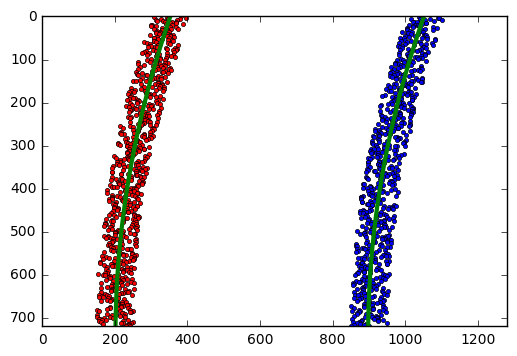

In [16]:
# Generate some fake data to represent lane-line pixels
ploty = np.linspace(0, 719, num=720)# to cover same y-range as image
quadratic_coeff = 3e-4 # arbitrary quadratic coefficient
# For each y position generate random x position within +/-50 pix
# of the line base position in each case (x=200 for left, and x=900 for right)
leftx = np.array([200 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                              for y in ploty])
rightx = np.array([900 + (y**2)*quadratic_coeff + np.random.randint(-50, high=51) 
                                for y in ploty])

leftx = leftx[::-1]  # Reverse to match top-to-bottom in y
rightx = rightx[::-1]  # Reverse to match top-to-bottom in y


# Fit a second order polynomial to pixel positions in each fake lane line
left_fit = np.polyfit(ploty, leftx, 2)
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fit = np.polyfit(ploty, rightx, 2)
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

# Plot up the fake data
mark_size = 3
plt.plot(leftx, ploty, 'o', color='red', markersize=mark_size)
plt.plot(rightx, ploty, 'o', color='blue', markersize=mark_size)
plt.xlim(0, 1280)
plt.ylim(0, 720)
plt.plot(left_fitx, ploty, color='green', linewidth=3)
plt.plot(right_fitx, ploty, color='green', linewidth=3)
plt.gca().invert_yaxis() # to visualize as we do the images

In [17]:
# Define y-value where we want radius of curvature
# I'll choose the maximum y-value, corresponding to the bottom of the image
y_eval = np.max(ploty)
left_curverad = ((1 + (2*left_fit[0]*y_eval + left_fit[1])**2)**1.5) / np.absolute(2*left_fit[0])
right_curverad = ((1 + (2*right_fit[0]*y_eval + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
print(left_curverad, right_curverad)
# Example values: 1926.74 1908.48

1818.36580653 1783.97622126


In [18]:
# Define conversions in x and y from pixels space to meters
ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meters per pixel in x dimension

# Fit new polynomials to x,y in world space
left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
# Calculate the new radii of curvature
left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
# Now our radius of curvature is in meters
print(left_curverad, 'm', right_curverad, 'm')
# Example values: 632.1 m    626.2 m

597.123244057 m 585.836296674 m
